## imports 

In [1]:
import os, sys, gc, re
import itertools
import json
import pickle
from collections import defaultdict
from tqdm.auto import tqdm, trange
from multiprocess import Pool

import pandas as pd    
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as snso
import scipy.special
from scipy import stats

import Rbeast

# Text highlighting HTML
from IPython.core.display import display, HTML
import weasyprint

from forking_paths import *
from forking_paths.text_viz import text_colors_html, text_base_html

# Ignore warnings  - groupby and plotting can be noisy
import warnings
warnings.simplefilter(action='ignore')  #, category=FutureWarning)

/var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_44500/3771721.py:20: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [668]:
base_therefore[0]['choice']['text']

' C) 9.8 m/s^2'

In [667]:
ans_fn_bytask[task](base_therefore[0]['choice']['text'])

'$\\textit{Other}'

In [670]:
def abcd_fn_2(s, other_tok='*Other'):
    s_ = s.strip().upper()
    if s_ in ('A', 'B', 'C', 'D', 'E'):
        return s_
    else:
        return other_tok

def get_ans_tok_idxs(toks, answer, parse_fn):
    N = len(toks)
    
    for w_len in list(range(1, N+1))[::-1]:
        for i in range(0, N - w_len):
            s = ''.join(  toks[i:i+w_len]  )
            s = parse_fn(s)
            if s == answer:
                return i, w_len
    return 0, N

def get_baseline_final_lp(baseline_ans, parse_fn=last_letter_ans_fn, other_tok=r'$\it{Other}$'):
    top_lps = baseline_ans[0]['choice']['logprobs']['top_logprobs']
    toks = baseline_ans[0]['choice']['logprobs']['tokens']
    toks_p = baseline_ans[0]['choice']['logprobs']['token_logprobs']

    answer = parse_fn(baseline_ans[0]['choice']['text'])

    a_i, a_l = get_ans_tok_idxs(toks, answer, parse_fn)
    if a_l == 1:
        alt_toks = {k: np.exp(v) for k, v in top_lps[a_i].items()}
    else:
        ans_probs = toks_p[a_i : a_i + a_l]
        ans_prob = np.exp(np.mean(ans_probs))
        alt_toks = {answer: ans_prob, other_tok: 1 - ans_prob}

    baseline_df = pd.DataFrame([{'ans': k.strip(), 'ext_p': v} for k, v in alt_toks.items()])
    baseline_df['baseline'] = 'last_token'
    return baseline_df

    
    """
    # Sum extension probabilities for each pseudo-token
    lps_parsed = defaultdict(lambda: 0)
    for k, v in lps.items():
        k_ = parse_fn(k)
        lps_parsed[k_] += np.exp(v)

    # Normalize probs
    Z = sum(lps_parsed.values())
    lps_parsed = {k: v/Z for k, v in sorted(lps_parsed.items())}

    # Convert dict to df
    baseline_df = pd.DataFrame(lps_parsed.items(), columns=['ans', 'ext_p'])
    """
   
    
def get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn):
    base_resample_df = answers_to_df(
        [base_resamples_ans], [base_resamples], response_extends=None, 
        is_chat_answer=True, ans_parse_fn=ans_parse_fn)

    # Extension logprob to prob, normalize extensions so  \sum_ext p(ext | fork) = 1
    base_resample_df['ext_p'] = np.exp(base_resample_df['ext_lp'])
    base_resample_df['ext_p'] /= base_resample_df['ext_p'].sum()

    # Convert to dataframe
    baseline_resample = base_resample_df[['ans', 'ext_p']].groupby('ans').aggregate('sum').reset_index()
    baseline_resample = baseline_resample.sort_values(by='ext_p', ascending=False).reset_index(drop=True)
    baseline_resample['baseline'] = 'sample'
    # baseline_resample['idx'] = -1
    # baseline_resample['tok'] = None
    # baseline_resample['tok_p'] = 1
    return baseline_resample

def get_baseline_conf(base_therefore, base_conf, parse_fn=last_letter_ans_fn, other_tok=r'$\it{Other}$'):
    # therefore_tok = base_therefore[0]['choice']['logprobs']['tokens'][0]
    # therefore_tok = parse_fn(therefore_tok)
    # other_tok = f'Not: {therefore_tok}'
    therefore_ans = parse_fn(base_therefore[0]['choice']['text'].split(')')[0])     #### TODO -- splitting like this is SUPER hacky and should be fixed ASAP

    conf = int(float(
        base_conf[0]['choice']['text'].split('%')[0]))

    rows = [{'ans': therefore_ans, 'ext_p': conf / 100, 'baseline': 'percent'},
            {'ans': other_tok, 'ext_p': 1 - (conf/100), 'baseline': 'percent'}]
    return pd.DataFrame(rows)

def get_baseline_df(idx_df, base_therefore, base_resamples, base_resamples_ans, base_conf, 
                    parse_fn=last_letter_ans_fn, other_tok=r'$\it{Other}$'):
    
    baseline_df_s    = get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=parse_fn)
    baseline_df_lp   = get_baseline_final_lp(base_therefore, parse_fn=parse_fn, other_tok=other_tok)
    baseline_df_conf = get_baseline_conf(base_therefore, base_conf, parse_fn=parse_fn, other_tok=other_tok)
    
    
    ans_set = idx_df['ans'].cat.categories.tolist()
    ans_set = [i for i in ans_set if i != other_tok]
    
    baseline_df_s['ans'] = baseline_df_s['ans'].apply(lambda x: other_tok if x not in ans_set else x)
    baseline_df_s = baseline_df_s[['ans', 'ext_p']].groupby(['ans']).aggregate('sum').reset_index()
    baseline_df_s['baseline'] = 'sample'

    baseline_df_lp['ans'] = baseline_df_lp['ans'].apply(lambda x: other_tok if x not in ans_set else x)
    baseline_df_lp = baseline_df_lp[['ans', 'ext_p']].groupby(['ans']).aggregate('sum').reset_index()
    baseline_df_lp['baseline'] = 'last_token'
    
    baseline_df = pd.concat([
        baseline_df_s.sort_values(by=['ans']),
        baseline_df_lp.sort_values(by=['ans']),
        baseline_df_conf.sort_values(by=['ans'])
    ])
    
    return baseline_df.reset_index(drop=True)

# --------------------------------------------------------------------------------------------

def get_percentile_cp_interp(posts, percentile=.1, interp=5):
    m_max = len(posts)
    interp1d = scipy.interpolate.interp1d(range(m_max), posts)
    
    xs = np.linspace(0, m_max-1, m_max*interp)
    ys = [interp1d(i) / interp   for i in xs]

    csum = np.cumsum(ys)
    return xs[ np.where(csum >= percentile)[0][0] ]

In [3]:


def run_beast(idx_df, dist_fn = 'd_l1'):
    dist_df = get_dists(idx_df)
    dist_df = dist_df.sort_values(by='idx')
    
    ## y = jitter_lim(y, .01)
    y = dist_df[dist_fn].to_numpy()
    time  = dist_df['idx'].to_numpy()
    
    range_y = y.max() - y.min()
    
    # alpha2_d = {'d_kl': 10.0 + (1000 ** (1.0 - range_y)),
    #             'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
    #             'd_l2': 5.0  + (1000 ** (1.0 - range_y))}
    
    alpha2_d = {'d_kl': 20.0 + (1000 ** (1.0 - range_y)),
                'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
                'd_l2': 5.0  + (1000 ** (1.0 - range_y))}
    
    alpha2 = alpha2_d[dist_fn]
    
    
    o = Rbeast.beast(y, time=time, season='none',
                     tcp_minmax=[0, 6],  torder_minmax=[1, 1], tseg_minlength=10,
                     mcmc_seed=0, mcmc_chains=9,
                     mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
                     # mcmc_burnin=200, mcmc_samples=8000, mcmc_thin=5,
                     print_progress=False, print_options=False, quiet=True, 
                     
                     precPriorType='constant', precValue=10,   # manually set \nu = 10   (TODO: should this be 1.5?)
                     alpha1=.01,                 # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                     alpha2=alpha2,              # min alpha2: MIN_ALPHA2_VALUE=.0001
                     
                     dump_mcmc=True,
                     #### Default values for alpha1/2, delta1/2: 1.0   (or 1e-8??)
                     ####   Source: https://github.com/zhaokg/Rbeast/blob/master/Source/beastv2_io_in_args.c#L758
                     ####   Alt??:  https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                    )
    # [0.00541511]
    # print(np.sqrt(o.sig2))
    return o, y, time

def plot_cpd_panel(
        base_tokens, idx_df, o, y, time,   # TODO: y  -- drift
        baseline_ans, base_resamples, base_resamples_ans, base_conf,
        normalize=True, title=None, figsize=(12, 6), parse_fn=None, palette='viridis_r', **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)

    # ==================================================================
    outcome_colors = sns.color_palette(palette=palette, n_colors=len(set(idx_df['ans'])))  # + [(.9, .3, .1)]
    sns.set_palette(outcome_colors)
    # ==================================================================
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=(1.0, .99))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distrib. $o_t$', fontweight='bold')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    
    
    # ------------------------------------------------------------------------------------------
    ax_bases = plt.subplot2grid(subs_size, (0, time_size+1), colspan=2, rowspan=stack_size-1)
    
    baseline_df = get_baseline_df(idx_df, baseline_ans, base_resamples, base_resamples_ans, base_conf, parse_fn=parse_fn)

    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).scale(color=outcome_colors) \
         .on(ax_bases).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = plt.gcf().legends.pop(0)
    leg.set_visible(False)

    
    ax_bases.set_xticks([0, 1, 2], labels=['Initial $o_t$', 'Last Token', '% Confidence'])
    ax_bases.set_yticks([])
    ax_bases.set_xlabel('Baselines', fontweight='bold')
    ax_bases.set_ylabel(None)
    ax_bases.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax_bases, left=True)

    # ------------------------------------------------------------------------------------------
    sns.set_palette('tab10')
    
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='darkviolet')
    ax_dist.set_ylabel('Drift  $y_t$', fontweight='bold')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr, color='orchid')
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ y)$', fontweight='bold')
    ax_tau.set_xlabel('Token Index  $t$', fontweight='bold')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_m = plt.subplot2grid(subs_size, (stack_size + y2_size + 1, time_size+1), colspan=2, rowspan=y2_size+1)

    ncp_prob = o.trend.ncpPr 

    ax_m.vlines(1, min(ncp_prob), max(ncp_prob), ls='--', color='brown')
    

    ax_m.fill_between(range(1, len(ncp_prob)), ncp_prob[1:], alpha=.5, color='orange')
    ax_m.plot(ncp_prob, color='orange')
    
    
    
    # ax3.set_title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
    ax_m.set_ylabel('p(m | y)', fontweight='bold')
    ax_m.set_xlabel('# Change Points  $m$', fontweight='bold')
    sns.despine(ax=ax_m)


    # ------------------------------------------------------------------------------------------
    plt.title(title)


In [4]:
def get_forktok_ts(idx_tok_df, base_res, key_col='ans', val_col='weighted', sig_dist_thresh=None):
    idx_tok_df = idx_tok_df.copy()
    base_tokens = base_res[0]['choice']['logprobs']['tokens']
    
    # Split answer column into separate columns for each categorical value
    cols = ['idx', 'tok', 'ans']
    df_ = idx_tok_df[cols + ['weighted']].set_index(cols).unstack(['ans']).reset_index()
    df_.columns = [f'ans___{t}' if v == val_col else v for v, t in df_.columns]
    
    ans_cols = [c for c in df_.columns if 'ans___' in c]
    df_ = df_.sort_values(by=['idx', 'tok']).reset_index()

    # Merge tok_p back in
    cols = ['idx', 'tok']
    df_ = df_.merge(idx_tok_df[cols + ['tok_p']].drop_duplicates(cols), how='left', on=cols)

    idxs = idx_tok_df['idx'].cat.categories
    rows = []
    
    for idx in idxs:
        # Df for base path token
        base_tok = base_tokens[idx]
        df_i = df_[df_['idx'] == idx].copy()

        # Get token probs for all other tokens, to use for weighting
        alt_df = df_i[df_i['tok'] != base_tok]
        tp = alt_df['tok_p'].to_numpy()[..., None]

        # Get outcome / answer vectors for base token + alternate tokens
        o_alts = alt_df[ans_cols].to_numpy().astype(float)
        o_base = df_i[df_i['tok'] == base_tok].iloc[0][ans_cols].to_numpy().astype(float)[None, ...]

        # Compute distances d(w*, w_i) for each alternate token w_i relative to base token w*
        row = {
            'idx': idx,
            # Compute distance matrix for each token:   \forall_i  d(w*, w_i)
            'd_l1':  lp_dist_mat(o_base,  o_alts, order=1),
            'd_l2':  lp_dist_mat(o_base,  o_alts),
            'd_cos': cos_dist_mat(o_base, o_alts),
            'd_kl':  KL_div_mat(o_base,   o_alts),
        }

        if sig_dist_thresh is None:
            # Expected [Distance]: weighted average of distances:   \sum_i  d(w*, w_i)  p(w_i)
            row = {k: v if k == 'idx' else (v * tp).sum()
                   for k, v in row.items()}
        else:
            # Expected [d > Threshold]: Computed weighted avg of distances, with weight `1 * p(w_i)` if dist. is big enough, else 0
            row = {k: v if k == 'idx' else ((v >= sig_dist_thresh).astype(int)[..., None] * tp).sum()
                   for k, v in row.items()}
        rows.append(row)
        
    return pd.DataFrame(rows)


In [290]:



def plot_cpd_mini(
        base_tokens, idx_df, o, time,
        normalize=True, title=None, figsize=(12, 6), parse_fn=None, palette='viridis_r', **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 3
    y2_size = 2
    
    subs_size = (stack_size + y2_size + 1, time_size)

    # ==================================================================
    outcome_colors = sns.color_palette(palette=palette, n_colors=len(set(idx_df['ans'])))   #+ [(.9, .3, .1)]
    sns.set_palette(outcome_colors)
    # ==================================================================
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    # if normalize:
    #     pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    # else:
    #     pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    # pt.plot.area(lw=.05, ax=ax_stack)
    # handles, _ = ax_stack.get_legend_handles_labels()

    ################
    
    ans_set =  list(reversed(   idx_df['ans'].cat.categories.tolist()   ))
    ys = []
    for ans in ans_set:
        idx_df_a = idx_df[idx_df['ans'] == ans]
        idx_df_a = idx_df_a.sort_values(by='idx')
        ys.append(idx_df_a['weighted'])
    
    ax_stack.stackplot(idx_df_a['idx'], ys, labels=ans_set, colors= list(reversed(outcome_colors)),   linewidth=0)
    
    ax_stack.legend()
    handles, labels = ax_stack.get_legend_handles_labels()
    
    plt.legend(ax_stack,    # loc='right',     
               handles=list(reversed(handles)), labels=list(reversed(labels)),
               bbox_to_anchor=(1.0, .9))   #loc='right')
    ################


    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    # plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
    #            # loc='upper right')
    #            bbox_to_anchor=(1.0, .9))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution\n$o_t$', fontweight='bold', fontsize=12)
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    

    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr, color='orchid')
    ax_tau.set_ylabel('Change Point Prob. \n$p(\\tau = t  \ | \ y)$', fontweight='bold', fontsize=12)
    ax_tau.set_xlabel('Token Index  $t$', fontweight='bold', fontsize=12)
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    

    # ------------------------------------------------------------------------------------------
    ax_stack.set_title(title, fontsize=16, style='italic')

def jitter_lim(y, var=.3):
    # y = jitter_lim(y, add_noise)
    y = y + np.random.normal(0.0, var, size=y.shape)
    y[y < 0.0] = 0.0
    y[y > 1.0] = 1.0
    return y



def run_beast(idx_df, dist_fn = 'd_l1', add_noise = .05):
    dist_df = get_dists(idx_df)
    dist_df = dist_df.sort_values(by='idx')
    
    y = dist_df[dist_fn].to_numpy()
    y = jitter_lim(y, add_noise)
    time  = dist_df['idx'].to_numpy()
    
    range_y = y.max() - y.min()
    
    # alpha2_d = {'d_kl': 10.0 + (1000 ** (1.0 - range_y)),
    #             'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
    #             'd_l2': 5.0  + (1000 ** (1.0 - range_y))}
    
    alpha2_d = {'d_kl': 20.0 + (1000 ** (1.0 - range_y)),
                'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
                'd_l2': 5.0  + (1000 ** (1.0 - range_y))}
    
    alpha2 = alpha2_d[dist_fn]
    
    
    o = Rbeast.beast(y, time=time, season='none',
                     tcp_minmax=[0, 6],  torder_minmax=[1, 1], tseg_minlength=10,
                     mcmc_seed=0, mcmc_chains=9,
                     mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
                     # mcmc_burnin=200, mcmc_samples=8000, mcmc_thin=5,
                     print_progress=False, print_options=False, quiet=True, 
                     
                     precPriorType='constant', 
                     precValue=20,  #10     # manually set \nu = 10   (TODO: should this be 1.5?)
                     alpha1=.01,    #.01             # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                     alpha2=alpha2,              # min alpha2: MIN_ALPHA2_VALUE=.0001
                     
                     dump_mcmc=True,
                     #### Default values for alpha1/2, delta1/2: 1.0   (or 1e-8??)
                     ####   Source: https://github.com/zhaokg/Rbeast/blob/master/Source/beastv2_io_in_args.c#L758
                     ####   Alt??:  https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                    )
    # [0.00541511]
    # print(np.sqrt(o.sig2))
    return o, y, time



# single example

In [9]:
# print(base_res[0]['prompt_raw'])

In [306]:
# base_dir = './out/gpt3.5-instruct-30s-300t'

# fname = './out/samples-mmlu_30s-1temp-100tok-1k_prompt2'
# fname = f'{base_dir}/GSM8k/97'                # unstable: 97, 
# fname = f'{base_dir}/AQuA/60927'              # unstable: 60927, 58402     stable: 64038, 90779, 82737       unsure: 39581, 
# fname = f'{base_dir}/StoryCloze_2Choice/274'   # stable: 10, 587, 1699, 1275         weakly unstable:  274, 1787, 1497
# fname = f'{base_dir}/HotpotQA/79442'          # amazing: 79442        numeric interesting: 58902
# fname = f'{base_dir}/LastLetter/342'
# fname = f'{base_dir}/CoinFlip/170'
# fname = f'{base_dir}/MMLU/19'


# base_dir = './out/gpt3.5-instruct-test-9_9'

# fname = f'{base_dir}/AQuA/95'
# fname = f'{base_dir}/AQuA/92683'
# fname = f'{base_dir}/HotpotQA/89656'


base_dir = './out/gpt3.5-instruct-test_gemini_X'

# fname = f'{base_dir}/AQuA/14'
# fname = f'{base_dir}/MMLU/12'  #60'  #12'  72    62 (cpd model bad tho)
# fname = f'{base_dir}/LastLetter/266'  #266'  # 136, 220
# fname = f'{base_dir}/GSM8k/97'  # 85
# fname = f'{base_dir}/HotpotQA/30010'  # 85
# fname = f'{base_dir}/MMLU/72'  # 85
fname = f'{base_dir}/MMLU/3'
# fname = f'{base_dir}/GSM8k/98'
# fname = f'{base_dir}/CoinFlip/1217'  # 136, 220
# fname = f'{base_dir}/HotpotQA/8076'  #7119





task = fname.split('/')[-2]

(base_res, response_extends, samples_by_ext, ans_by_ext, 
 base_therefore, base_conf, base_resamples, base_resamples_ans) \
    = pickle.load(open(f'{fname}.pk', 'rb'))
 # baseline_ans, base_resamples, base_resamples_ans) \

base_tokens = base_res[0]['choice']['logprobs']['tokens']
args_json = json.load(open(f'{fname}.json'))

ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                       ans_parse_fn=ans_fn_bytask[task])           #(response_extends, ans_by_ext, parse_fn)
idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')


ans_df['ext_len'] = ans_df['ext_lps'].apply(lambda x: len(x))

print(base_res[0]['prompt'])
print('~'*80)
print(base_res[0]['choice']['text'][:200] + '\n . . . ')
print('~'*80)
# print('True Answer: ', args_json['row']['answer'])       # HotpotQA
# print('True Answer: ', args_json['row']['correct'])    # AQuA
# print('True Answer: ', args_json['row']['answer'].split('#### ')[1])    # GSM8k

gc.collect();

Question:
Doses of substances used in animal toxicity studies are usually many times greater than those experienced by people because:

Choices:
A) Animals are generally much less sensitive than people
B) Such tests can detect only very large risks because of the fact that only small numbers of animals can be used
C) It is difficult in such studies to determine whether the observed toxic effects were caused by the substance
D) It is the only way to ensure results are applicable to people

Answer:
Let's think step by step.
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
 

First, we need to understand why animal toxicity studies are conducted. These studies are done to determine the potential harmful effects of a substance on living organisms. This information is the
 . . . 
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


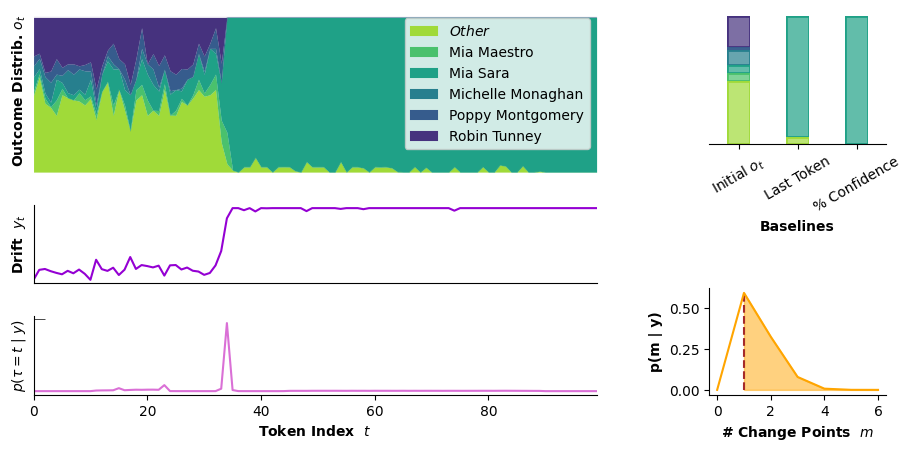

In [21]:
o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)

plot_cpd_panel(
    base_tokens, idx_df,   o, y, time,
    base_therefore, base_resamples, base_resamples_ans, base_conf,
    figsize=(11, 5), parse_fn=ans_fn_bytask[task], #palette='coolwarm_r'
)

# plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
plt.tight_layout(pad=0)
# plt.savefig('out/cpd-panel_letter.pdf')
# plt.savefig('out/cpd-panel_mmlu.pdf')
# plt.savefig('out/cpd-panel_gsm.pdf')
# plt.savefig('out/cpd-panel_hotpot.pdf')
# plt.show()

In [987]:
get_percentile_cp_interp(o.trend.ncpPr, .1, interp=20)

0.5611510791366907

In [898]:
print(base_res[0]['prompt_raw'])

Question:
The Space Shuttle orbits 300 km above the Earth’s surface; the Earth’s radius is 6400 km. What is the acceleration due to Earth’s gravity experienced by the Space Shuttle?

Choices:
A) 4.9 m/s^2
B) 8.9 m/s^2
C) 9.8 m/s^2
D) 10.8 m/s^2

Answer:
Let's think step by step.


In [896]:
args_json['row']

{'question': 'The Space Shuttle orbits 300 km above the Earth’s surface; the Earth’s radius is 6400 km. What is the acceleration due to Earth’s gravity experienced by the Space Shuttle?',
 'subject': 'high_school_physics',
 'choices': ['4.9 m/s^2', '8.9 m/s^2', '9.8 m/s^2', '10.8 m/s^2'],
 'answer': 1,
 'input_formatted': 'The following are multiple choice questions (with answers) about high school physics.\n\nWhich of the following conditions will ensure that angular momentum is conserved? I. Conservation of linear momentum II. Zero net external force III. Zero net external torque\nA. I and II only\nB. I and III only\nC. II and III only\nD. III only\nAnswer: D\n\nA pipe full of air is closed at one end. A standing wave is produced in the pipe, causing the pipe to sound a note. Which of the following is a correct statement about the wave’s properties at the closed end of the pipe?\nA. The pressure is at a node, but the particle displacement is at an antinode.\nB. The pressure is at an 

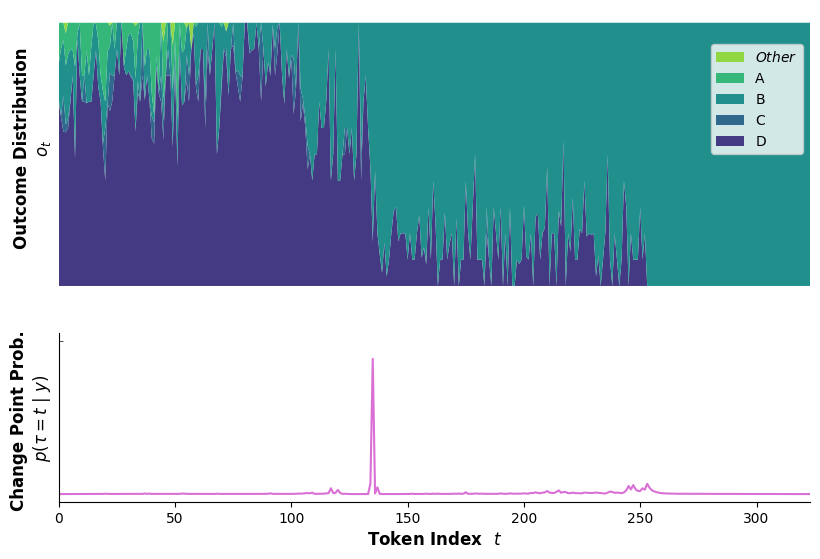

In [307]:

idx_df, idx_tok_df = get_idx_df(ans_df.groupby(['idx', 'tok']).sample(n=10), 
                                tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')


o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)

plot_cpd_mini(
    base_tokens, idx_df,   o, time,
    figsize=(8, 6), parse_fn=ans_fn_bytask[task], #palette='coolwarm_r'
    # title='GSM8k - Question 97'
)

# plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
plt.tight_layout(pad=0)
# plt.savefig('out/appendix/cpd-_HotpotQA-30010.pdf')
# plt.savefig('out/appendix/cpd-_MMLU-72.pdf')
plt.savefig('out/appendix/cpd-_MMLU-3.pdf')

# plt.savefig('out/cpd-minimal_gsm.pdf')
# plt.savefig('out/cpd-minimal_hotpot_.pdf')
# plt.savefig('out/cpd-minimal_mmlu.pdf')
plt.show()

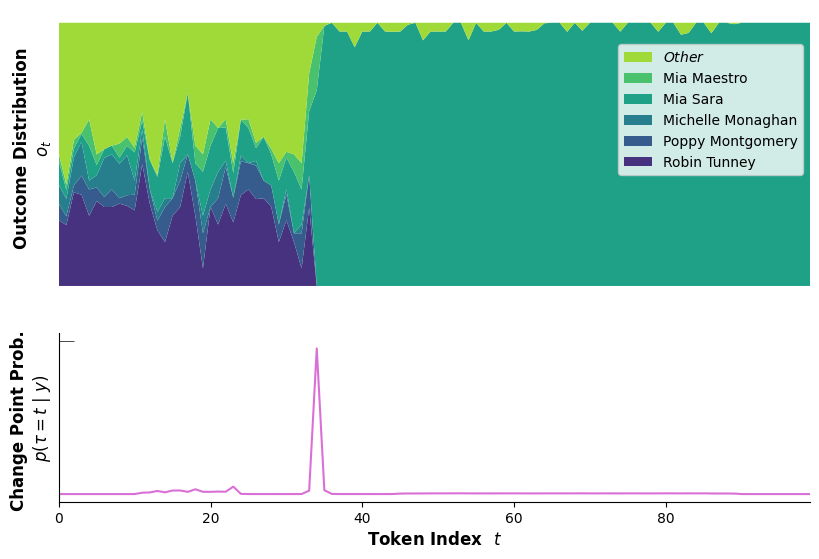

In [106]:

rows = []

for n_resample in [3, 5, 7, 10, 20, 30]:
    idx_df, idx_tok_df = get_idx_df(ans_df.groupby(['idx', 'tok']).sample(n=n_resample), 
                                    tok_weighted=True, ext_weighted=True, 
                                    normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                    weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')

    o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)

    rows += [{'n': n_resample, 'cp_pr': i, 't': t} for t, i in enumerate(o.trend.cpOccPr)]

cp_df = pd.DataFrame(rows)

"""
sns.lineplot(data=cp_df, x='t', y='cp_pr', hue='n')


t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])


plt.rcParams['figure.figsize'] = (10, 2.5)

plt.ylabel('Change Point Prob. \n$p(\\tau = t  \ | \ y)$', fontweight='bold', fontsize=12)
plt.xlabel('Token Index  $t$', fontweight='bold', fontsize=12)
plt.yticks([])  # [0, 1.0])
plt.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
plt.xlim(t_min, t_max)
sns.despine()



plt.show()

"""


# sns.scatterplot(x=cp_df[cp_df['n'] == 3]['cp_pr'], y=cp_df[cp_df['n'] == 30]['cp_pr'])
    


"\nsns.lineplot(data=cp_df, x='t', y='cp_pr', hue='n')\n\n\nt_min, t_max = min(idx_df['idx']), max(idx_df['idx'])\n\n\nplt.rcParams['figure.figsize'] = (10, 2.5)\n\nplt.ylabel('Change Point Prob. \n$p(\\tau = t  \\ | \\ y)$', fontweight='bold', fontsize=12)\nplt.xlabel('Token Index  $t$', fontweight='bold', fontsize=12)\nplt.yticks([])  # [0, 1.0])\nplt.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')\nplt.xlim(t_min, t_max)\nsns.despine()\n\n\n\nplt.show()\n\n"

In [66]:
max(cp_df[cp_df['n'] == 3]['cp_pr'])

0.876122236251831

#### correlate hazards and p(tau)

In [379]:
dist_fn = 'd_l2'
dist_threshs = [.6, .9]
thresh_col = r'$\epsilon$ Threshold'


survive_dfs = []


for task in tqdm(ans_dfs):
    if task == 'StoryCloze_Open':
        continue
    for qa_id in tqdm(ans_dfs[task]):
            
        idx_tok_df = idx_tok_dfs[task][qa_id]
        base_res = all_base_res[task][qa_id]
        
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        
        for dist_thresh in dist_threshs:
            thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
            thresh_df[thresh_col] = str(dist_thresh)
            thresh_df['task'] = task
            thresh_df['qa_id'] = qa_id
        
            # Cumulative product of   p(survival_t)
            #   https://stackoverflow.com/a/27912352/4248948
            thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])
            survive_dfs.append(thresh_df)

all_survive_df = pd.concat(survive_dfs).sort_values(by='task').reset_index(drop=True)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [331]:
rows = []

for task in o_trends:
    for qa_id, o_trend in o_trends[task].items():
        for t, p_tau in enumerate(o_trend['cpOccPr']):
            rows.append({'task': task, 'qa_id': qa_id, 'idx': t, 'cp_pr': p_tau})

cp_p_df = pd.DataFrame(rows)

In [340]:
max(cp_p_df.idx), max(all_survive_df.idx)

(522, 522)

In [380]:
thresh_df

,idx,d_l1,d_l2,d_cos,d_kl,$\epsilon$ Threshold,task,qa_id,survival
0,0,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
1,1,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
2,2,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
3,3,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
4,4,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
5,5,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
6,6,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
7,7,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
8,8,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0
9,9,0.0,0.0,0.0,0.0,0.9,CoinFlip,6958,1.0


In [378]:
max(all_survive_df['d_l2'])

0.4294475957577204

In [347]:
cp_p_df.shape

(36589, 4)

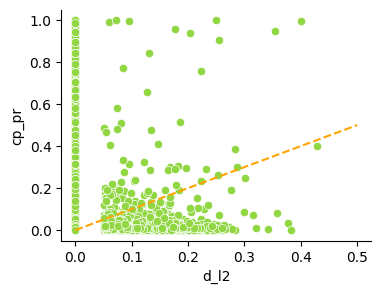

In [462]:
df_ = all_survive_df.merge(cp_p_df, on=['task', 'qa_id', 'idx']).copy()
# df_['d_l2']  = df_['d_l2'].clip(1e-3)
# df_['cp_pr'] = df_['cp_pr'].clip(1e-3)

sns.scatterplot(
    df_,
    x='d_l2', 
    y='cp_pr',
)
# plt.xlim(0, .5)
# plt.xscale('log')
# plt.yscale('log')

sns.despine()

plt.plot([0, .5], [0, .5], ls='--', color='orange');

In [322]:
cp_df_all.head()

,n,dist,t,task,qa_id
0,3,0.071072,0,StoryCloze_2Choice,1645
1,3,0.012741,1,StoryCloze_2Choice,1645
2,3,0.002194,2,StoryCloze_2Choice,1645
3,3,0.019419,3,StoryCloze_2Choice,1645
4,3,0.115035,4,StoryCloze_2Choice,1645


In [422]:
all_survive_df[thresh_col]

0        0.6
1        0.6
2        0.6
3        0.6
4        0.6
        ... 
73173    0.9
73174    0.9
73175    0.9
73176    0.9
73177    0.6
Name: $\epsilon$ Threshold, Length: 73178, dtype: object

In [424]:
all_survive_df[(all_survive_df['task'] == task) & (all_survive_df['qa_id'] == qa_id)][thresh_col]

69869    0.9
69870    0.9
69871    0.9
69872    0.9
69873    0.9
        ... 
70125    0.9
70126    0.9
70127    0.9
70128    0.9
73177    0.6
Name: $\epsilon$ Threshold, Length: 174, dtype: object

##### final survival rate vs. number of changepoints sum(cpOccPr)

In [463]:
dist_thresh = .6

rows = []


for task in tqdm(ans_dfs):
    if task == 'StoryCloze_Open':
        continue
    for qa_id in ans_dfs[task]:
            
        idx_tok_df = idx_tok_dfs[task][qa_id]
        base_res = all_base_res[task][qa_id]
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        o_trend = o_trends[task][qa_id]

        # thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
        # thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])

        est_n_cp = get_percentile_cp_interp(o_trend['ncpPr'], percentile=.1, interp=5) 
        survive_df = all_survive_df[(all_survive_df['task'] == task) & 
                                    (all_survive_df['qa_id'] == qa_id) & 
                                    (all_survive_df[thresh_col] == '0.6')]
        final_survival = survive_df[survive_df['idx'] == survive_df['idx'].max()]['survival'].tolist()[0]
        
        rows.append({'task': task, 'qa_id': qa_id,
                     'final_survival': final_survival, 'est_n_cp': est_n_cp})

surv_cp_df = pd.DataFrame(rows)

  0%|          | 0/7 [00:00<?, ?it/s]

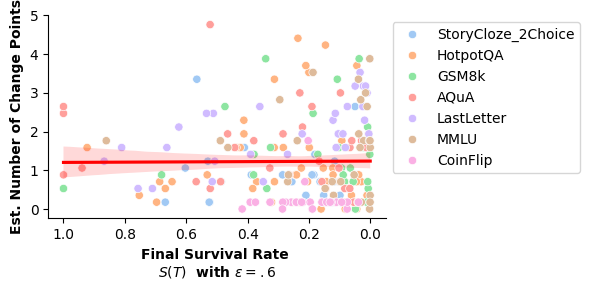

In [691]:
plt.rcParams['figure.figsize'] = (6, 3)
sns.set_palette('pastel')

# surv_cp_df['log_survival'] = np.log(surv_cp_df['final_survival'].clip(1e-5))

sns.scatterplot(
    surv_cp_df,
    y='est_n_cp',
    x='final_survival',
    hue='task'
)


sns.regplot(
    surv_cp_df,
    y='est_n_cp',
    x='final_survival',
    scatter=False,
    color='red'
)

plt.xlabel('Final Survival Rate \n$S(T) $  with $\\epsilon = .6$', fontweight='bold')
plt.ylabel('Est. Number of Change Points', fontweight='bold')
sns.despine()

# plt.xscale('log')
# plt.ylim(0, 5)
# plt.xlim(0, 1)
plt.gca().invert_xaxis()

plt.legend(bbox_to_anchor=(1.0, 1.0));
plt.tight_layout()

plt.savefig('./out/appendix/corr_ncp-survive.pdf', bbox_inches='tight');

##### correlation of log prob vs. CP prob

In [473]:
## final survival rate vs. number of changepoints sum(cpOccPr)
rows = []
for task in tqdm(ans_dfs):
    for qa_id in ans_dfs[task]:
        
        base_res = all_base_res[task][qa_id]
        base_lps = base_res[0]['choice']['logprobs']['token_logprobs']
        o_trend = o_trends[task][qa_id]


        survive_df = all_survive_df[(all_survive_df['task'] == task) & 
                                    (all_survive_df['qa_id'] == qa_id) & 
                                    (all_survive_df[thresh_col] == '0.6')]
    
        for t, cp_pr in enumerate(o_trend['cpOccPr']):
            lp = base_lps[t]
            hazard = survive_df[survive_df['idx'] == t]['d_l2'].tolist()[0]
            rows.append({'task': task, 'qa_id': qa_id, 'idx': t,
                         'cp_pr': cp_pr, 'lp': lp, 'p': np.exp(lp), 'hazard': hazard})

cp_lp_df = pd.DataFrame(rows)

  0%|          | 0/7 [00:00<?, ?it/s]

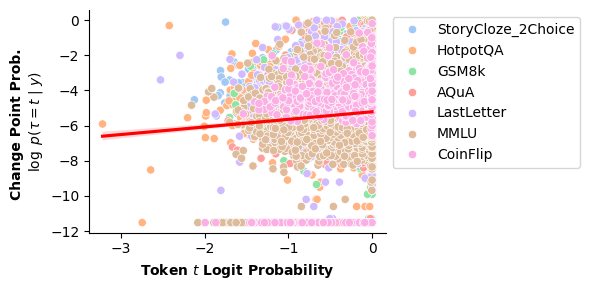

In [692]:
plt.rcParams['figure.figsize'] = (6, 3)

cp_lp_df['cp_lpr'] = np.log(cp_lp_df['cp_pr'].clip(1e-5))

sns.scatterplot(
    cp_lp_df,
    y='cp_lpr',
    x='lp',
    hue='task'
)
plt.legend(bbox_to_anchor=(1.0, 1.0));


sns.regplot(
    cp_lp_df,
    y='cp_lpr',
    x='lp',
    scatter=False,
    fit_reg=True,
    color='red',
    # hue='task'
)

plt.xlabel('Token $t$ Logit Probability', fontweight='bold')
plt.ylabel('Change Point Prob. \n$\log \ p(\\tau = t  \ |  \ y)$', fontweight='bold')
sns.despine()

plt.tight_layout()
plt.savefig('./out/appendix/corr_cp-logit.pdf');

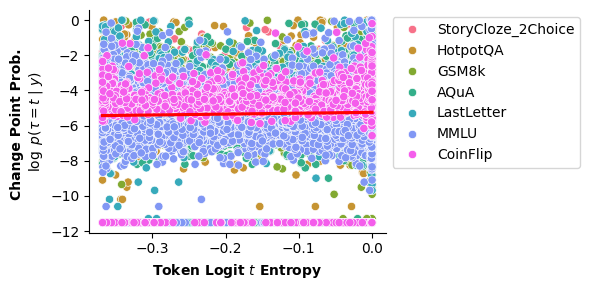

In [540]:
plt.rcParams['figure.figsize'] = (6, 3)

cp_lp_df['entropy'] = cp_lp_df['p'] * cp_lp_df['lp']

sns.scatterplot(
    cp_lp_df,
    y='cp_lpr',
    x='entropy',
    hue='task'
)
plt.legend(bbox_to_anchor=(1.0, 1.0));


sns.regplot(
    cp_lp_df,
    y='cp_lpr',
    x='entropy',
    scatter=False,
    fit_reg=True,
    color='red',
    # hue='task'
)

plt.xlabel('Token Logit $t$ Entropy', fontweight='bold')
plt.ylabel('Change Point Prob. \n$\log \ p(\\tau = t  \ |  \ y)$', fontweight='bold')
sns.despine()
plt.tight_layout()

plt.savefig('./out/appendix/corr_cp-logit.pdf');

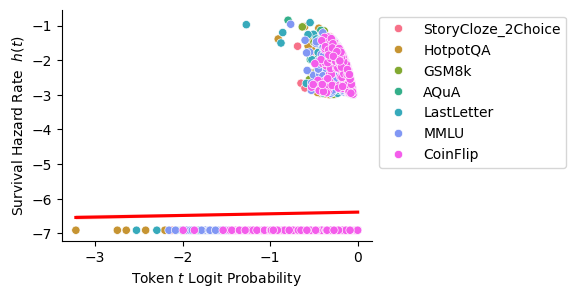

In [498]:
plt.rcParams['figure.figsize'] = (4, 3)

cp_lp_df['h_lp'] = np.log(cp_lp_df['hazard'].clip(1e-3))

sns.scatterplot(
    cp_lp_df,
    y='h_lp',
    x='lp',
    hue='task'
)
plt.legend(bbox_to_anchor=(1.0, 1.0));


sns.regplot(
    cp_lp_df,
    y='h_lp',
    x='lp',
    scatter=False,
    fit_reg=True,
    color='red',
    # hue='task'
)

plt.xlabel('Token $t$ Logit Probability')
plt.ylabel('Survival Hazard Rate  $h(t)$')

sns.despine()

# plt.ylim(0, 5)
# plt.xlim(0, 1)
# plt.gca().invert_xaxis()



#### Note: I don't think we want to show this since h(t) is already weighted by token probability, so interpreting this is weird

#### baseline bar chats

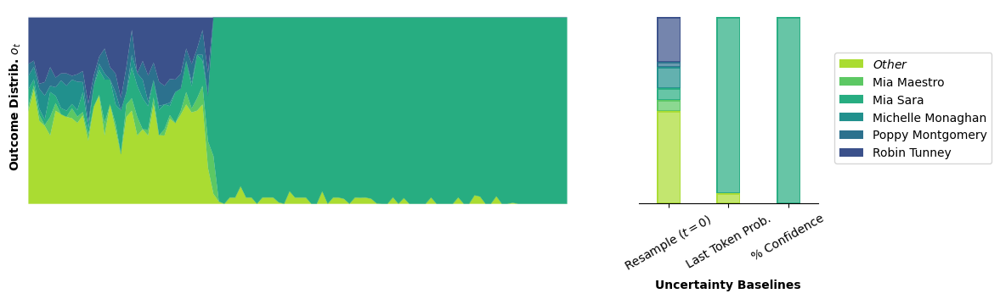

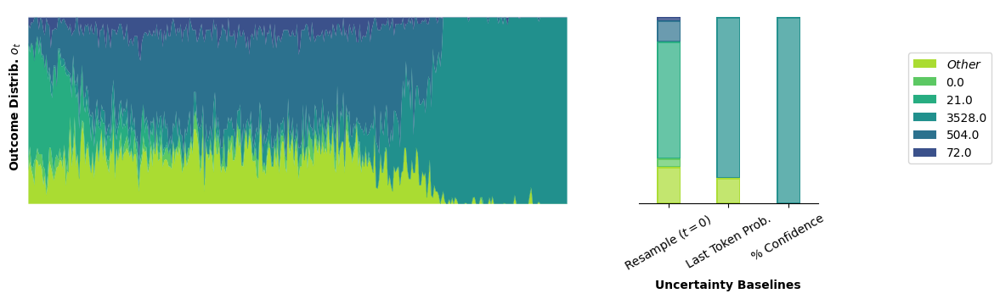

In [678]:

def plot_cpd_panel_baselines(
        base_tokens, idx_df,
        baseline_ans, base_resamples, base_resamples_ans, base_conf,
        normalize=True, title=None, figsize=(12, 6), parse_fn=None, palette='viridis_r', **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    _, axs = plt.subplots(1, 2, width_ratios=[3, 1])

    # ==================================================================
    outcome_colors = sns.color_palette(palette=palette, n_colors=len(set(idx_df['ans'])) + 1)  # + [(.9, .3, .1)]
    sns.set_palette(outcome_colors)

    baseline_df = get_baseline_df(idx_df, baseline_ans, base_resamples, base_resamples_ans, base_conf, parse_fn=parse_fn)

    # Convert baseline df to use categorical values so colors match
    categories = idx_df['ans'].cat.categories 
    # categories = sorted(categories) if any([('.0' in a) for a in set(idx_df['ans'])]) else categories
    baseline_df['ans'] = pd.Categorical( baseline_df['ans'], categories=categories)
    # idx_df['ans'] = pd.Categorical( idx_df['ans'], categories=categories)
   
    
    # ==================================================================

    ax = axs[0]
    
    # ax_stack = plt.subplot2grid((subs_size, 1), (0, 0), colspan=size1, rowspan=1)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax)

    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax.set_xlim(t_min, t_max)

    ax.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax.set_ylabel('Outcome Distrib. $o_t$', fontweight='bold')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel(None)
    sns.despine(ax=ax, left=True, bottom=True)

    # ax.get_legend().remove()
    # ax.legend(bbox_to_anchor=(.5, .5))
    ax.legend(bbox_to_anchor=(1.8, .8))
    
    
    
    # ------------------------------------------------------------------------------------------
    ax = axs[1] 

    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).scale(color=outcome_colors) \
         .on(ax).plot()

    # plt.gcf().legends[0].set_bbox_to_anchor((1.2, 0.5))  #set_visible(False)  #
    # plt.gcf().legends[0].set_bbox_to_anchor((.5, 0.5))  #set_visible(False)  #
    plt.gcf().legends[0].set_visible(False)  #


    # sns.move_legend(ax, "center right")

    # # Remove legend from seaborn objects plot
    # #   https://stackoverflow.com/a/73634440/4248948
    # leg = plt.gcf().legends.pop(0)
    # leg.set_visible(False)

    
    # handles, _ = ax.get_legend_handles_labels()
    # plt.legend(#handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
    #            # loc='upper right')
    #            bbox_to_anchor=(1.0, .99))   #loc='right')

    # plt.legend(bbox_to_anchor=(-0.02, 1), ncol=3, bbox_transform=ax.transAxes)

    # ax.get_legend().remove()
    # ax.legend(bbox_to_anchor=(2, 0))
    
    
    ax.set_xticks([0, 1, 2], labels=['Resample ($t=0$)', 'Last Token Prob.', '% Confidence'])
    ax.set_yticks([])
    ax.set_xlabel('Uncertainty Baselines', fontweight='bold')
    ax.set_ylabel(None)
    ax.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax, left=True)
    
    plt.title(title)



paper_qas = [
    ('HotpotQA', '8076'),
    # ('MMLU', '12'),   ### these plots look wrong -- I think it's just because of the coloring ordering, but I can't be bothered to fix this right now....
    ('GSM8k', '59'),
]



# for task in tqdm(ans_dfs):
#     for qa_id in list(ans_dfs[task].keys())[:5]:


for task, qa_id in paper_qas:
    idx_df = idx_dfs[task][qa_id]
    base_res = all_base_res[task][qa_id]
    base_tokens = base_res[0]['choice']['logprobs']['tokens']
    
    fname = f'{base_dir}/{task}/{qa_id}.pk'
    (_, _, _, _, base_therefore, base_conf, base_resamples, base_resamples_ans) = pickle.load(open(fname, 'rb'))
    
    
    plot_cpd_panel_baselines(
            base_tokens, idx_df,
            base_therefore, base_resamples, base_resamples_ans, base_conf,
            title=None, figsize=(12, 3), parse_fn=ans_fn_bytask[task])

    # plt.tight_layout()
    plt.savefig(f'./out/appendix/baselines_{task}-{qa_id}.pdf', 
                bbox_extra_artists=plt.gcf().legends, bbox_inches='tight')
    plt.show()

In [659]:
??extract_ans.abcd_fn

Signature: extract_ans.abcd_fn(s)
Docstring: <no docstring>
Source:   
def abcd_fn(s):
    s = s.strip()
    return s if s in ('A', 'B', 'C', 'D') else r'$\textit{Other}'
File:      ~/research/forks/forking_paths/extract_ans.py
Type:      function

In [ ]:
##### NOTE:
# there's are problems with the outcome parsing in `get_baseline_final_lp` and `get_baseline_conf` -- this is what causes MMLU-12 results to look wonky

In [665]:
get_baseline_final_lp(base_therefore, parse_fn=ans_fn_bytask[task], other_tok=r'$\it{Other}$')

,ans,ext_p,baseline
0,$\textit{Other},0.929074,last_token
1,$\it{Other}$,0.070926,last_token


In [664]:
base_therefore[0]['choice']

{'finish_reason': 'stop',
 'index': 0,
 'logprobs': {'text_offset': [1262,
   1264,
   1265,
   1266,
   1267,
   1268,
   1269,
   1271,
   1273,
   1274],
  'token_logprobs': [-0.6476541,
   -0.007856811,
   -0.0035338984,
   -0.0009142052,
   -0.00012713818,
   -8.375538e-05,
   -0.0012855908,
   -0.00027158734,
   -0.0003706126,
   -0.00017934572],
  'tokens': [' C', ')', ' ', '9', '.', '8', ' m', '/s', '^', '2'],
  'top_logprobs': [{' C': -0.6476541,
    ' \n': -1.6892095,
    '\n': -2.321116,
    ' \n\n': -2.6188626,
    '\n\n': -3.031878,
    ' ': -3.8183694,
    ' A': -4.334948,
    ' Option': -4.838183,
    ' Choice': -5.311978,
    'C': -5.798966,
    ' "': -5.9887395,
    ' (': -6.1637254,
    ' option': -6.4043374,
    '  \n': -6.653689,
    ' D': -6.9769692,
    ' choice': -7.0595193,
    ' [': -7.2132726,
    ' B': -7.2391114,
    ' <': -7.28929,
    ' **': -7.361111,
    ' c': -7.436188,
    '\n\n\n': -7.606961,
    '  \n\n': -7.6131215,
    ' Answer': -7.715489,
    '.\

In [660]:
baseline_df_ = get_baseline_df(idx_df, base_therefore, base_resamples, base_resamples_ans, base_conf, parse_fn=ans_fn_bytask[task])

baseline_df_['ans'] = pd.Categorical( baseline_df_['ans'], categories=idx_df['ans'].cat.categories)

baseline_df_

,ans,ext_p,baseline
0,$\it{Other}$,0.020095,sample
1,A,0.038263,sample
2,B,0.569473,sample
3,C,0.355547,sample
4,D,0.016621,sample
5,$\it{Other}$,1.000000,last_token
6,$\it{Other}$,0.000000,percent
7,NaN,1.000000,percent


In [652]:
baseline_df_ = get_baseline_df(idx_df, base_therefore, base_resamples, base_resamples_ans, base_conf, parse_fn=ans_fn_bytask[task])

baseline_df_['ans'] = pd.Categorical( baseline_df_['ans'], categories=idx_df['ans'].cat.categories)

baseline_df_

,ans,ext_p,baseline
0,$\it{Other}$,0.194606,sample
1,0.0,0.048356,sample
2,21.0,0.624880,sample
3,504.0,0.114840,sample
4,72.0,0.017318,sample
5,$\it{Other}$,0.138076,last_token
6,3528.0,0.861924,last_token
7,$\it{Other}$,0.000000,percent
8,3528.0,1.000000,percent


In [596]:
%debug

> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_44500/185753675.py(55)plot_cpd_panel_baselines()
     53          .on(ax).plot()
     54 
---> 55     raise ValueError()
     56     plt.gcf().legends[0].set_bbox_to_anchor((0.6, 0.25))
     57 



ipdb>  plt.gcf().legends


[]


ipdb>  plt.gcf().legends[0]


*** IndexError: list index out of range


ipdb>  q


<Figure size 1200x300 with 0 Axes>

#### estimate sample size -- kind of like a power analysis

(0.0, 0.9901500344276428)

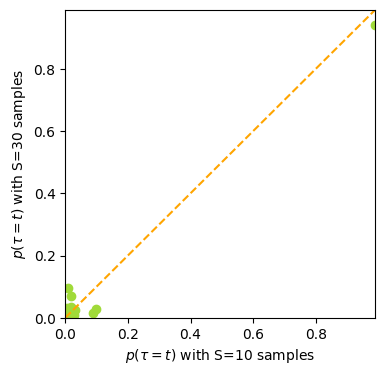

In [139]:
plt.rcParams['figure.figsize'] = (4, 4)

n_resample = 10
eps = 1e-5

x_min = cp_df['cp_pr'].min()
x_max = cp_df['cp_pr'].max()
plt.plot([0, 1], [0, 1], color='orange', ls='--')

plt.scatter(x=cp_df[cp_df['n'] == n_resample]['cp_pr']   + eps, 
            y=cp_df[cp_df['n'] == 30]['cp_pr']           + eps)

plt.xlabel(f'$p(\\tau = t)$ with S={n_resample} samples')
plt.ylabel(f'$p(\\tau = t)$ with S=30 samples')
plt.yscale('log')
plt.xscale('log')

plt.xlim(x_min, x_max)
plt.ylim(x_min, x_max)

In [153]:
import plotnine as p9
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap
from plotnine.data import mtcars

In [150]:
cp_df_ = cp_df.copy().sort_values(by=['n', 't'])
cp_df_ = cp_df_[cp_df_['n'] != 30]

cp_max_n = cp_df[cp_df['n'] == 30]['cp_pr']
cp_df_['cp_max_n'] = np.tile(cp_max_n, len(set(cp_df_['n'])))

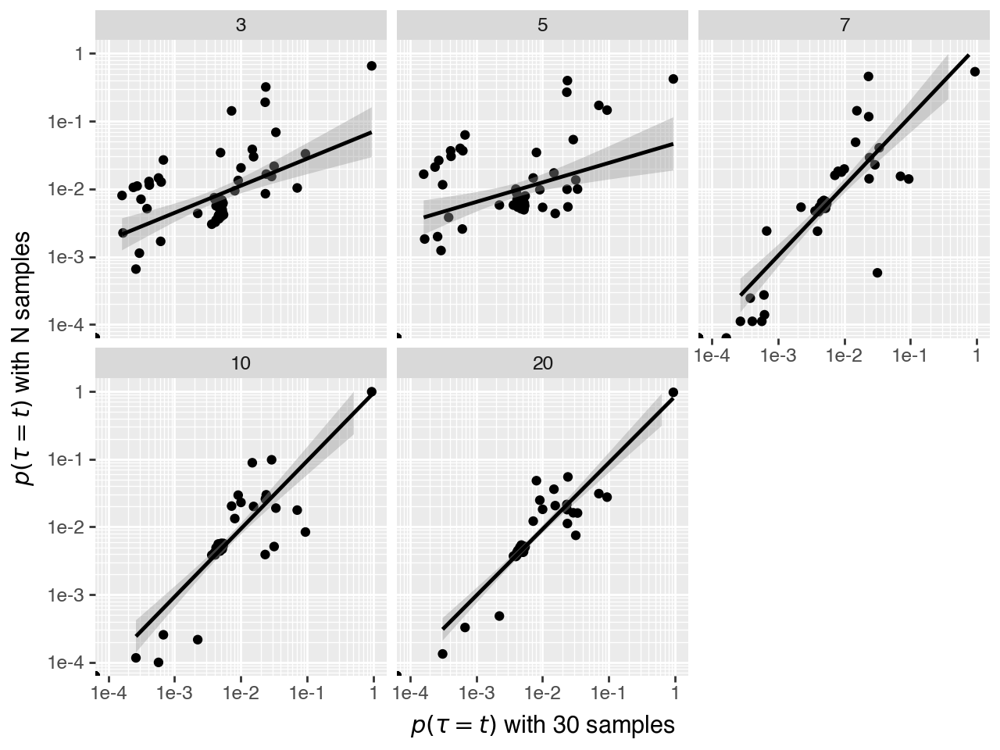

In [165]:
eps = 1e-4

(
    ggplot(cp_df_, aes('cp_max_n', 'cp_pr')) #, color='factor(task)'))
    + geom_point()
    + stat_smooth(method='lm')
    + facet_wrap('n')
    + p9.scale_y_log10(limits=(eps, 1))    # + p9.scale_y_continuous(limits=(0, 1))
    + p9.scale_x_log10(limits=(eps, 1))
    + p9.xlab('$p(\\tau = t)$ with 30 samples')
    + p9.ylab('$p(\\tau = t)$ with N samples')
)

In [251]:
def pivot_and_align(df1, df2):
    pivoted1 = df1.pivot(index='idx', columns='ans')['weighted'].sort_index()
    pivoted2 = df2.pivot(index='idx', columns='ans')['weighted'].sort_index()
    
    columns1 = set(pivoted1.columns) - set(pivoted2.columns)
    columns2 = set(pivoted2.columns) - set(pivoted1.columns)
    
    for c1 in columns1:
        pivoted2[c1] = 0.0
        
    for c2 in columns2:
        pivoted1[c2] = 0.0
    
    all_cols = list(set(pivoted1.columns) | set(pivoted2.columns))
    
    pivoted1 = pivoted1[all_cols]
    pivoted2 = pivoted2[all_cols]
    return pivoted1.to_numpy(), pivoted2.to_numpy()

In [256]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cosine as cosine_dist

In [257]:
rows = []

for task in tqdm(os.listdir(base_dir)):
    if task == 'StoryCloze_Open':
        continue
        
    # for qa_id in tqdm(os.listdir(f'{base_dir}/{task}')):
    qa_ids = np.random.choice(os.listdir(f'{base_dir}/{task}'), size=10, replace=False)
    
    for qa_id in tqdm(qa_ids):
        
        if '.pk' not in qa_id:
            continue
        qa_id = qa_id.split('.')[0]
                
        fname = f'{base_dir}/{task}/{qa_id}'
        task = fname.split('/')[-2]

        try:
            (base_res, response_extends, samples_by_ext, ans_by_ext, 
             _, _, _, _) \
                = pickle.load(open(f'{fname}.pk', 'rb'))
        except:
            (base_res, response_extends, sacmples_by_ext, ans_by_ext, 
             _, _, _) \
                = pickle.load(open(f'{fname}.pk', 'rb'))
        
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        args_json = json.load(open(f'{fname}.json'))
        
        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])

        idx_df_30, idx_tok_df_30 = get_idx_df(ans_df, 
                                            tok_weighted=True, ext_weighted=True, 
                                            normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                            weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')
        
    
        for n_resample in [1, 3, 5, 7, 10, 20]:
            idx_df, idx_tok_df = get_idx_df(ans_df.groupby(['idx', 'tok']).sample(n=n_resample), 
                                            tok_weighted=True, ext_weighted=True, 
                                            normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                            weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')

            pivoted, pivoted_30 = pivot_and_align(idx_df, idx_df_30)
            
            cos_dists = [cosine_dist(p, p_30) for p, p_30 in zip(pivoted, pivoted_30)]
            
            rows += [{'n': n_resample, 'dist': d, 't': t, 'task': task, 'qa_id': qa_id} 
                      for t, d in enumerate(cos_dists)]
            
        
        
        """
            o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)
        
            rows += [{'n': n_resample, 'cp_pr': i, 't': t, 'task': task, 'qa_id': qa_id} 
                     for t, i in enumerate(o.trend.cpOccPr)]
        """

cp_df_all = pd.DataFrame(rows)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
p9.geom_histogram

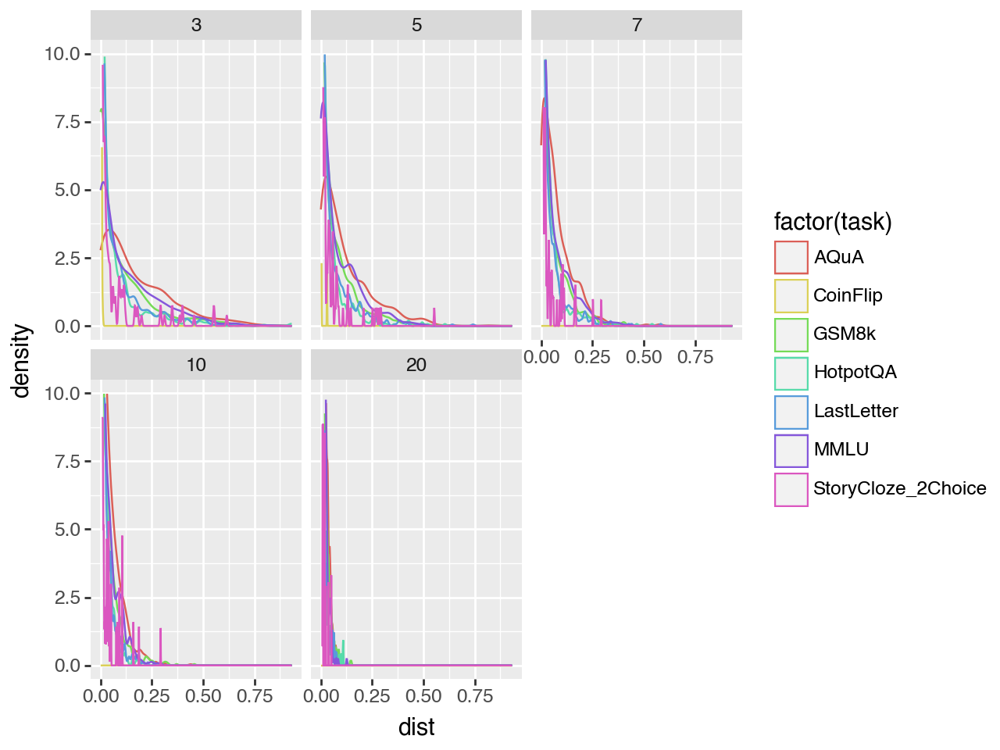

In [274]:
eps = 1e-4

(
    ggplot(cp_df_all, aes('dist', color='factor(task)'))
    # + geom_point()
    # + stat_smooth(method='lm')
    # + p9.geom_histogram()
    + p9.geom_density()
    + facet_wrap('n')
    + p9.theme(subplots_adjust={'vspace': 200})
     # legend_position="top",
     # plot_title=element_text(ha="left"),
    # + p9.scale_y_log10()
    # + p9.scale_x_log10(limits=(eps, 1))
    + p9.scale_y_continuous(limits=(0, 10))
    # + p9.scale_x_continuous(limits=(0, 1))
    # + p9.xlab('$p(\\tau = t)$ with 30 samples')
    # + p9.ylab('$p(\\tau = t)$ with N samples')
)

In [188]:
cp_df

,n,cp_pr,t,task,qa_id
0,3,0.0,0,StoryCloze_2Choice,10
1,3,0.0,1,StoryCloze_2Choice,10
2,3,0.0,2,StoryCloze_2Choice,10
3,3,0.0,3,StoryCloze_2Choice,10
4,3,0.0,4,StoryCloze_2Choice,10
...,...,...,...,...,...
35737,30,0.0,65,CoinFlip,16813
35738,30,0.0,66,CoinFlip,16813
35739,30,0.0,67,CoinFlip,16813
35740,30,0.0,68,CoinFlip,16813


In [228]:
cp_df = cp_df_all.copy()
cp_dfs = []

for task in set(cp_df['task']):
    for qa_id in set(cp_df['qa_id']):
        cp_df_ = cp_df[(cp_df['task'] == task) & (cp_df['qa_id'] == qa_id)]
        cp_df_ = cp_df_.copy().sort_values(by=['n', 't']).reset_index()
        
            
        cp_max_n = cp_df_[cp_df_['n'] == 30]['cp_pr']
        cp_df_ = cp_df_[cp_df_['n'] != 30]
        
        cp_df_['cp_max_n'] = np.tile(cp_max_n, len(set(cp_df_['n'])))
        cp_dfs.append(cp_df_)

cp_df_ = pd.concat(cp_dfs)

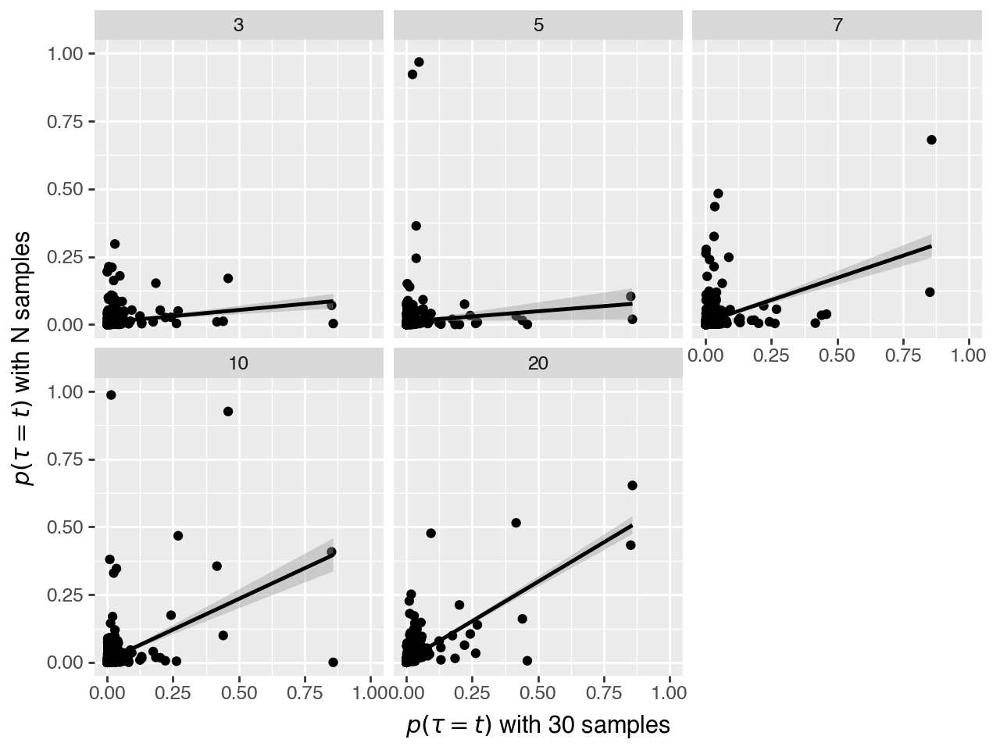

In [229]:
eps = 1e-4

(
    ggplot(cp_df_[cp_df_['task'] == 'LastLetter'], aes('cp_max_n', 'cp_pr')) #, color='factor(task)'))
    + geom_point()
    + stat_smooth(method='lm')
    + facet_wrap('n')
    # + p9.scale_y_log10(limits=(eps, 1))
    # + p9.scale_x_log10(limits=(eps, 1))
    + p9.scale_y_continuous(limits=(0, 1))
    + p9.scale_x_continuous(limits=(0, 1))
    + p9.xlab('$p(\\tau = t)$ with 30 samples')
    + p9.ylab('$p(\\tau = t)$ with N samples')
)

In [693]:
###### ATTEMPT 2 ELECTRIC BOOGALOO  -- let's compare .1 quantile estimate for # change points instead!!!!!


rows = []

for task in tqdm(os.listdir(base_dir)):
    if task == 'StoryCloze_Open':
        continue
        
    # for qa_id in tqdm(os.listdir(f'{base_dir}/{task}')):
    qa_ids = np.random.choice(os.listdir(f'{base_dir}/{task}'), size=10, replace=False)
    
    for qa_id in tqdm(qa_ids):
        
        if '.pk' not in qa_id:
            continue
        qa_id = qa_id.split('.')[0]
                
        fname = f'{base_dir}/{task}/{qa_id}'
        task = fname.split('/')[-2]

        try:
            (base_res, response_extends, samples_by_ext, ans_by_ext, 
             _, _, _, _) \
                = pickle.load(open(f'{fname}.pk', 'rb'))
        except:
            (base_res, response_extends, samples_by_ext, ans_by_ext, 
             _, _, _) \
                = pickle.load(open(f'{fname}.pk', 'rb'))
        
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        args_json = json.load(open(f'{fname}.json'))
        
        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])

        o_trend_30 = o_trends[task][qa_id]
        est_m_30 = get_percentile_cp_interp(o_trend_30['ncpPr'], percentile=.1, interp=5) 
        
    
        for n_resample in [1, 3, 5, 7, 10, 20]:
            idx_df, idx_tok_df = get_idx_df(ans_df.groupby(['idx', 'tok']).sample(n=n_resample), 
                                            tok_weighted=True, ext_weighted=True, 
                                            normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                            weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')

            o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)

            est_m = get_percentile_cp_interp(o.trend.ncpPr, percentile=.1, interp=5) 
        
            rows.append({
                'task': task, 'qa_id': qa_id, 'n_resample': n_resample,
                'est_m_30': est_m_30, 'est_m': est_m})

sample_est_m_df = pd.DataFrame(rows)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [696]:
sample_est_m_df.head()

,task,qa_id,n_resample,est_m_30,est_m
0,StoryCloze_2Choice,341,1,2.647059,0.529412
1,StoryCloze_2Choice,341,3,2.647059,2.294118
2,StoryCloze_2Choice,341,5,2.647059,1.588235
3,StoryCloze_2Choice,341,7,2.647059,0.705882
4,StoryCloze_2Choice,341,10,2.647059,0.705882


In [771]:
spears = []

for n_resample in sorted(  set(sample_est_m_df['n_resample'])  ):
    df_ = sample_est_m_df[sample_est_m_df['n_resample'] == n_resample]
    x = df_['est_m']
    y = df_['est_m_30']
    
    spear = stats.spearmanr(x, y)
    print(n_resample, spear.correlation, spear.pvalue)

    spears.append(f'{spear.correlation:.2f}'[1:])

1 0.629626082178877 2.9789985443403974e-05
3 0.7129918212777504 7.359734420636861e-07
5 0.5369147784636249 0.0006122501479990646
7 0.6098641713760149 6.146449863053564e-05
10 0.7738821474212236 1.9391944975340186e-08
20 0.882380877994319 5.231351066526325e-13


['.63', '.71', '.54', '.61', '.77', '.88']

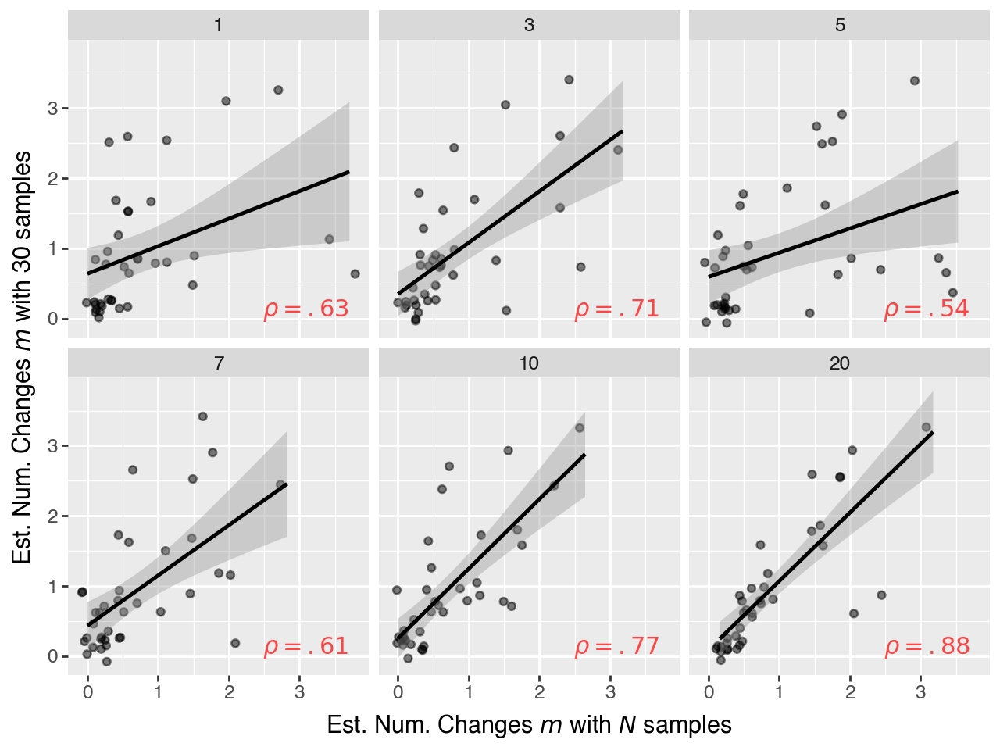

In [785]:
eps = 1e-4

p = (
    ggplot(sample_est_m_df, aes('est_m', 'est_m_30'))   #, color='factor(task)'))
    # ggplot(sample_est_m_df, aes('est_m', 'est_m_30', color='factor(task)'))
    # + geom_point()
    + p9.geom_jitter(width=.1, height=.1, alpha=.5)
    + stat_smooth(method='lm')
    

    # + p9.annotate("text", x=3, y=4, label='$\\rho = .62$', color='red')
    + p9.geom_text(p9.aes(label = 'txt'), data = pd.DataFrame({'txt': [f'$\\rho = {rho}$' for rho in spears],
                                                               'n_resample': sorted(set(  sample_est_m_df['n_resample']))  }), 
                   x = 3.7, y = .3, color = 'red', va = 'top', ha = 'right', alpha=.7)

    + facet_wrap('n_resample')

    + p9.ylab('Est. Num. Changes $m$ with 30 samples')
    + p9.xlab('Est. Num. Changes $m$ with $N$ samples')
)

p.save(filename='./out/appendix/sample_corr.pdf')

p

### close to deadline

In [275]:
def to_cat(series):
    return pd.Categorical(series, categories=sorted(set(series)))

##### load all outcomes + CPD results

In [318]:
base_dir     = './out/gpt3.5-instruct-test_gemini_X'

ans_dfs = defaultdict(lambda: defaultdict(dict))
idx_dfs = defaultdict(lambda: defaultdict(dict))
idx_tok_dfs = defaultdict(lambda: defaultdict(dict))
o_trends = defaultdict(lambda: defaultdict(dict))
all_base_res = defaultdict(lambda: defaultdict(dict))

for task in tqdm(os.listdir(base_dir)):
    if task == 'StoryCloze_Open':
        continue
    for qa_id in tqdm(os.listdir(f'{base_dir}/{task}')):
        if '.pk' not in qa_id:
            continue
        qa_id = qa_id.split(".")[0]

        
        # fname = f'{base_dir}/{task}/{qa_id}'
        dir_post = f'{base_dir}_POST/{task}/{qa_id}'

        ans_dfs[task][qa_id] = pd.read_csv(f'{dir_post}/ans_df.csv')
        idx_dfs[task][qa_id] = pd.read_csv(f'{dir_post}/idx_df.csv')
        idx_tok_dfs[task][qa_id] = pd.read_csv(f'{dir_post}/idx_tok_df.csv')

        idx_dfs[task][qa_id]['idx'] = to_cat(idx_dfs[task][qa_id]['idx'])
        idx_dfs[task][qa_id]['ans'] = to_cat(idx_dfs[task][qa_id]['ans'])
        idx_tok_dfs[task][qa_id]['idx'] = to_cat(idx_tok_dfs[task][qa_id]['idx'])
        idx_tok_dfs[task][qa_id]['ans'] = to_cat(idx_tok_dfs[task][qa_id]['ans'])
        
        o_trends[task][qa_id] = pickle.load(open(f'{dir_post}/trend.pk', 'rb'))
        all_base_res[task][qa_id] = pickle.load(open(f'{dir_post}/base_res.pk', 'rb'))

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

In [1588]:

fnames = ['AQuA/62', 'AQuA/160', 'MMLU/58']

palette = 'viridis_r'


# for task in tqdm(idx_dfs.keys()):
#     for qa_id in tqdm(  np.random.choice(list(idx_dfs[task].keys()), size=10, replace=False)  ):
#         fname = f'{task}/{qa_id}'
        
for fname in fnames:
    task, qa_id = fname.split('/')[-2:]

    
    idx_df = idx_dfs[task][qa_id]
    
    ress = pickle.load(open(f'{out_path}/{fname}.pk', 'rb'))
    base_res = ress[0]
    base_tokens = base_res[0]['choice']['logprobs']['tokens']


    o, y, time = run_beast(idx_df, dist_fn = 'd_l2', add_noise=.03)
    
    plot_cpd_mini(
        base_tokens, idx_df,   o, time,
        figsize=(8, 6), parse_fn=ans_fn_bytask[task], #palette='coolwarm_r'
        # title='GSM8k - Question 97'
    )
    
    # plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    plt.tight_layout(pad=0)
    # plt.savefig('out/cpd-minimal_gsm.pdf')
    plt.savefig(f'out/appendix/cpd-_{task}-{qa_id}.pdf')
    # plt.savefig('out/cpd-minimal_mmlu.pdf')
    ######### plt.show()
    plt.clf()
    
    # ------------------------------------------------
    
    cp_probs = 1 - o.trend.cpOccPr     # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])
    
    p_tau_cap = .2
    cp_probs[(cp_probs < p_tau_cap)] = p_tau_cap  # TODO: cap p(tau) so color only gets so red
    
    
    
    s = text_colors_html(base_tokens, cp_probs.tolist(),  prompt=base_res[0]['prompt_raw'].replace('\n', '<br>'),
                         print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True),
                        width=450, height='550px',  #'300px'  #'450px'   # width=390
                         add_start_tok = ' ', #'. . .\n\n',
                        # width=370, height='500px'
                        )   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))
    
    ######## display(HTML(s))
    pdf = weasyprint.HTML(string=s).write_pdf()
    open(f'out/appendix/text-_{task}-{qa_id}.pdf', 'wb').write(pdf)

<Figure size 800x600 with 0 Axes>

In [1247]:
###gsm_beast = o, y, time

In [1230]:
args_json['row']['answer'].split('#### ')[1]

'15'

In [772]:
o.trend.ncpPr

array([0.40187225, 0.50696665, 0.09116111, 0.        ], dtype=float32)

In [778]:
get_percentile_cp(o.trend.ncpPr, .1)

4

In [296]:
from forking_paths.text_viz import *
def text_colors_html(tokens, probs, prompt=None, c_map=sns.color_palette('YlOrRd_r', as_cmap=True), print_newln=True, width=500, height='400px', 
                     add_start_tok='. . .'):

    if (add_start_tok is not None):
        if prompt is not None:
            add_start_tok = ' '
        tokens = [add_start_tok] + tokens
        probs = probs + [1.0]
    
    # ## Normalized log probs
    # base_probs = -np.array(base_res[0]['choice']['logprobs']['token_logprobs'])
    # base_probs /= (base_probs.max() - base_probs.min())
    # -webkit-print-color-adjust: exact;   color-adjust: exact; print-color-adjust: exact;  

    # tokens = [' '] + tokens

    highlighted = ''.join([
        ('<div class="tooltip" style="display: inline;"><span style="color: black; font-size=16pt; background-color: ' +
                      rgb_to_htmlstr(c_map(prob)) + 
                      ' !important ;">' +
                  (token.replace('\n', '<br>') if print_newln else token.replace('\n', '\\n')) +      # .replace(' ', '&nbsp;')
        f'</span><span class="tooltiptext"> {t} </span></div>')
        for token, prob, t in zip(tokens, probs, range(len(tokens)))])
    
    if prompt is not None:
        # prompt_text = '<span style="color: black; background-color: #cfffd3; font-size=16pt; !important;">' + prompt + '</span>'
        prompt_text = '<span style="color: black; font-size=16pt; !important;">' + prompt + '</span>'
        highlighted = prompt_text + highlighted
    
    s = '''\
    <!DOCTYPE html>
    <html>
    
    <head>
    <style>
    span {
      -webkit-print-color-adjust: exact;
              print-color-adjust: exact;
              color-adjust: exact;        /* this + !important tag are necessary for python html -> pdf */
    }
    
    @page  {
      margin: 0;
      size: ''' + str(width + 20) + 'px ' + height + '''
    }

    // hover tooltip for index
    .tooltip {
        position: relative;
        display: inline-block;
        border-bottom: 1px dotted black;
    }

    .tooltip .tooltiptext {
        visibility: hidden;
        // width: 120px;
        background-color: rgba(0, 0, 0, 0.5); //black;
        color: #fff;
        text-align: center;
        border-radius: 6px;
        padding: 5px 0;

        /* Position the tooltip */
        position: absolute;
        z-index: 1;
    }

    .tooltip:hover .tooltiptext {
        visibility: visible;
    }


    </style>
    </head>
    
    <body>
    <div style="width: ''' + str(width) + '''px; background-color: white !important; line-height:19px;">
    ''' + highlighted + '''
    </div>
    </body>
    </html>'''
    
    return s


In [1018]:
base_res[0]['prompt_raw'], args_json['row']['answer']

("Question:\nWhat American actress born June 19, 1972, was is the film The In-Laws?\n\nAnswer:\nLet's think step by step.",
 'Robin Tunney')

In [1318]:
args_json['row']['answer']

0

In [1277]:
# o, y, time = gsm_beast

In [1379]:
o, y, time = gsm_beast

In [311]:
cp_probs = 1 - o.trend.cpOccPr     # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

p_tau_cap = .2
cp_probs[(cp_probs < p_tau_cap)] = p_tau_cap  # TODO: cap p(tau) so color only gets so red

# c1, c2 = [147, 400]
# c1, c2 = [39, 192]
c1, c2 = [5000, 5000]


# toks = base_tokens
# p_tau = cp_probs
# toks = base_tokens[:c1] + ['<br><br>. . .<br><br>'] + base_tokens[c2:]
# p_tau = cp_probs[:c1].tolist() + [1.0] + cp_probs[c2:].tolist()

toks = base_tokens[:c1] + [] + base_tokens[c2:]
p_tau = cp_probs[:c1].tolist() + [] + cp_probs[c2:].tolist()

s = text_colors_html(toks, p_tau,  prompt=base_res[0]['prompt_raw'].replace('\n', '<br>'),
                     print_newln=True, c_map=sns.color_palette('YlOrRd_r', as_cmap=True),
                    # width=450, height='280px',  #'300px'  #'450px'   # width=390
                     add_start_tok = ' ', #'. . .\n\n',
                    width=700, height='750px'
                    )   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
pdf = weasyprint.HTML(string=s).write_pdf()


open('out/appendix/text-_MMLU-3.pdf', 'wb').write(pdf)
# open('out/appendix/text-_MMLU-72.pdf', 'wb').write(pdf)
# open('out/appendix/text-_HotpotQA-30010.pdf', 'wb').write(pdf)
# open('out/text-cps_gsm.pdf', 'wb').write(pdf)
# open('out/text-cps_mmlu.pdf', 'wb').write(pdf)
# open('out/text-cps_hotpot.pdf', 'wb').write(pdf)
# open('out/text-cps_letter.pdf', 'wb').write(pdf)

15179

In [1571]:
cp_probs = 1 - o.trend.cpOccPr     # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

p_tau_cap = .2
cp_probs[(cp_probs < p_tau_cap)] = p_tau_cap  # TODO: cap p(tau) so color only gets so red



s = text_colors_html(base_tokens, cp_probs.tolist(),  prompt=base_res[0]['prompt_raw'].replace('\n', '<br>'),
                     print_newln=True, c_map=sns.color_palette('YlOrRd_r', as_cmap=True),
                    # width=450, height='280px',  #'300px'  #'450px'   # width=390
                     add_start_tok = ' ', #'. . .\n\n',
                    width=370, height='350px'
                    )   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
pdf = weasyprint.HTML(string=s).write_pdf()
# open('out/text-cps_gsm.pdf', 'wb').write(pdf)
# open('out/text-cps_mmlu.pdf', 'wb').write(pdf)
open('out/text-cps_hotpot.pdf', 'wb').write(pdf)
# open('out/text-cps_letter.pdf', 'wb').write(pdf)

10256

In [1365]:
6.67e-11 * 5.97e24 / (6700000 ** 2)

8.870550233905101

In [1447]:
args_json['row']['choices'], args_json['row']['answer']

(['4.9 m/s^2', '8.9 m/s^2', '9.8 m/s^2', '10.8 m/s^2'], 1)

In [51]:
base_probs = np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])
s = text_colors_html(base_tokens, base_probs, 
                     print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
# pdf = weasyprint.HTML(string=s).write_pdf()
# open('out/test_text_lps.pdf', 'wb').write(pdf)

In [912]:
cp_probs = 1 - o.trend.cpOccPr     # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

s = text_colors_html(base_tokens, cp_probs, 
                     print_newln=True, c_map=sns.color_palette('YlOrRd_r', as_cmap=True),
                    width=390, height='450px'
                    )   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
pdf = weasyprint.HTML(string=s).write_pdf()
# open('out/text-cps_gsm.pdf', 'wb').write(pdf)

In [53]:
tok_dist_df = get_forktok_ts(idx_tok_df, base_res)

tok_dist_df.head()

,idx,d_l1,d_l2,d_cos,d_kl
0,0,0.405015,0.245630,0.214117,0.323484
1,1,0.224287,0.159313,0.021333,0.040651
2,2,0.084375,0.043472,0.012728,0.048138
3,3,0.601951,0.345009,0.133503,0.158694
4,4,0.000000,0.000000,0.000000,0.000000


In [130]:
task = 'GSM8k'
qa_id = '59'

base_res = all_base_res[task][qa_id]
base_tokens = base_res[0]['choice']['logprobs']['tokens']
cp_probs = 1 - o_trends[task][qa_id]['cpOccPr']      #o.trend.cpOccPr     # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])



p_tau_cap = .2
cp_probs[(cp_probs < p_tau_cap)] = p_tau_cap  # TODO: cap p(tau) so color only gets so red


s = text_colors_html(base_tokens, cp_probs.tolist(),  prompt=None,     #base_res[0]['prompt_raw'].replace('\n', '<br>'),
                     print_newln=True, c_map=sns.color_palette('YlOrRd_r', as_cmap=True),
                    # width=450, height='280px',  #'300px'  #'450px'   # width=390
                    # width=370, height='350px'
                     add_start_tok = ' ', #'. . .\n\n',
                    width=650, height='550px'
                    )   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
pdf = weasyprint.HTML(string=s).write_pdf()
open('out/text-cps_gsm.pdf', 'wb').write(pdf)
# open('out/text-cps_mmlu.pdf', 'wb').write(pdf)
# open('out/text-cps_hotpot.pdf', 'wb').write(pdf)
# open('out/text-cps_letter.pdf', 'wb').write(pdf)

15389

In [385]:
dist_fn = 'd_l2'
# dist_threshs = [0, .1, .2, .3, .5, .7]
# dist_threshs = [.2, .4, .6, .7, .8, .9, 1.0]
dist_threshs = [.4, .6, .7, .8, .9, 1.0]
# dist_threshs = [.3, .6]
thresh_col = r'$\epsilon$ Threshold'


thresh_dfs = []
for dist_thresh in tqdm(dist_threshs):
    thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
    thresh_df[thresh_col] = str(dist_thresh)
    thresh_dfs.append(thresh_df)

survive_dfs = []
for dist_thresh in tqdm(dist_threshs):
    thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
    thresh_df[thresh_col] = str(dist_thresh)

    # Cumulative product of   p(survival_t)
    #   https://stackoverflow.com/a/27912352/4248948
    thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])
    
    survive_dfs.append(thresh_df)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

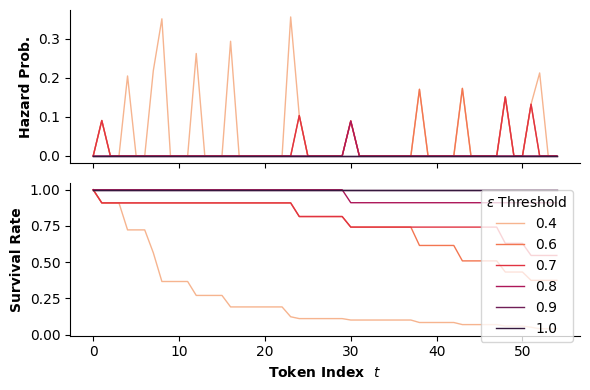

In [386]:
### token-level analysis

palette = 'rocket_r'
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(6, 4))

cols = ['idx', 'tok']
drop_dup_toks = idx_tok_df[cols + ['tok_p']].drop_duplicates(cols)



sns.lineplot(pd.concat(thresh_dfs), x='idx', y=dist_fn,   ax=axs[0], lw=1,
             hue=thresh_col, palette=sns.color_palette(palette, n_colors=len(dist_threshs)))


# axs[-2].set_ylabel('$p( \ d_{t, w} > \epsilon \ )$')
axs[0].legend().remove()
axs[0].set_ylabel('Hazard Prob.', fontweight='bold')




sns.lineplot(pd.concat(survive_dfs), x='idx', y='survival',    ax=axs[1], lw=1,
             hue=thresh_col, palette=sns.color_palette(palette, n_colors=len(dist_threshs)))

sns.despine()

# axs[1].legend().remove()

axs[1].set_ylabel('Survival Rate', fontweight='bold')

sns.despine(ax=axs[0])
sns.despine(ax=axs[1])
axs[-1].set_xlabel('Token Index  $t$', fontweight='bold');

plt.tight_layout()

# plt.savefig('out/survival_hotpot.pdf', bbox_inches='tight')

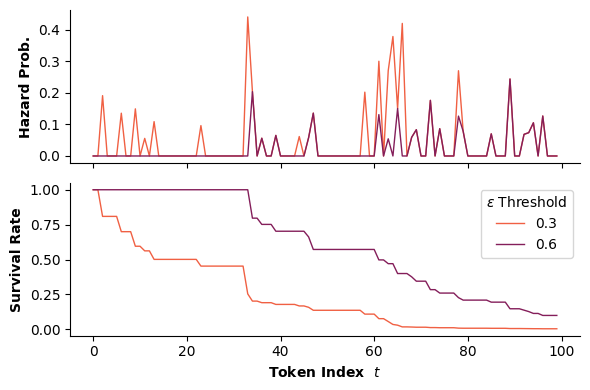

In [1456]:
### token-level analysis

palette = 'rocket_r'
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(6, 4))

cols = ['idx', 'tok']
drop_dup_toks = idx_tok_df[cols + ['tok_p']].drop_duplicates(cols)



sns.lineplot(pd.concat(thresh_dfs), x='idx', y=dist_fn,   ax=axs[0], lw=1,
             hue=thresh_col, palette=sns.color_palette(palette, n_colors=len(dist_threshs)))


# axs[-2].set_ylabel('$p( \ d_{t, w} > \epsilon \ )$')
axs[0].legend().remove()
axs[0].set_ylabel('Hazard Prob.', fontweight='bold')




sns.lineplot(pd.concat(survive_dfs), x='idx', y='survival',    ax=axs[1], lw=1,
             hue=thresh_col, palette=sns.color_palette(palette, n_colors=len(dist_threshs)))

sns.despine()

# axs[1].legend().remove()

axs[1].set_ylabel('Survival Rate', fontweight='bold')

sns.despine(ax=axs[0])
sns.despine(ax=axs[1])
axs[-1].set_xlabel('Token Index  $t$', fontweight='bold');

plt.tight_layout()

# plt.savefig('out/survival_hotpot.pdf', bbox_inches='tight')

In [542]:
v1 = np.array([.5, .5])
v2 = np.array([.85, .15])

sum((v1 - v2) ** 2) ** .5

0.49497474683058323

In [108]:
base_dir

'./out/gpt3.5-instruct-test_gemini_X'

In [312]:
dist_fn = 'd_l2'
# dist_threshs = [0, .1, .2, .3, .5, .7]
# dist_threshs = [.2, .4, .6, .7, .8, .9, 1.0]
# dist_threshs = [.4, .6, .8, .9, 1.0]
dist_threshs = [.6]
thresh_col = r'$\epsilon$ Threshold'



fnames = ['HotpotQA/8076', 'MMLU/12', 'GSM8k/59']    #'GSM8k/97']

survive_dfs = []

for fname in tqdm(fnames):
    task, qa_id = fname.split('/')
    idx_tok_df = idx_tok_dfs[task][qa_id]
    base_res = all_base_res[task][qa_id]

    # ress = pickle.load(open(f'{out_path}/{fname}.pk', 'rb'))
    # base_res = ress[0]
    
    base_tokens = base_res[0]['choice']['logprobs']['tokens']
    
    for dist_thresh in dist_threshs:
        thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
        thresh_df[thresh_col] = str(dist_thresh)
        thresh_df['task'] = f'{task} - {qa_id}'
    
        # Cumulative product of   p(survival_t)
        #   https://stackoverflow.com/a/27912352/4248948
        thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])
        
        survive_dfs.append(thresh_df)

all_survive_df = pd.concat(survive_dfs).sort_values(by='task').reset_index(drop=True)

  0%|          | 0/3 [00:00<?, ?it/s]

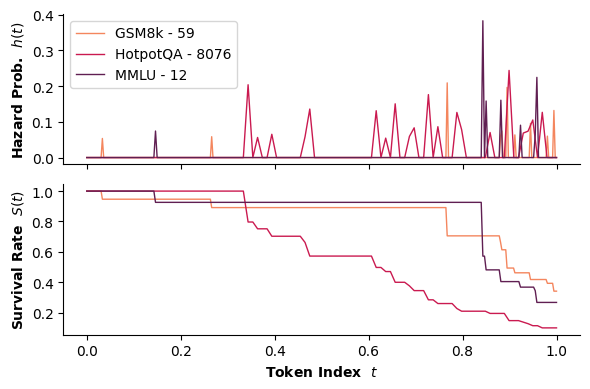

In [111]:
### token-level analysis

palette = 'rocket_r'
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(6, 4))

all_survive_df_ = all_survive_df.copy()
max_ids = all_survive_df_[['task','idx']].groupby('task').aggregate('max').reset_index()
max_ids = max_ids.rename({'idx': 'max_idx'}, axis=1)
all_survive_df_ = all_survive_df_.merge(max_ids, on='task', how='left')
all_survive_df_['idx'] /= all_survive_df_['max_idx']


sns.lineplot(all_survive_df_, x='idx', y=dist_fn,   ax=axs[0], lw=1,
             hue='task', palette=palette)


axs[0].set_ylabel('Hazard Prob.  $h(t)$', fontweight='bold')


sns.lineplot(all_survive_df_, x='idx', y='survival',    ax=axs[1], lw=1,
             hue='task', palette=palette)

sns.despine()

axs[0].legend(loc='upper left')
axs[1].legend().remove()

axs[1].set_ylabel('Survival Rate  $S(t)$', fontweight='bold')

sns.despine(ax=axs[0])
sns.despine(ax=axs[1])
axs[-1].set_xlabel('Token Index  $t$', fontweight='bold');

plt.tight_layout()

plt.savefig('out/survival_examples.pdf', bbox_inches='tight')

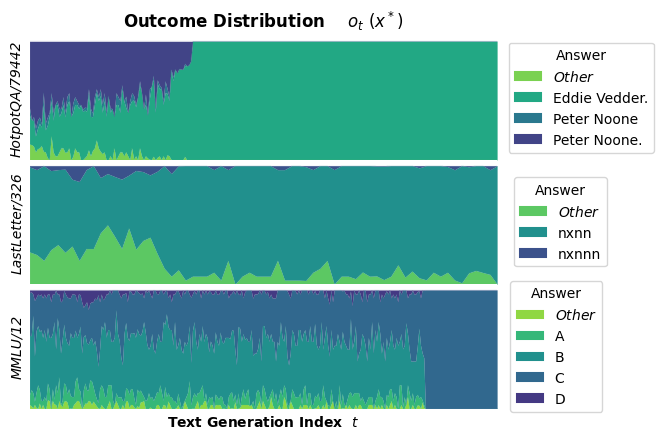

In [612]:
fnames = ['HotpotQA/79442', 'LastLetter/326', 'MMLU/12']

_, axs = plt.subplots(3, 1, figsize=(7, 4.5))

palette = 'viridis_r'

for ax_idx, (fname, ax) in enumerate(zip(fnames, axs)):
    task, qa_id = fname.split('/')[-2:]

    idx_df = idx_dfs[task][qa_id]

    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    # if normalize:
    #     pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE

    outcome_colors = sns.color_palette(palette=palette, n_colors=len(set(idx_df['ans']))) + [(.9, .3, .1)]
    sns.set_palette(outcome_colors)
    
    pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax, color=outcome_colors)

    
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax.set_xlim(t_min, t_max)
    
    handles, _ = ax.get_legend_handles_labels()
    labels = idx_df['ans'].cat.categories.tolist()
    # label_dict = {handle: label for handle, label in zip(handles, labels)}

    bbox_shift = {0: (1.35, 0.5),
                  1: (1.25, 0.5),
                  2: (1.24, 0.5)}
    sns.move_legend(ax, loc='right', handles=handles, labels=labels,
               bbox_to_anchor=bbox_shift[ax_idx])   #loc='right')

    legend = ax.get_legend()
    legend.set_title('Answer')
    for t, l in zip(legend.texts, labels):
        t.set_text(l)
    
    ax.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel(None)

    ax.set_ylabel(f'{task}/{qa_id}', style='italic')
    sns.despine(ax=ax, left=True, bottom=True)


axs[0].set_title('Outcome Distribution    $o_t \ (x^*)$', fontweight='bold')
# axs[-1].set_ylabel('Outcome Distribution  $o_t$')
axs[-1].set_xlabel('Text Generation Index  $t$', fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig('out/ts-examples.pdf', bbox_inches='tight')
plt.show()

In [46]:
idx_df = idx_dfs[task][qa_id].copy()

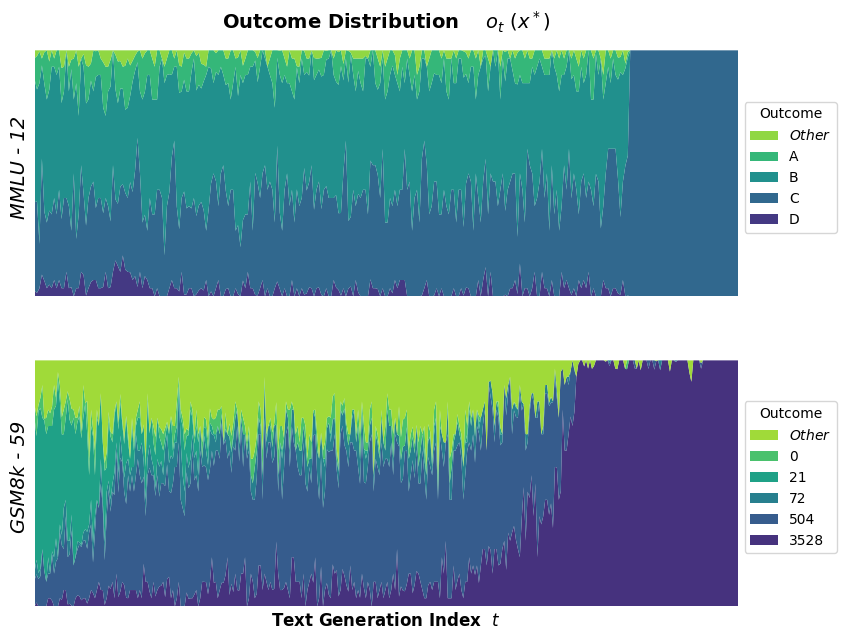

In [106]:
# fnames = ['HotpotQA/8076', 'MMLU/12']
# fnames = ['HotpotQA/8076', 'LastLetter/266']
fnames = ['MMLU/12', 'GSM8k/59']  #'GSM8k/97']

_, axs = plt.subplots(2, 1, figsize=(8.5, 6.5))

palette = 'viridis_r'

for ax_idx, (fname, ax) in enumerate(zip(fnames, axs)):
    task, qa_id = fname.split('/')[-2:]

    idx_df = idx_dfs[task][qa_id].copy()

    if 'GSM8k' in fname:
        idx_df['ans'] = idx_df['ans'].apply(lambda x: str(int(float(x))) if x != OTHER_TOK else x)
        ans_set = sorted([int(i) for i in set(idx_df['ans']) if i != OTHER_TOK])
        ans_set = [OTHER_TOK] + [str(i) for i in ans_set]
        idx_df['ans'] = pd.Categorical(idx_df['ans'], categories=ans_set, ordered=True)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    # if normalize:
    #     pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE

    outcome_colors = sns.color_palette(palette=palette, n_colors=len(set(idx_df['ans'])))  # + [(.9, .3, .1)]
    # sns.set_palette(outcome_colors)
    
    # pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    # pt.plot.area(lw=.05, ax=ax, color=outcome_colors)

    ans_set =  list(reversed(   idx_df['ans'].cat.categories.tolist()   ))
    ys = []
    for ans in ans_set:
        idx_df_a = idx_df[idx_df['ans'] == ans]
        idx_df_a = idx_df_a.sort_values(by='idx')
        ys.append(idx_df_a['weighted'])
    
    ax.stackplot(idx_df_a['idx'], ys, labels=ans_set, colors= list(reversed(outcome_colors)),   linewidth=0)
    
    ax.legend()
    handles, labels = ax.get_legend_handles_labels()
    # ax.legend(reversed(handles), reversed(labels))
    
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax.set_xlim(t_min, t_max)
    
    handles, _ = ax.get_legend_handles_labels()
    labels = idx_df['ans'].cat.categories.tolist()
    # label_dict = {handle: label for handle, label in zip(handles, labels)}

    bbox_shift = {0: (1.15, 0.5),
                  1: (1.15, 0.5),
                  2: (1.24, 0.5)}
    sns.move_legend(ax, loc='right',     
                    handles=list(reversed(handles)), labels=list(reversed(labels)),
                    #handles=handles, labels=labels,
               bbox_to_anchor=bbox_shift[ax_idx])   #loc='right')

    legend = ax.get_legend()
    legend.set_title('Outcome')
    for t, l in zip(legend.texts, labels):
        t.set_text(l)
    
    ax.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel(None)

    ax.set_ylabel(f'{task} - {qa_id}', fontsize=14, fontstyle='italic')
    sns.despine(ax=ax, left=True, bottom=True)


axs[0].set_title('Outcome Distribution    $o_t \ (x^*)$', fontweight='bold', fontsize=14)
# axs[-1].set_ylabel('Outcome Distribution  $o_t$')
axs[-1].set_xlabel('Text Generation Index  $t$', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=.2)
plt.savefig('out/ts-examples.pdf', bbox_inches='tight')
plt.show()

In [44]:
%debug

> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_42432/280159515.py(16)<listcomp>()
     14     if 'GSM8k' in fname:
     15         idx_df['ans'].apply(lambda x: str(int(float(x))) if x != OTHER_TOK else x)
---> 16         ans_set = sorted([int(i) for i in set(idx_df['ans']) if i != OTHER_TOK])
     17         ans_set = [OTHER_TOK] + [str(i) for i in ans_set]
     18         idx_df['ans'] = pd.Categorical(idx_df['ans'], categories=ans_set, ordered=True)



ipdb>  idx_df['ans']


0       $\it{Other}$
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
2167             NaN
2168             NaN
2169             NaN
2170             NaN
2171             NaN
Name: ans, Length: 2172, dtype: category
Categories (6, object): ['$\it{Other}$' < '0' < '21' < '72' < '504' < '3528']


ipdb>  q


In [627]:

# def plot_sankey(idx_tok_df, base_tokens, plot_idx=0, plot_n_idxs=4):
#     # base_tokens = base_res[0]['choice']['logprobs']['tokens']


plot_idx = 0
plot_n_idxs = 4

idx_tok_df_ = idx_tok_df.copy()


layout =  go.Layout(
    title = None,
    font = {'size': 10},
    
    xaxis = go.layout.XAxis(
        title = None,
        showticklabels=False),
    yaxis = go.layout.YAxis(
        title=None,
        showticklabels=False
    ),

    xaxis_range=(0,1), 
    yaxis_range=(0,1),
    margin=dict(l=20, r=20, t=20, b=20),
    plot_bgcolor='white',
    showlegend=True,
)

fig = go.Figure(layout=layout)

for i in range(plot_idx, plot_idx + plot_n_idxs):
    dfi = idx_tok_df_[idx_tok_df_['idx'] == i].reset_index(drop=True)
    dfi = dfi.sort_values(by='tok_p', ascending=False)    # sort tokens so highest tok_p token is first

    outcomes    = dfi['ans'].tolist()        # 'outcome'
    next_tokens = dfi['tok'].tolist()        # 'next_token'
    next_probs  = dfi['weighted'].tolist()   # 'weighted'
    
    prev_token = base_tokens[i-1] if i > 0 else '<START>'
    # for i, (last_token, next_tokens, next_probs) in enumerate(zip(last_tokens, next_tokens_s, next_probs_s)):
    
    out_idxs = dfi['ans'].cat.codes
    outcomes_set = dfi['ans'].cat.categories
    
    j = i - plot_idx
    pw = 1 / plot_n_idxs
    
    fig.add_trace(
        go.Parcats(
            # https://plotly.com/python/builtin-colorscales/
            line={'colorscale': 'bluyl', 'color': out_idxs,  # sunset   'color': outcome_colors * n_toks,
                  'shape': 'hspline',
                  'colorbar': {'tickvals': np.arange(len(outcomes_set)), 'ticktext': outcomes_set}  if j == 0 else None
                 },
            
            domain={'x': [pw*j, pw*(j+1)]},
            dimensions=[
                {'label': 'Current Token',  ###prev_token,
                 'values': [prev_token] * len(outcomes)},
                 # 'values': outcomes if j == 0 else   [prev_token] * len(outcomes)},
                {'label': 'Next Token',
                 'values': next_tokens}
                 # 'values': repeat_ls(next_tokens, n_out)}
            ],
            counts=next_probs
        )
    ) 

# ### i-1 -> i   shaded area
# for j in range(1, plot_n_idxs):
#     i = j + plot_idx
    
#     prev_token = base_tokens[i-1]
#     prev_tok_p = idx_tok_df_[(idx_tok_df_['idx'] == i-1) & (idx_tok_df_['tok'] == prev_token)]['tok_p'].iloc[0]
#     y_ = 1 - prev_tok_p
   
# fig.show()

fig.show()


# plot_sankey(idx_tok_df, base_tokens, plot_idx=0, plot_n_idxs=4)

## older

In [19]:
# [{k: v for k,v in s.items() if k != 'completion'} 
#  for S in ans_by_ext  for s in S 
#  if s['choice']['finish_reason'] == 'content_filter']

In [33]:
ans_by_ext[0][0]['completion']

{'id': '2024-09-22|06:55:09.796581-07|3.100.204.74|-1627335029',
 'created': 1727013309,
 'model': 'google/gemini-1.5-flash-001',
 'object': 'chat.completion',
 'system_fingerprint': '',
 'usage': {'completion_tokens': 4, 'prompt_tokens': 207, 'total_tokens': 211},
 'backend': 'google'}

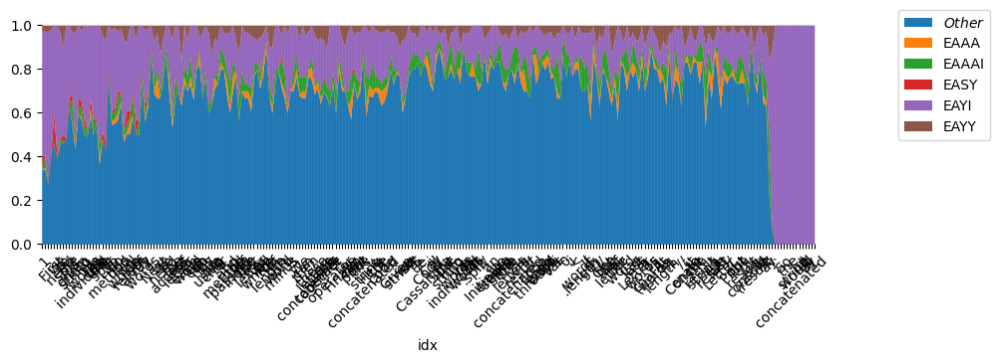

In [34]:
plot_stack(base_tokens, idx_df, normalize=False)

In [15]:
args_json['row']['answer'] #['correct']

0

In [120]:
args_json['row']

{'question': 'In a shipment of 120 machine parts, 5 percent were defective. In a shipment of 80 machine parts, 10 percent were defective. For the two shipments combined, what percent of the machine parts were defective?',
 'options': ['A)6.5%', 'B)7.0%', 'C)7.5%', 'D)8.0%', 'E)8.5%'],
 'rationale': '5% of 120 is 6\n10% of 80 is 8\nAs the question says two shipments combined, we have to add the defective as well as total shipments.\n8+6/120+80 = 15/200 = 7.5%\nAnswer C',
 'correct': 'C',
 'q_len': 205,
 'a_len': 167,
 'index': 95}

In [35]:
args_json['row']['inputs']

' Q: A coin is heads up. breyan flips the coin. sarita does not flip the coin.  Is the coin still heads up? '

In [10]:
s = ''.join(base_tokens)

print(s)

 First, we can plug in the given values for x and y into the equation to get:
2(6) - c(2) = 18
12 - 2c = 18
Next, we can solve for c by subtracting 12 from both sides:
-2c = 6
c = -3
Now, we can plug in the value of c into the original equation and solve for x when y is 5:
2x - (-3)(5) = 18
2x + 15 = 18
2x = 3
x = 3/2
Therefore, the value of x when y is 5 is 3/2 or 1.5. The correct answer is not listed, so we can conclude that there may be a typo in the question or answer choices.


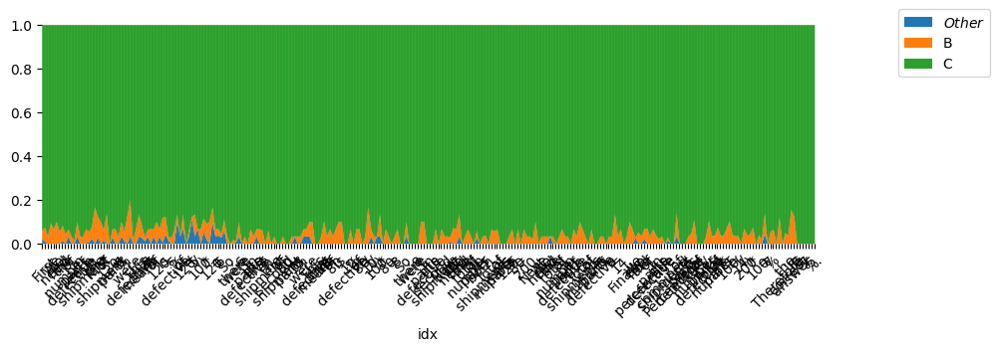

In [119]:
plot_stack(base_tokens, idx_df, normalize=False)

In [6]:
figs, widgets = plotly_linked(idx_tok_df, 
                              base_tokens, plot_n_idxs=4)
widgets

    'data': [{'fillcolor': 'rgba(0.565498, 0.84243, 0.262877, 0.7)',
           …

#### postprocess to csv   + altair experiment

In [ ]:
#### save all answer/index dfs to csv files

In [25]:
def semantic_drift(idx_df):
    dist_df = get_dists(idx_df)
    dist_df = dist_df.sort_values(by='idx')
    return dist_df

def run_beast(idx_df, dist_fn = 'd_l1', 
              alpha2_fn=lambda range_y: 2.0  + (1000 ** (1.0 - range_y))):
    ### TODO: turn all beast args into kwarg dict + default dict   
    #                   -- then use default dict to generate that many text entry boxes in streamlit CPD page
    # alpha2_fn = eval(alpha2_str)

    dist_df = get_dists(idx_df)
    dist_df = dist_df.sort_values(by='idx')

    y = dist_df[dist_fn].to_numpy()
    time  = dist_df['idx'].to_numpy()

    range_y = y.max() - y.min()
    alpha2 = alpha2_fn(range_y)

    o = Rbeast.beast(
        y, time=time, season='none',
        tcp_minmax=[0, 6],  torder_minmax=[1, 1], tseg_minlength=10,
        mcmc_seed=0, mcmc_chains=10,
        mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
        # mcmc_burnin=200, mcmc_samples=8000, mcmc_thin=5,
        print_progress=False, print_options=False, quiet=True, 

        precPriorType='constant', precValue=10,      # manually set \nu = 10   (TODO: should this be 1.5?)
        alpha1=.01,                 # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
        alpha2=alpha2,              # min alpha2: MIN_ALPHA2_VALUE=.0001
        #### Default values for alpha1/2, delta1/2: 1.0   (or 1e-8??)
        ####   Source: https://github.com/zhaokg/Rbeast/blob/master/Source/beastv2_io_in_args.c#L758
        ####   Alt??:  https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
    )
    return o.trend.__dict__


In [28]:
base_dir     = './out/gpt3.5-instruct-30s-300t'

for task in tqdm(os.listdir(base_dir)):
    if task == 'StoryCloze_Open':
        continue
    for qa_id in tqdm(os.listdir(f'{base_dir}/{task}')):
        if '.pk' not in qa_id:
            continue
        qa_id = qa_id.split(".")[0]
        fname = f'{base_dir}/{task}/{qa_id}'

        ################
        (base_res, response_extends, samples_by_ext, ans_by_ext, 
         baseline_ans, base_resamples, base_resamples_ans) \
            = pickle.load(open(f'{fname}.pk', 'rb'))

        args_json = json.load(open(f'{fname}.json'))

        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])

        idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=5, other_tok='$\\it{Other}$')

        ########################################################################################################
        
        dir_post = f'{base_dir}_POST/{task}/{qa_id}'
        os.makedirs(dir_post, exist_ok=True)

        """

        ### Save tokens to text file
        ##base_tokens = base_res[0]['choice']['logprobs']['tokens']
        ##with open(f'{dir_post}/tokens.txt', 'w') as f:
        ##    f.write(json.dumps(base_tokens))

        ans_df = ans_df.drop(['ans_top_lps', 'ext_lps', 'ext_top_lps', 'ext_raw'], axis='columns')
        ans_df.to_csv(f'{dir_post}/ans_df.csv')
        idx_df.to_csv(f'{dir_post}/idx_df.csv')
        idx_tok_df.to_csv(f'{dir_post}/idx_tok_df.csv')
        
        json.dump(args_json, open(f'{dir_post}/args.json', 'w'))
        pickle.dump(base_res, open(f'{dir_post}/base_res.pk', 'wb'))
        """

        o_trend = run_beast(idx_df, dist_fn = 'd_l1', 
                            alpha2_fn=lambda range_y: 2.0  + (1000 ** (1.0 - range_y)))
        pickle.dump(o_trend, open(f'{dir_post}/trend.pk', 'wb'))

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [31]:


analysis_utils.get_percentile_cp(o_trend['ncpPr'], percentile=.1)


0

In [1592]:
dir_post

'./out/gpt3.5-instruct-test_gemini_X_POST/StoryCloze_2Choice/466'

In [1606]:
for task in tqdm(rb_trends.keys()):
    for qa_id in tqdm(rb_trends[task].keys()):
        dir_post = f'{base_dir}_POST/{task}/{qa_id}'
        pickle.dump(rb_trends[task][qa_id].__dict__, open(f'{dir_post}/trend.pk', 'wb'))

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [1598]:
rb_trends[task][qa_id].__dict__

{'ncp': array([1.1787126], dtype=float32),
 'ncp_median': array([1.], dtype=float32),
 'ncp_mode': array([0.], dtype=float32),
 'ncp_pct90': array([3.], dtype=float32),
 'ncp_pct10': array([0.], dtype=float32),
 'ncpPr': array([0.4518125 , 0.22796252, 0.14416252, 0.08985   , 0.0492125 ,
        0.025975  , 0.011025  ], dtype=float32),
 'cpOccPr': array([0.        , 0.        , 0.        , 0.        , 0.003575  ,
        0.0034625 , 0.00415   , 0.004     , 0.0047375 , 0.0045    ,
        0.006925  , 0.007075  , 0.0080125 , 0.0077375 , 0.01095   ,
        0.0067    , 0.007775  , 0.007825  , 0.023825  , 0.011575  ,
        0.0087125 , 0.0098125 , 0.01055   , 0.03425   , 0.0228    ,
        0.0207625 , 0.0129875 , 0.0320125 , 0.0116625 , 0.0132    ,
        0.0113375 , 0.01625   , 0.0100625 , 0.0236625 , 0.0394    ,
        0.1798125 , 0.0295625 , 0.01235   , 0.023775  , 0.010875  ,
        0.02315   , 0.011575  , 0.01735   , 0.00875   , 0.0087    ,
        0.01365   , 0.00925   , 0.008962

In [1600]:
base_dir     = './out/gpt3.5-instruct-test_gemini_X'


for task in tqdm(idx_dfs.keys()):
    for qa_id in tqdm(idx_dfs[task].keys()):
        fname = f'{base_dir}/{task}/{qa_id}'

        ################
        # X = pickle.load(open(f'{fname}.pk', 'rb'))
        # base_res = X[0]
        try:
            (base_res, response_extends, samples_by_ext, ans_by_ext, 
            _, _, _) = pickle.load(open(f'{fname}.pk', 'rb'))
        except ValueError:
            (base_res, response_extends, samples_by_ext, ans_by_ext, 
            _, _, _, _) = pickle.load(open(f'{fname}.pk', 'rb'))

        args_json = json.load(open(f'{fname}.json'))

        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])

        idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=5, other_tok=r'$\it{Other}$')

        ########################################################################################################
        
        dir_post = f'{base_dir}_POST/{task}/{qa_id}'
        os.makedirs(dir_post, exist_ok=True)

        ans_df = ans_df.drop(['ans_top_lps', 'ext_lps', 'ext_top_lps', 'ext_raw'], axis='columns')
        ans_df.to_csv(f'{dir_post}/ans_df.csv')
        idx_df.to_csv(f'{dir_post}/idx_df.csv')
        idx_tok_df.to_csv(f'{dir_post}/idx_tok_df.csv')
        
        json.dump(args_json, open(f'{dir_post}/args.json', 'w'))
        pickle.dump(base_res, open(f'{dir_post}/base_res.pk', 'wb'))

        o, _, _ = run_beast(idx_df, dist_fn = 'd_l2', add_noise = .03)
        pickle.dump(o.trend.__dict__, open(f'{dir_post}/trend.pk', 'wb'))

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

#### TODO workshop stuff

##### stacked line plot

In [3]:
base_dir = './out/gpt3.5-instruct-30s-300t'

fnames = [
    f'{base_dir}/GSM8k/97',                # unstable: 97, 
    f'{base_dir}/AQuA/60927',              # unstable: 60927, 58402     stable: 64038, 90779, 82737       unsure: 39581, 
    f'{base_dir}/HotpotQA/79442',          # unstable: 79442        numeric interesting: 58902
]

# f'{base_dir}/LastLetter/342',
# f'{base_dir}/CoinFlip/170',
# f'{base_dir}/StoryCloze_2Choice/274',   # stable: 10, 587, 1699, 1275         weakly unstable:  274, 1787, 1497




idx_dfs = []
idx_tok_dfs = []

for fname in tqdm(fnames):
    task = fname.split('/')[-2]
    
    (base_res, response_extends, samples_by_ext, ans_by_ext, 
     baseline_ans, base_resamples, base_resamples_ans) \
        = pickle.load(open(f'{fname}.pk', 'rb'))
    
    base_tokens = base_res[0]['choice']['logprobs']['tokens']
    args_json = json.load(open(f'{fname}.json'))
    
    ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                           ans_parse_fn=ans_fn_bytask[task])           #(response_extends, ans_by_ext, parse_fn)
    idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                    normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                    weighted_thresh=.1, max_n_ans=5, other_tok='$\\it{Other}$')
    
    idx_dfs.append(idx_df)
    idx_tok_dfs.append(idx_tok_df)
    
    # print(base_res[0]['prompt'])
    # print('~'*80)
    # print(base_res[0]['choice']['text'][:200] + '\n . . . ')
    # print('~'*80)

    # print('True Answer: ', args_json['row']['answer'])       # HotpotQA
    # print('True Answer: ', args_json['row']['correct'])    # AQuA
    # print('True Answer: ', args_json['row']['answer'].split('#### ')[1])    # GSM8k

    gc.collect();

In [9]:
len(axs)

2

'Peter Noone.'

In [49]:
legend.texts

[Text(0, 0, '(weighted, $\\it{Other}$)'),
 Text(0, 0, '(weighted, 38.0)'),
 Text(0, 0, '(weighted, 46.0)'),
 Text(0, 0, '(weighted, 54.0)'),
 Text(0, 0, '(weighted, 70.0)'),
 Text(0, 0, '(weighted, 78.0)')]

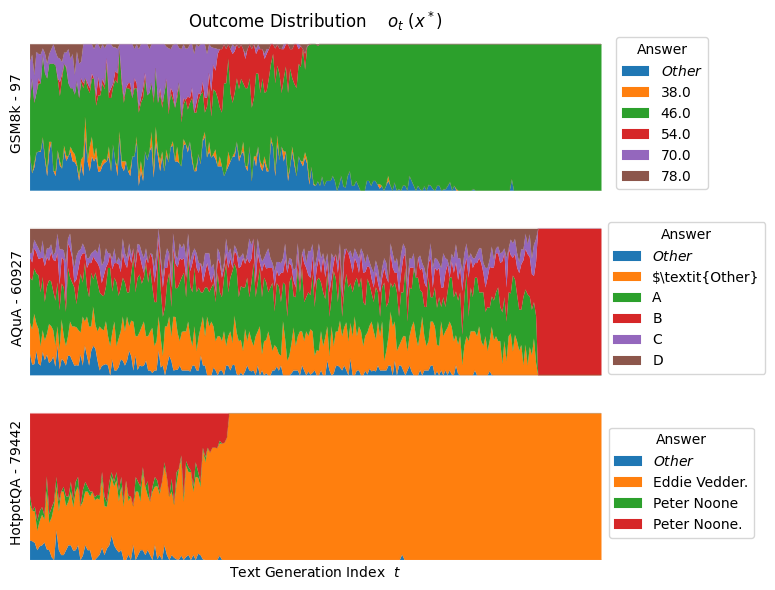

In [83]:
_, axs = plt.subplots(3, 1, figsize=(8, 6))

for ax_idx, (fname, idx_df, ax) in enumerate(zip(fnames, idx_dfs, axs)):
    task, qa_id = fname.split('/')[-2:]

    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    # if normalize:
    #     pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax)

    
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax.set_xlim(t_min, t_max)
    
    handles, _ = ax.get_legend_handles_labels()
    labels = idx_df['ans'].cat.categories.tolist()
    # label_dict = {handle: label for handle, label in zip(handles, labels)}

    bbox_shift = {0: (1.2, 0.5),
                  1: (1.3, 0.5),
                  2: (1.28, 0.5)}
    sns.move_legend(ax, loc='right', handles=handles, labels=labels,
               bbox_to_anchor=bbox_shift[ax_idx])   #loc='right')

    legend = ax.get_legend()
    legend.set_title('Answer')
    for t, l in zip(legend.texts, labels):
        t.set_text(l)
    
    ax.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel(None)

    ax.set_ylabel(f'{task} - {qa_id}')
    sns.despine(ax=ax, left=True, bottom=True)

axs[0].set_title('Outcome Distribution    $o_t \ (x^*)$')
# axs[-1].set_ylabel('Outcome Distribution  $o_t$')
axs[-1].set_xlabel('Text Generation Index  $t$')

plt.tight_layout()
plt.savefig('out/workshop-ts-sub.pdf')

##### multi task CPD

In [6]:
# df = pd.DataFrame({'x_values': range(1,101), 'y_values': np.random.randn(100)*15+range(1,101), 'z_values': (np.random.randn(100)*15+range(1,101))*2 })




def plot_grid(
        base_tokens, idx_df, o,
        normalize=True, title=None, figsize=(12, 6), bbox_to_anchor=(1.0, .99),
        **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(title='Final Answer',
               handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=bbox_to_anchor)   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution  $o_t$')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)


    # ------------------------------------------------------------------------------------------
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='purple')
    ax_dist.set_ylabel('Drift  $y_t$')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr)
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ x)$')
    ax_tau.set_xlabel('Token Index')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)


    # ------------------------------------------------------------------------------------------
    plt.title(title)
    plt.tight_layout()

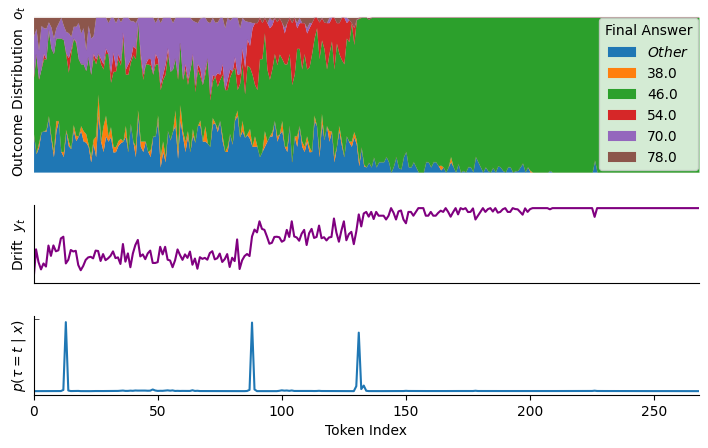

In [ ]:
plot_grid(
    base_tokens, idx_df, o,
    figsize=(13, 5), bbox_to_anchor=(0.84, .99)
)

plt.savefig('out/gsm-cpd.pdf')
plt.show()

  0%|          | 0/7 [00:00<?, ?it/s]

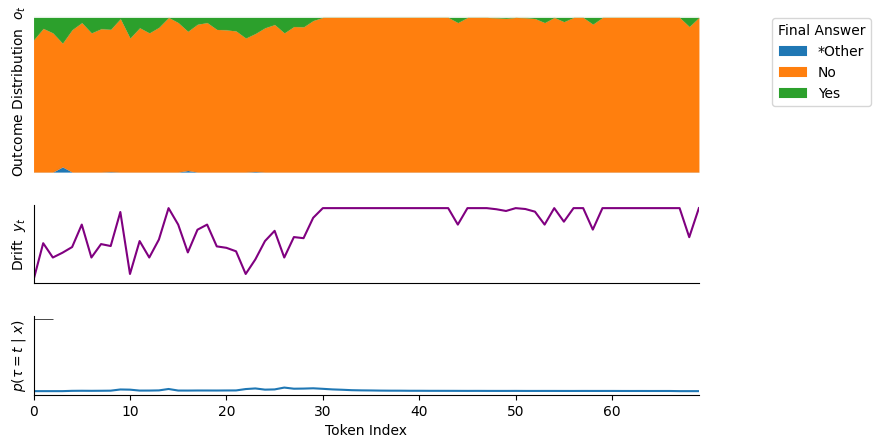

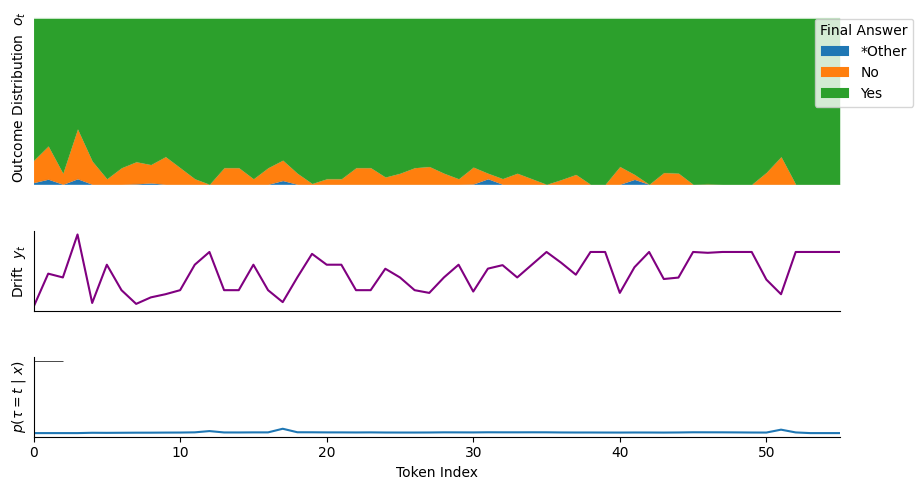

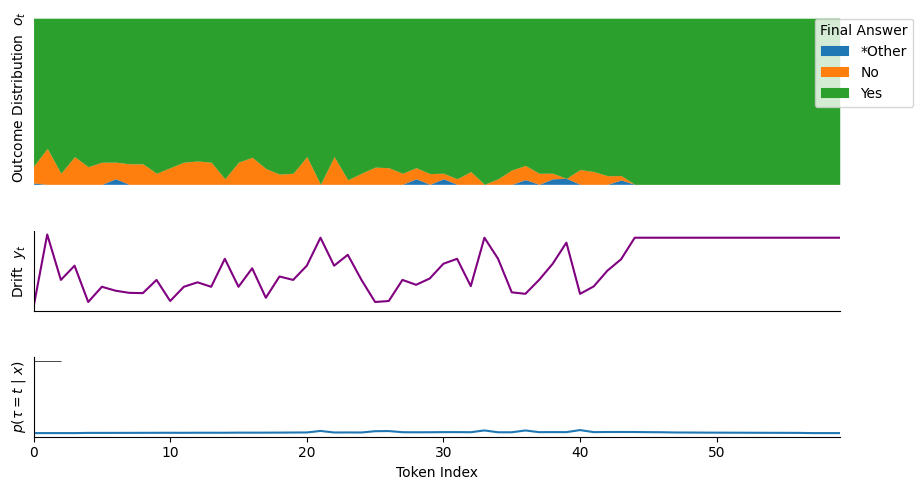

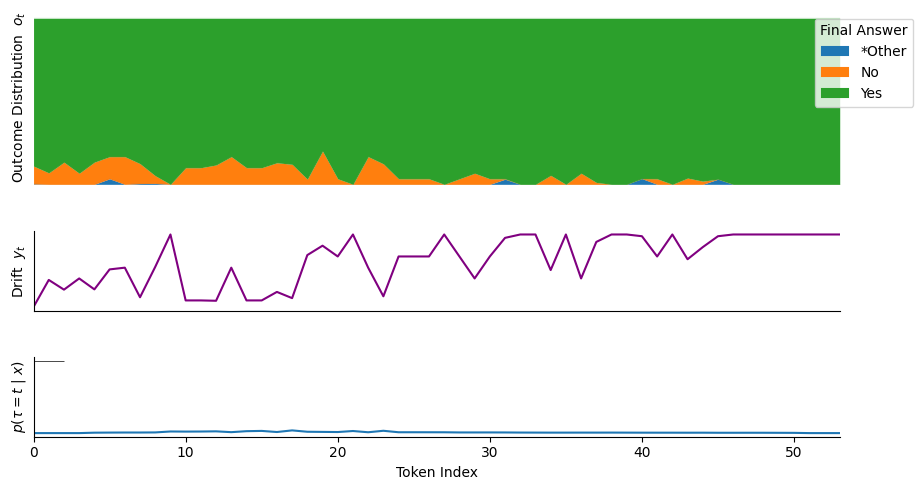

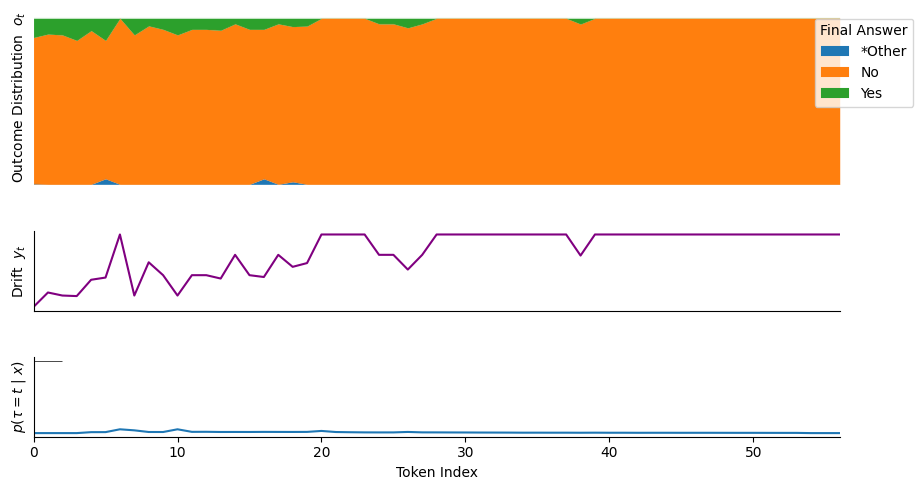

...

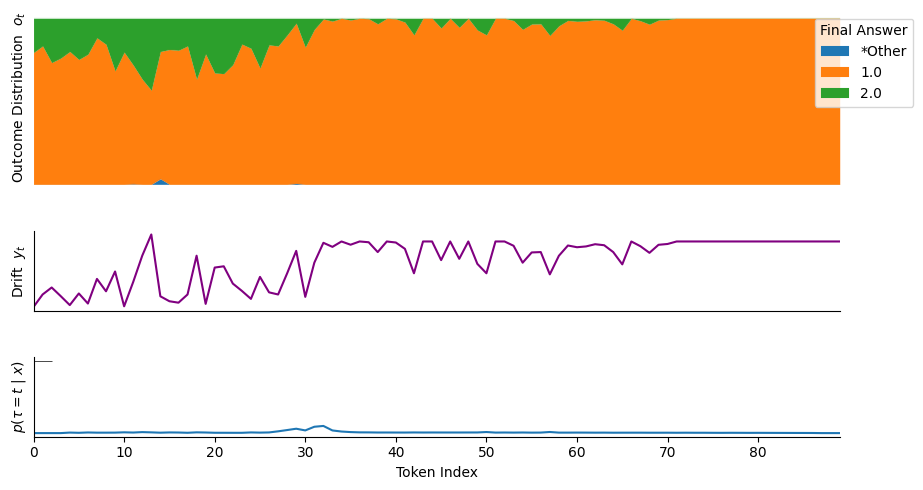

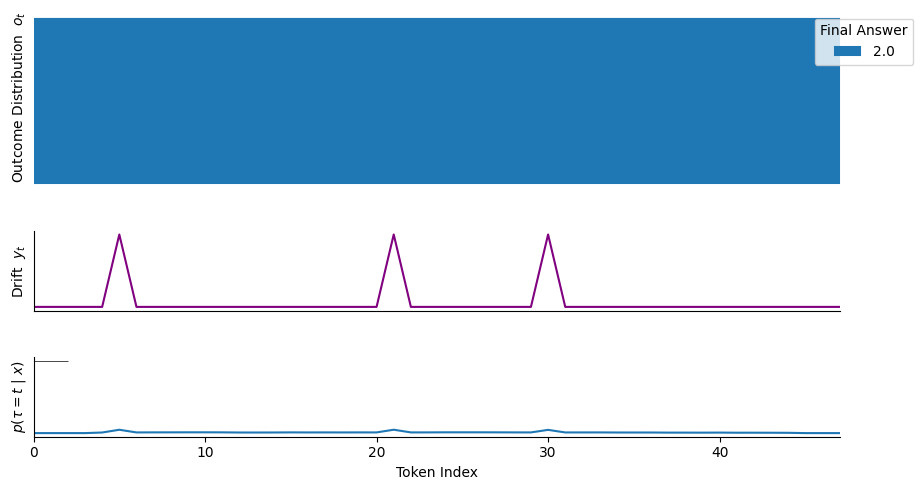

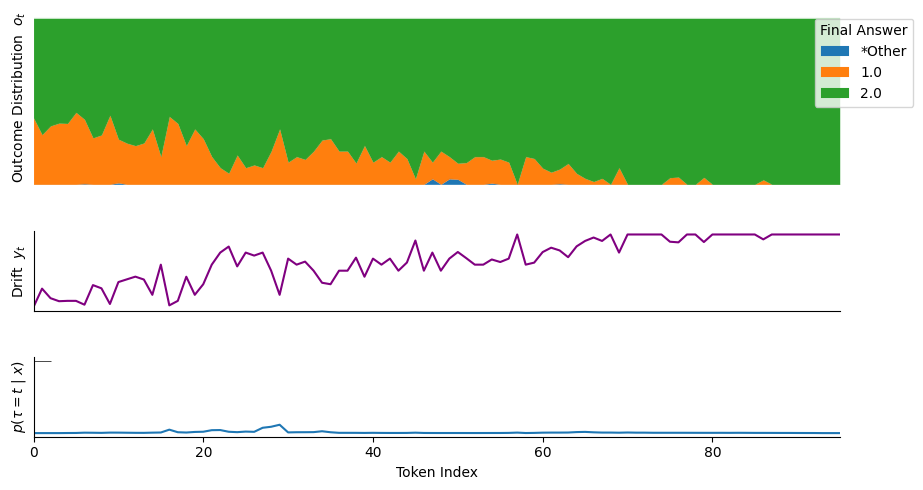

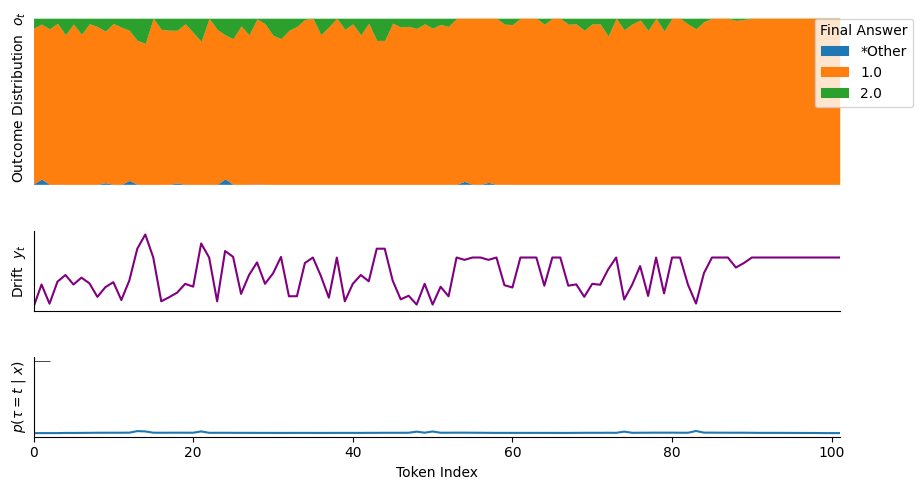

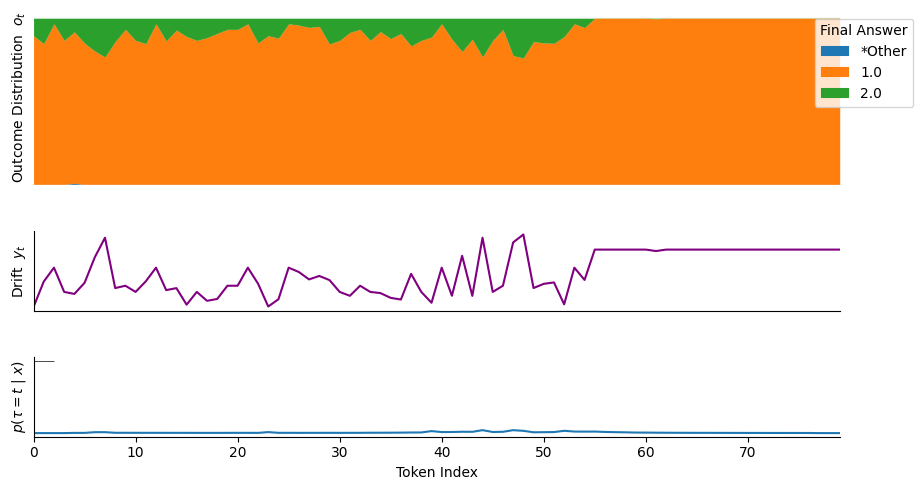

In [7]:
dist_fn = 'd_l1'


def rescale_alpha2(base=5, exp=1000):
    def f(y):
        y_range = y.max() - y.min()
        return base + (exp ** (1.0 - y_range))   # exp ^ (value in range [0, 1], inverse prop. to |y|)
    return f
    

alpha2_d = {'d_kl':  rescale_alpha2(base=10.0),
            'd_cos': rescale_alpha2(base=5.0),
            'd_l1':  rescale_alpha2(base=2.0),
            'd_l2':  rescale_alpha2(base=2.0)}


alpha2 = alpha2_d[dist_fn]


idx_dfs = defaultdict(dict)
idx_tok_dfs = defaultdict(dict)
rb_trends = defaultdict(dict)
cp_rows = []

for task in tqdm(ans_fn_bytask.keys()):
    path = f'./out/gpt3.5-instruct-30s-300t/{task}'

    
    files = [f.split('.pk')[0] for f in os.listdir(path) if '.pk' in f]
    
    for qa_idx in files:
        
        fname = f'./out/gpt3.5-instruct-30s-300t/{task}/{qa_idx}'
        
        base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        args_json = json.load(open(f'{fname}.json'))
        
        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])
        
        idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=6, other_tok='*Other')  # ='$\\it{Other}$')
        
        # ------------------------------------------------------------------------------
        dist_df = get_dists(idx_df)
        dist_df = dist_df.sort_values(by='idx')
        
        y = dist_df[dist_fn].to_numpy()
        time  = dist_df['idx'].to_numpy()

        o = Rbeast.beast(
            y, time=time, season='none',
            tcp_minmax=[0, 6],  torder_minmax=[0, 1], # tseg_minlength=20,
            mcmc_chains=10,
            print_progress=False, print_options=False, quiet=True, 
            
            precPriorType='constant', precValue=10,
            alpha1=.01,             # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
            alpha2=alpha2(y),       # min alpha2: MIN_ALPHA2_VALUE=.0001
        )
        # ------------------------------------------------------------------------------
    
        idx_dfs[task][qa_idx] = idx_df
        idx_tok_dfs[task][qa_idx] = idx_tok_df
        rb_trends[task][qa_idx] = o.trend
    
        ## cp_P = o.trend.cpPr.sum(0)
        ### num_cps_p10 = get_percentile_cp(o.trend.ncpPr, .1)
        
        # point where bayes factor is 9 (i.e. 90% quantile)
        num_cps_p10 = get_percentile_cp_interp(o.trend.ncpPr, percentile=.1)
        
        if len(o.trend.cp.shape) > 1:
            all_cps = o.trend.cp[:, 0]    #all_cps = o.trend.cp[0, :]
            cpAbruptChange = o.trend[:, 0].cpAbruptChange
        else:
            cpAbruptChange = o.trend.cpAbruptChange
            all_cps = o.trend.cp

        # threshold_cps = all_cps[np.argwhere(abs(o.trend.cpAbruptChange) > .1)]
        # cps = [cp for cp in all_cps[:num_cps_p10] if cp in threshold_cps]
        
        for cp in all_cps:
            cp_rows.append({
                'task': task,
                'qa_idx': qa_idx,
                'toks': base_tokens,
                
                'cp_idxs': cp,
                'num_cps_p10': num_cps_p10,
                'expected_val': get_expected_ncp(o.trend.ncpPr),
            })

        # # print('Num. Change Points: ', len(cps))
        # print('ncp Pr  ', o.trend.ncpPr)

        # figsize = (8, 2.5)
        # plt.rcParams['figure.figsize'] = figsize
        # plot_stack(base_tokens, idx_df, title=f'{task} - {qa_idx}', figsize=figsize)
        
        # plt.plot(time, y); plt.title(f'{dist_fn} dist');  plt.show();
        
        # Rbeast.plot(o, vars=['t', 'tcp'])
        # plt.show();

        
        # plt.rcParams['figure.figsize'] = (3.5, 2.5)
        # ncp_prob = o.trend.ncpPr 
        # plt.plot(ncp_prob)
        # plt.vlines(get_percentile_cp(ncp_prob, percentile=.5), 
        #               min(ncp_prob), max(ncp_prob), ls='--', color='orange')
        # plt.title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
        # plt.ylabel('$p(N_{cp} | x)$')
        # plt.xlabel('# Change Points')
        # plt.show()

        
        plot_grid(
            base_tokens, idx_df, o,
            figsize=(13, 5), bbox_to_anchor=(1.1, .99)
        )
        
        plt.savefig(f'out/all_tasks/{task}-{qa_idx}.pdf', bbox_inches='tight')
        plt.show()

        ###############
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        base_cps = 1 - o.trend.cpOccPr  # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])
        
        s = text_colors_html(base_tokens, base_cps, 
                             print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))
        
        display(HTML(s))
        pdf = weasyprint.HTML(string=s).write_pdf()
        open(f'out/all_tasks/text-cps_{task}-{qa_idx}.pdf', 'wb').write(pdf)

        base_probs = np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])
        s = text_colors_html(base_tokens, base_probs, 
                             print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))
        
        # display(HTML(s))
        pdf = weasyprint.HTML(string=s).write_pdf()
        open(f'out/all_tasks/text-lps_{task}-{qa_idx}.pdf', 'wb').write(pdf)


        bs = base_html(base_res)
        pdf = weasyprint.HTML(string=bs).write_pdf()
        open(f'out/all_tasks/text-prompt_{task}-{qa_idx}.pdf', 'wb').write(pdf)
        # display(HTML(bs))
        
        ###############
        gc.collect()

In [19]:
cp_dff = pd.DataFrame(cp_rows)
cp_dff

,task,qa_idx,toks,cp_idxs,num_cps_p10,expected_val
0,CoinFlip,1288,"[ Initially, ,, the, coin, is, heads, up,...",27.0,0.0,0.674125
1,CoinFlip,1288,"[ Initially, ,, the, coin, is, heads, up,...",10.0,0.0,0.674125
2,CoinFlip,1288,"[ Initially, ,, the, coin, is, heads, up,...",58.0,0.0,0.674125
3,CoinFlip,1288,"[ Initially, ,, the, coin, is, heads, up,...",NaN,0.0,0.674125
4,CoinFlip,1288,"[ Initially, ,, the, coin, is, heads, up,...",NaN,0.0,0.674125
...,...,...,...,...,...,...
319,StoryCloze_2Choice,1787,"[ The, sun, was, shining, and, the, bird...",53.0,0.0,0.645950
320,StoryCloze_2Choice,1787,"[ The, sun, was, shining, and, the, bird...",8.0,0.0,0.645950
321,StoryCloze_2Choice,1787,"[ The, sun, was, shining, and, the, bird...",24.0,0.0,0.645950
322,StoryCloze_2Choice,1787,"[ The, sun, was, shining, and, the, bird...",NaN,0.0,0.645950


In [18]:
cp_dff_ = cp_dff.drop_duplicates(['task', 'qa_idx'])
cp_dff_['cps_geq1'] = (cp_dff_['num_cps_p10'] >= 1)

cp_dff_[['task', 'cps_geq1']].groupby('task').aggregate('mean').reset_index()

,task,cps_geq1
0,AQuA,0.142857
1,CoinFlip,0.000000
2,GSM8k,0.200000
3,HotpotQA,0.400000
4,LastLetter,0.714286
5,MMLU,0.000000
6,StoryCloze_2Choice,0.142857


In [32]:
%debug

> /Users/eric/code/python/envs/env311/lib/python3.11/site-packages/matplotlib/colors.py(737)__call__()
    735         # Pre-compute the masks before casting to int (which can truncate
    736         # negative values to zero or wrap large floats to negative ints).
--> 737         mask_under = xa < 0
    738         mask_over = xa >= self.N
    739         # If input was masked, get the bad mask from it; else mask out nans.



ipdb>  u


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/2352300366.py(18)<listcomp>()
     16     s = ''.join([
     17     ('<span style="color: black; font-size=16pt; background-color: ' +
---> 18                       rgb_to_htmlstr(c_map(prob)) +
     19                       ' !important ;">' +
     20                   (token.replace('\n', '<br>') if print_newln else token.replace('\n', '\\n')) +      # .replace(' ', '&nbsp;')



ipdb>  u


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/2352300366.py(16)text_colors_html()
     14 
     15     # -webkit-print-color-adjust: exact;   color-adjust: exact; print-color-adjust: exact;
---> 16     s = ''.join([
     17     ('<span style="color: black; font-size=16pt; background-color: ' +
     18                       rgb_to_htmlstr(c_map(prob)) +



ipdb>  u


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/1883512805.py(129)<module>()
    127         base_probs = 1 - o.trend.cpOccPr  # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])
    128 
--> 129         s = text_colors_html(base_tokens, base_cps, 
    130                              print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))
    131 



ipdb>  u


*** all frames above hidden, use `skip_hidden False` to get get into those.


ipdb>  base_tokens


[' First', ',', ' we', ' need', ' to', ' find', ' the', ' total', ' number', ' of', ' students', ' who', ' passed', ' the', ' test', '.', ' We', ' know', ' that', ' ', '340', ' third', ' grad', 'ers', ' and', ' ', '40', ' fourth', ' grad', 'ers', ' passed', ',', ' so', ' that', "'s", ' a', ' total', ' of', ' ', '340', ' +', ' ', '40', ' =', ' ', '380', ' students', '.\n\n', 'Next', ',', ' we', ' need', ' to', ' find', ' the', ' pass', ' rate', ' for', ' the', ' fifth', ' grad', 'ers', '.', ' We', ' are', ' told', ' that', ' their', ' pass', ' rate', ' was', ' twice', ' the', ' fourth', ' grad', 'ers', "'", ' pass', ' rate', ',', ' so', ' we', ' can', ' set', ' up', ' the', ' equation', ' ', '2', 'x', ' =', ' ', '40', ',', ' where', ' x', ' represents', ' the', ' fourth', ' grad', 'ers', "'", ' pass', ' rate', '.', ' Sol', 'ving', ' for', ' x', ',', ' we', ' get', ' x', ' =', ' ', '20', '.', ' This', ' means', ' that', ' the', ' fifth', ' grad', 'ers', "'", ' pass', ' rate', ' was', ' '

ipdb>  base_cps


[' Initially', ',', ' the', ' coin', ' is', ' heads', ' up', '.', ' Then', ',', ' Lib', 'ora', ' flips', ' the', ' coin', ' over', ',', ' which', ' means', ' she', ' turns', ' the', ' coin', ' to', ' the', ' other', ' side', '.', ' So', ' now', ',', ' the', ' coin', ' is', ' tails', ' up', '.', ' However', ',', ' Bry', 'nn', 'lee', ' does', ' not', ' flip', ' the', ' coin', ' over', ',', ' which', ' means', ' she', ' does', ' not', ' change', ' the', ' position', ' of', ' the', ' coin', '.', ' Therefore', ',', ' the', ' coin', ' is', ' still', ' tails', ' up', '.']


ipdb>  q


In [26]:
%debug

> /Users/eric/code/python/envs/env311/lib/python3.11/site-packages/matplotlib/colors.py(737)__call__()
    735         # Pre-compute the masks before casting to int (which can truncate
    736         # negative values to zero or wrap large floats to negative ints).
--> 737         mask_under = xa < 0
    738         mask_over = xa >= self.N
    739         # If input was masked, get the bad mask from it; else mask out nans.



ipdb>  u


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/2352300366.py(18)<listcomp>()
     16     s = ''.join([
     17     ('<span style="color: black; font-size=16pt; background-color: ' +
---> 18                       rgb_to_htmlstr(c_map(prob)) +
     19                       ' !important ;">' +
     20                   (token.replace('\n', '<br>') if print_newln else token.replace('\n', '\\n')) +      # .replace(' ', '&nbsp;')



ipdb>  u


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/2352300366.py(16)text_colors_html()
     14 
     15     # -webkit-print-color-adjust: exact;   color-adjust: exact; print-color-adjust: exact;
---> 16     s = ''.join([
     17     ('<span style="color: black; font-size=16pt; background-color: ' +
     18                       rgb_to_htmlstr(c_map(prob)) +



ipdb>  d


> /var/folders/41/_ql36yd95wq0zy1_ml3g0g2w0000gn/T/ipykernel_50706/2352300366.py(18)<listcomp>()
     16     s = ''.join([
     17     ('<span style="color: black; font-size=16pt; background-color: ' +
---> 18                       rgb_to_htmlstr(c_map(prob)) +
     19                       ' !important ;">' +
     20                   (token.replace('\n', '<br>') if print_newln else token.replace('\n', '\\n')) +      # .replace(' ', '&nbsp;')



ipdb>  prob


' Initially'


ipdb>  c_map


ipdb>  q


In [ ]:
1+1

#### highlighting text

In [138]:
base_tokens = base_res[0]['choice']['logprobs']['tokens']
base_probs = 1 - o.trend.cpOccPr  # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

s = text_colors_html(base_tokens, base_probs, 
                     print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
# pdf = weasyprint.HTML(string=s).write_pdf()
# open('out/test_text_cps.pdf', 'wb').write(pdf)

In [139]:
base_tokens = base_res[0]['choice']['logprobs']['tokens']
base_probs = np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

s = text_colors_html(base_tokens, base_probs, 
                     print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))
# pdf = weasyprint.HTML(string=s).write_pdf()
# open('out/test_text_lps.pdf', 'wb').write(pdf)

In [18]:
bs

'    <!DOCTYPE html>\n    <html>\n    \n    <head>\n    <style>\n    span {\n      -webkit-print-color-adjust: exact;\n              print-color-adjust: exact;\n              color-adjust: exact;        /* this + !important tag are necessary for python html -> pdf */\n    }\n    \n    @page  {\n      margin: 0;\n      size: 520px 300px\n    }\n    </style>\n    </head>\n    \n    <body>\n    <div style="width: 500px; background-color: white !important; line-height:19px;">\n    Question:<br>Janet is collecting the results of Herbert Hoover Elementary School\'s annual standardized test. 340 out of 500 third-graders passed, along with 40 out of 100 fourth graders. The 400 fifth graders had a pass rate that was twice the fourth grades\' pass rate. What is the school\'s overall pass rate?<br><br>Answer:<br>Let\'s think step by step.\n    </div>\n    </body>\n    </html>'

In [21]:
bs = base_html(base_res)
display(HTML(bs))

In [96]:
base_tokens = base_res[0]['choice']['logprobs']['tokens']
base_probs = 1 - o.trend.cpOccPr  # np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

s = text_colors_html(base_tokens, base_probs, 
                     print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))

pdf = weasyprint.HTML(string=s).write_pdf()
open('out/test_text_cps.pdf', 'wb').write(pdf)

13538

In [97]:
base_tokens = base_res[0]['choice']['logprobs']['tokens']
base_probs = np.exp(base_res[0]['choice']['logprobs']['token_logprobs'])

s = text_colors_html(base_tokens, base_probs, 
                     print_newln=False, c_map=sns.color_palette('YlOrRd_r', as_cmap=True))   # 'Oranges'   #c_map=sns.color_palette('RdYlGn', as_cmap=True))

display(HTML(s))

pdf = weasyprint.HTML(string=s).write_pdf()
open('out/test_text_lps.pdf', 'wb').write(pdf)

14323

#### 

testing baseline plots

In [81]:
pd.concat([get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn),
           get_baseline_final_lp(baseline_ans, parse_fn=abcd_fn_2)])

,ans,ext_p,baseline
0,OLAH,0.630415,sample
1,OLOAH,0.027239,sample
2,OLLAH,0.020143,sample
3,LLAH,0.018114,sample
4,OLAAH,0.012288,sample
0,*Other,0.374060,last_token
1,A,0.045950,last_token
2,B,0.062566,last_token
3,C,0.139751,last_token
4,D,0.377673,last_token


In [261]:
pd.concat([get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn),
           get_baseline_final_lp(baseline_ans, parse_fn=abcd_fn_2)])

,ans,ext_p,baseline
0,OLAH,0.630415,sample
1,OLOAH,0.027239,sample
2,OLLAH,0.020143,sample
3,LLAH,0.018114,sample
4,OLAAH,0.012288,sample
...,...,...,...
0,*Other,0.374060,last_token
1,A,0.045950,last_token
2,B,0.062566,last_token
3,C,0.139751,last_token


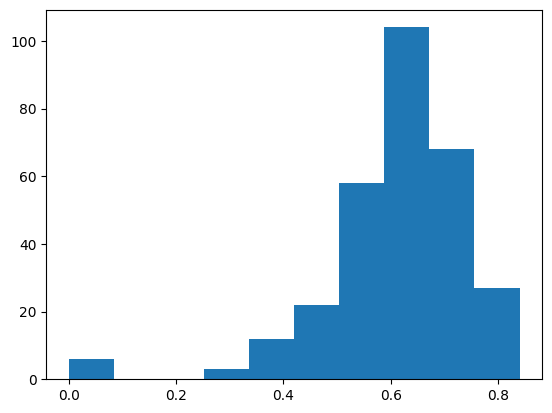

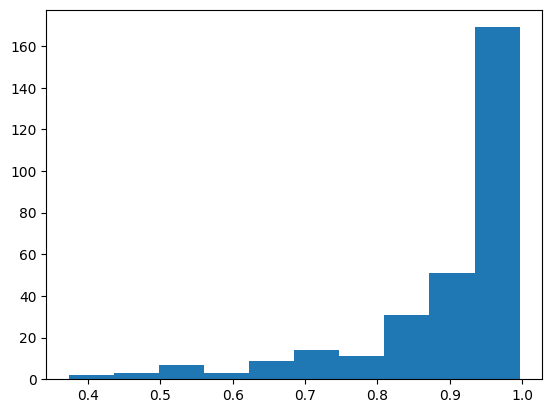

In [88]:
base_resample_df = answers_to_df(
        [base_resamples_ans], [base_resamples], response_extends=None, 
        is_chat_answer=True, ans_parse_fn=last_letter_ans_fn)

plt.hist(np.exp(base_resample_df['ext_lp']))
plt.show()

plt.hist(np.exp(base_resample_df['ans_lp']));

In [43]:

baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)
baseline_df

,ans,ext_p,baseline
0,$\it{Other}$,0.357297,sample
1,OLAAH,0.012288,sample
2,OLAH,0.630415,sample
0,*Other,0.374060,last_token
1,A,0.045950,last_token
2,B,0.062566,last_token
3,C,0.139751,last_token
4,D,0.377673,last_token


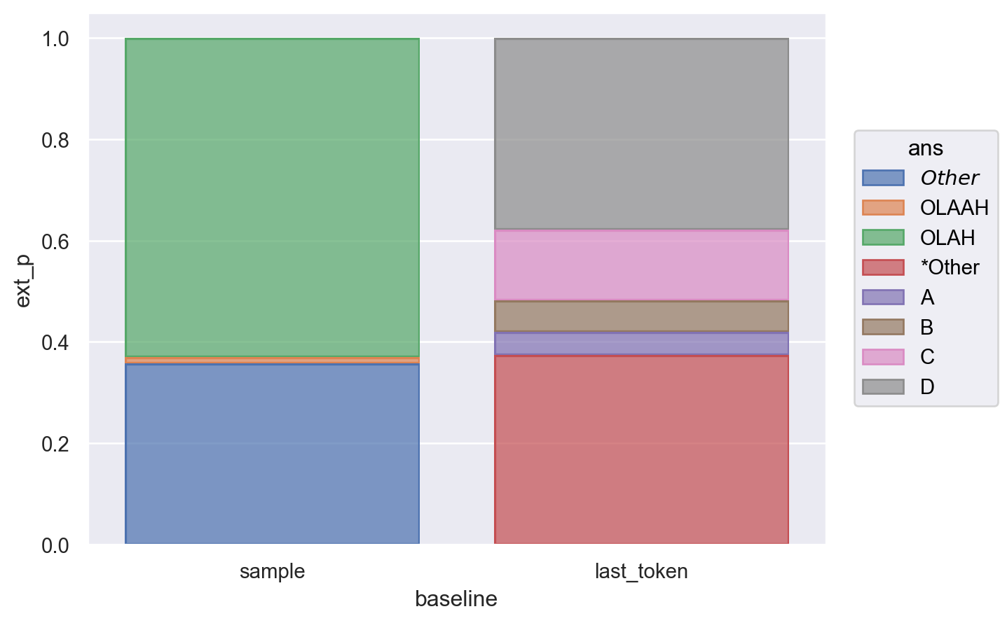

In [41]:
snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
     .add(snso.Bar(), snso.Stack())

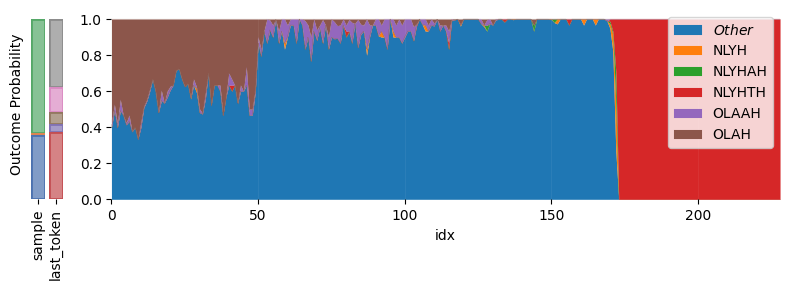

In [44]:

def plot_stack_with_baselines(
        base_tokens, idx_df, 
        base_resamples_ans, base_resamples, baseline_ans,
        normalize=True, title=None, figsize=(8, 3), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    fig, axs = plt.subplots(ncols=2, width_ratios=[.05, .95], figsize=figsize)
    
    baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)
    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(), snso.Stack()).on(axs[0]).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = fig.legends.pop(0)
    leg.set_visible(False)
    

    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=axs[1])

    ############
    ### TODO
    ############
    ###format_timeseries_plot(base_tokens, idx_df, figsize=(10, 3))
    ############
    ############
    ############
    sns.despine(ax=axs[0], left=True, bottom=True)


    axs[0].set_yticks([])
    axs[0].set_ylabel('Outcome Probability')
    axs[0].set_xlabel(None)
    axs[0].xaxis.set_tick_params(rotation=90)
    
    
    handles, _ = axs[1].get_legend_handles_labels()
    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               loc='upper right')
              # bbox_to_anchor=(1, 1))   #loc='right')
    sns.despine(ax=axs[1], left=True, bottom=True)
    axs[1].set_xlim(min(idx_df['idx']), max(idx_df['idx']))
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08
    axs[1].xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)

    plt.tight_layout()
    plt.title(title)
    
    plt.show()


plot_stack_with_baselines(base_tokens, idx_df, 
               base_resamples_ans, base_resamples, baseline_ans,
               normalize=False)

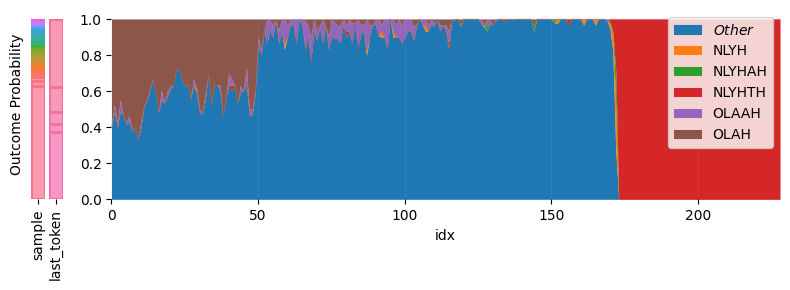

In [256]:

def plot_stack_with_baselines(
        base_tokens, idx_df, 
        base_resamples_ans, base_resamples, baseline_ans,
        normalize=True, title=None, figsize=(8, 3), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    fig, axs = plt.subplots(ncols=2, width_ratios=[.05, .95], figsize=figsize)
    
    baseline_df = pd.concat([
        get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn),
        get_baseline_final_lp(baseline_ans, parse_fn=abcd_fn_2)
    ])
    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(), snso.Stack()).on(axs[0]).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = fig.legends.pop(0)
    leg.set_visible(False)
    

    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=axs[1])

    ############
    ### TODO
    ############
    ###format_timeseries_plot(base_tokens, idx_df, figsize=(10, 3))
    ############
    ############
    ############
    sns.despine(ax=axs[0], left=True, bottom=True)


    axs[0].set_yticks([])
    axs[0].set_ylabel('Outcome Probability')
    axs[0].set_xlabel(None)
    axs[0].xaxis.set_tick_params(rotation=90)
    
    
    handles, _ = axs[1].get_legend_handles_labels()
    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               loc='upper right')
              # bbox_to_anchor=(1, 1))   #loc='right')
    sns.despine(ax=axs[1], left=True, bottom=True)
    axs[1].set_xlim(min(idx_df['idx']), max(idx_df['idx']))
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08
    axs[1].xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)

    plt.tight_layout()
    plt.title(title)
    
    plt.show()


plot_stack_with_baselines(base_tokens, idx_df, 
               base_resamples_ans, base_resamples, baseline_ans,
               normalize=False)

In [181]:
baseline_df

,ans,ext_p,baseline
0,OLAH,0.630415,sample
1,OLOAH,0.027239,sample
2,OLLAH,0.020143,sample
3,LLAH,0.018114,sample
4,OLAAH,0.012288,sample
0,*Other,0.374060,last_token
1,A,0.045950,last_token
2,B,0.062566,last_token
3,C,0.139751,last_token
4,D,0.377673,last_token


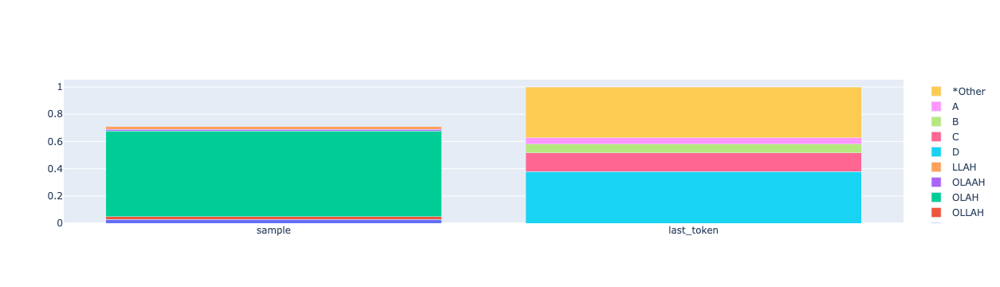

In [187]:
# fig_baseline = go.Figure()#layout=layout_baseline) 

# fig.show()



baseline_df = pd.concat([
    get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn),
    get_baseline_final_lp(baseline_ans, parse_fn=abcd_fn_2)
])

fig_baseline = go.Figure(data=[
    go.Bar(name=ans, x=baseline_df[baseline_df['ans'] == ans]['baseline'], 
                     y=baseline_df[baseline_df['ans'] == ans]['ext_p'])
    for ans in sorted(set(baseline_df['ans']))[::-1]
])

fig_baseline.update_layout(barmode='stack')

fig_baseline

In [215]:
def plotly_linked2(idx_tok_df, base_tokens, plot_n_idxs=4, include_line_fig=False):
    from ipywidgets import widgets

    idx_df = idxtok_to_idx(idx_tok_df)

    # base_tokens = base_res[0]['choice']['logprobs']['tokens']
    outcomes_set = idx_df['ans'].cat.categories

    colors = sns.color_palette(palette='viridis_r', n_colors=len(outcomes_set) - 1) + [(.9, .3, .1)]

    # ============================================================================================================================================

    layout =  go.Layout(
        title = None,
        font = {'size': 10},
        
        # xaxis_range=(0,1), 
        margin=dict(l=20, r=20, t=20, b=80),
        yaxis_range=(0, 1),
        plot_bgcolor='white',
        showlegend=True,
        
        hovermode='x',  ###  'x',

        yaxis=dict(
            title='Outcome %',
            showgrid=False
        ),

        xaxis = dict(
            tickmode = 'array',
            tickvals = list(range(min(idx_df['idx']), max(idx_df['idx']))),
            ticktext = base_tokens,

            # showline=True,
            showgrid=True,

            gridwidth=.5, 
            gridcolor='rgb(.8, .8, .8)',
        )
    )

    fig = go.FigureWidget(layout=layout) 

    fig.add_traces([
        go.Scatter( 
            name = '*Other' if outcome == OTHER_TOK else outcome, 
            x = idx_df[idx_df['ans'] == outcome]['idx'], 
            y = idx_df[idx_df['ans'] == outcome]['weighted'], 
            stackgroup='one',
            fillcolor=f'rgba{colors[oi] + (.7,)}',
            line={'color': f'rgb{colors[oi]}'}
        )
        for oi, outcome in enumerate(outcomes_set)
    ])


    # ============================================================================================================================================

    layout2 =  go.Layout(
        title = None,
        font = {'size': 10},
        
        xaxis = go.layout.XAxis(
            title = None,
            showticklabels=False),
        yaxis = go.layout.YAxis(
            title=None,
            showticklabels=False
        ),

        xaxis_range=(0,1), 
        yaxis_range=(0,1),
        margin=dict(l=20, r=20, t=20, b=20),
        plot_bgcolor='white',
        showlegend=False,
    )

    trace_kws = get_parcats(idx_tok_df, base_tokens, colors, plot_idx=0, plot_n_idxs=plot_n_idxs)

    fig2 = go.FigureWidget(data=[go.Parcats(**trace_kw) for trace_kw in trace_kws],
                          layout=layout2)


    # ============================================================================================================================================

    layout1 =  go.Layout(
        title = None,
        font = {'size': 10},
        
        # xaxis_range=(0,1), 
        margin=dict(l=20, r=20, t=60, b=40),
        # yaxis_range=(0, 1),
        plot_bgcolor='white',
        showlegend=True,
        hovermode='x',

        yaxis=dict(
            title='Outcome %',
            showgrid=False,
            # gridwidth=.5, 
            # gridcolor='rgb(.8, .8, .8)',
        ),

        xaxis = dict(
            tickmode = 'array',
            tickvals = list(range(min(idx_df['idx']), max(idx_df['idx']))),
            ticktext = base_tokens,

            showgrid=True,
            gridwidth=.5, 
            gridcolor='rgb(.8, .8, .8)',
        )
    )

    fig1 = go.FigureWidget(layout=layout1) 

    fig1.add_traces([
        go.Scatter( 
            name = outcome, 
            x = idx_df[idx_df['ans'] == outcome]['idx'], 
            y = idx_df[idx_df['ans'] == outcome]['weighted'], 
            # stackgroup='one',

            line={'color': f'rgb{colors[oi]}'}
        )
        for oi, outcome in enumerate(outcomes_set)
    ])

    # ============================================================================================================================================


    def update_point(trace, points, selector):
        """https://plotly.com/python/click-events/"""
        if len(points.xs) > 0:
            plot_idx = min(points.xs[0], max(idx_tok_df['idx']) - plot_n_idxs)

            fig_stack = fig.children[1]
            
            with fig_stack.batch_update():
                trace_kws = get_parcats(idx_tok_df, base_tokens, colors, plot_idx=plot_idx, plot_n_idxs=plot_n_idxs)
        
                for i in range(plot_n_idxs):
                    fig2.data[i].dimensions[0].values = trace_kws[i]['dimensions'][0]['values']    # current token
                    fig2.data[i].dimensions[1].values = trace_kws[i]['dimensions'][1]['values']    # next token
                    fig2.data[i].counts = trace_kws[i]['counts']
                
        
    for trace in fig.data + fig1.data:
        trace.on_click(update_point)

    #############

    layout_baseline =  go.Layout(
        width = 130,
        title = None,
        font = {'size': 10},
        margin=dict(r=0),
        showlegend=False,
        yaxis=dict(
            title='Outcome %',
            showgrid=True,
        ),
        xaxis = dict(
            tickmode = 'array',
            ticktext = ['Baseline 1', 'Baseline 2'],
        )
    )


    
    baseline_df = pd.concat([
        get_baseline_resample(base_resamples_ans, base_resamples, ans_parse_fn=last_letter_ans_fn),
        get_baseline_final_lp(baseline_ans, parse_fn=abcd_fn_2)
    ])
    
    fig_baseline = go.FigureWidget(data=[
        go.Bar(name=ans, x=baseline_df[baseline_df['ans'] == ans]['baseline'], 
                         y=baseline_df[baseline_df['ans'] == ans]['ext_p'])
        for ans in sorted(set(baseline_df['ans']))[::-1]
    ], layout=layout_baseline)
    
    fig_baseline.update_layout(barmode='stack')

    fig = widgets.HBox([fig_baseline, fig])
    figs_main = [fig1, fig, fig2] if include_line_fig else [fig, fig2]
    return figs_main, widgets.VBox(figs_main)

figs, widgets = plotly_linked2(idx_tok_df, 
                               base_tokens, plot_n_idxs=4)
widgets

    'data': [{'name': 'OLOAH',
              'type': 'bar',
     …

## CPD model (single)

### simple version     LOOK HERE  vvvvv    for ICLR PAPER!!!!

[0.12917869]
#####################################################################
#                      Seasonal  Changepoints                       #
#####################################################################
 No seasonal/periodic component present (i.e., season='none')


#####################################################################
#                      Trend  Changepoints                          #
#####################################################################
.-------------------------------------------------------------------.
| Ascii plot of probability distribution for number of chgpts (ncp) |
.-------------------------------------------------------------------.
|Pr(ncp = 0 )=0.000|*                                               |
|Pr(ncp = 1 )=0.000|*                                               |
|Pr(ncp = 2 )=0.353|*****************************************       |
|Pr(ncp = 3 )=0.412|*********************************************** |
|Pr(ncp = 4 )

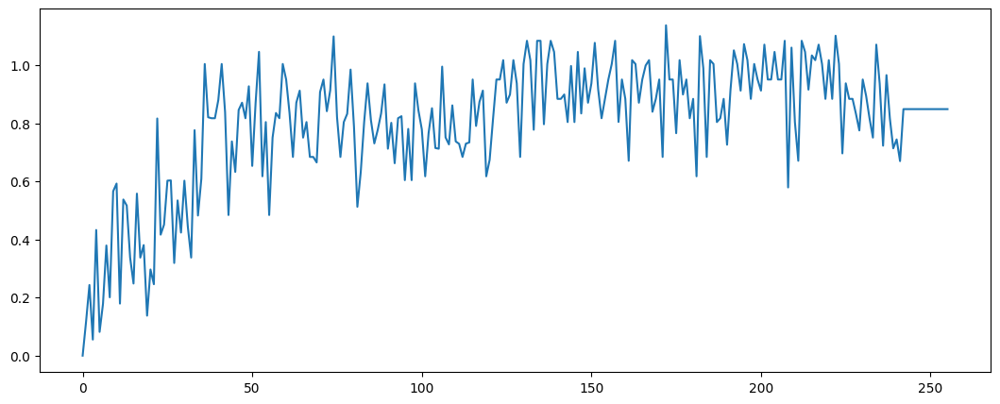

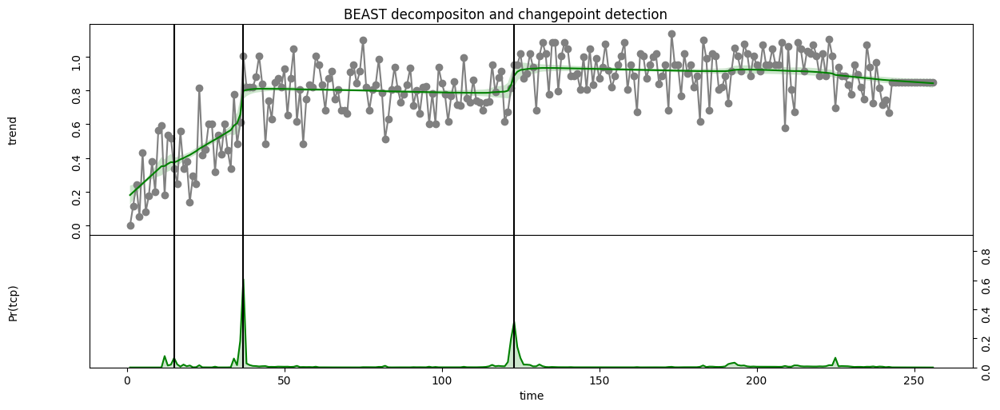

In [142]:
o = run_beast(idx_df, dist_fn = 'd_l1')
Rbeast.print(o)
plt.plot(time, y); plt.show()
Rbeast.plot(o, vars=['t', 'tcp']);


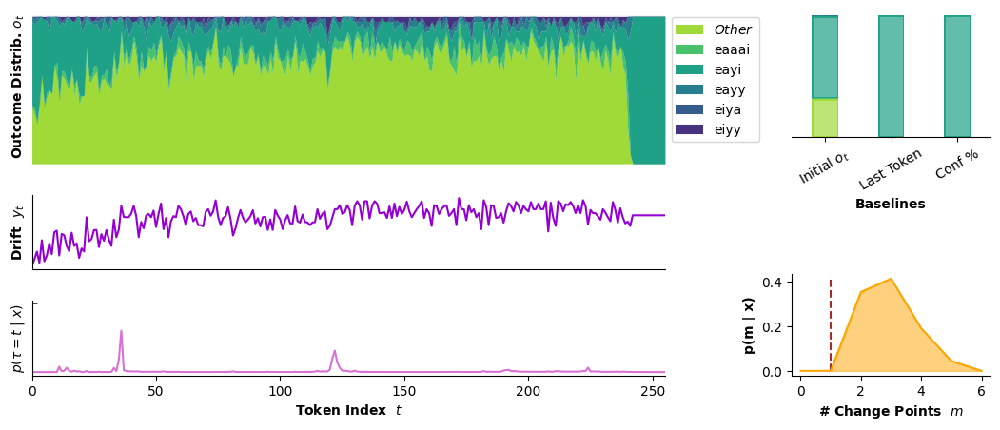

In [182]:
plot_cpd_panel(
    base_tokens, idx_df, o,
    base_therefore, base_resamples, base_resamples_ans, base_conf,
    figsize=(13, 5), parse_fn=ans_fn_bytask[task], #palette='coolwarm_r'
)

plt.savefig('out/gsm-cpd.pdf')
plt.show()

In [120]:
base_conf[0]['choice']['text']

' 100%'

In [140]:
get_baseline_df(idx_df, base_therefore, base_resamples, base_resamples_ans, base_conf, parse_fn=ans_fn_bytask[task])

,ans,ext_p,baseline
0,$\it{Other}$,2.498513e-04,last_token
1,eayi,9.997501e-01,last_token
2,$\it{Other}$,0.000000e+00,percent
3,eayi,1.000000e+00,percent
4,$\it{Other}$,3.149055e-01,sample
5,eaaai,8.926923e-03,sample
6,eayi,6.683124e-01,sample
7,eayy,7.855180e-03,sample
8,eiya,3.722180e-66,sample
9,eiyy,1.353512e-23,sample


### scratch pad

In [70]:
idx_tok_df['idx']

0      0
1      0
2      0
3      0
4      0
      ..
328    8
329    8
330    9
331    9
332    9
Name: idx, Length: 333, dtype: category
Categories (66, int64): [0, 1, 2, 3, ..., 62, 63, 64, 65]

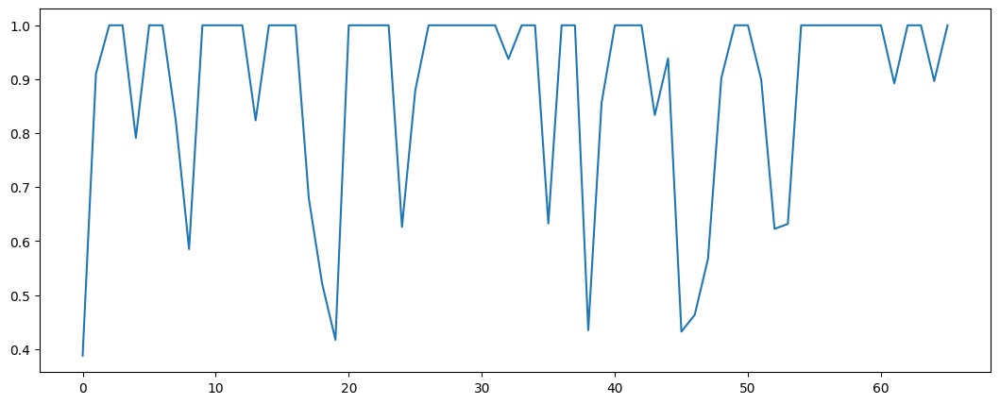

In [74]:
plt.plot([idx_tok_df[(idx_tok_df['idx'] == i) & (idx_tok_df['tok'] == w)]['tok_p'].iloc[0] for i, w in enumerate(base_tokens)])

[0.1242207]
#####################################################################
#                      Seasonal  Changepoints                       #
#####################################################################
 No seasonal/periodic component present (i.e., season='none')


#####################################################################
#                      Trend  Changepoints                          #
#####################################################################
.-------------------------------------------------------------------.
| Ascii plot of probability distribution for number of chgpts (ncp) |
.-------------------------------------------------------------------.
|Pr(ncp = 0 )=0.000|*                                               |
|Pr(ncp = 1 )=0.001|*                                               |
|Pr(ncp = 2 )=0.678|*********************************************** |
|Pr(ncp = 3 )=0.273|*******************                             |
|Pr(ncp = 4 )=

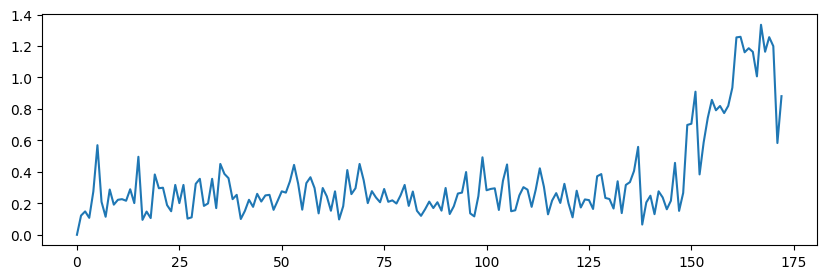

CPU times: user 865 ms, sys: 114 ms, total: 979 ms
Wall time: 761 ms


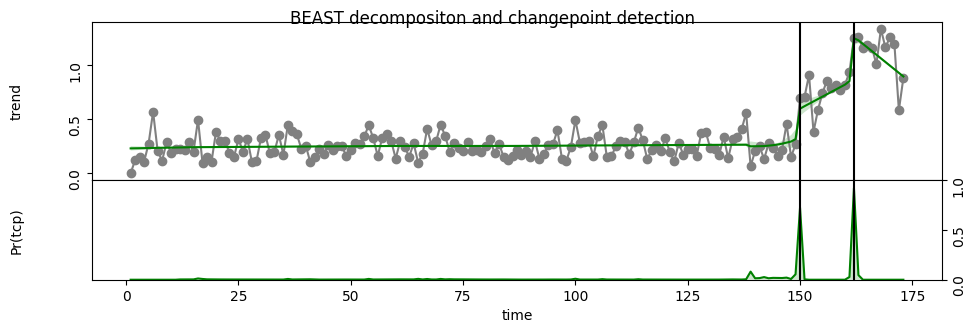

In [11]:
%%time


dist_fn = 'd_l1'

dist_df = get_dists(idx_df)
dist_df = dist_df.sort_values(by='idx')

## y = jitter_lim(y, .01)
y = dist_df[dist_fn].to_numpy()
time  = dist_df['idx'].to_numpy()

range_y = y.max() - y.min()

alpha2_d = {'d_kl': 10.0 + (1000 ** (1.0 - range_y)),
            'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
            'd_l2': 5.0  + (1000 ** (1.0 - range_y))}

alpha2 = alpha2_d[dist_fn]


o = Rbeast.beast(y, time=time, season='none',
                 tcp_minmax=[0, 6],  torder_minmax=[1, 1], tseg_minlength=10,
                 mcmc_seed=0, mcmc_chains=9,
                 mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
                 # mcmc_burnin=200, mcmc_samples=8000, mcmc_thin=5,
                 print_progress=False, print_options=False, quiet=True, 
                 
                 precPriorType='constant', precValue=10,   # manually set \nu = 10   (TODO: should this be 1.5?)
                 alpha1=.01,                 # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                 alpha2=alpha2,              # min alpha2: MIN_ALPHA2_VALUE=.0001
                 
                 dump_mcmc=True,
                 #### Default values for alpha1/2, delta1/2: 1.0   (or 1e-8??)
                 ####   Source: https://github.com/zhaokg/Rbeast/blob/master/Source/beastv2_io_in_args.c#L758
                 ####   Alt??:  https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                )
# [0.00541511]
print(np.sqrt(o.sig2))

Rbeast.print(o)
plt.plot(time, y); plt.show()
Rbeast.plot(o, vars=['t', 'tcp']);

In [21]:
# trend shape: (seq_len, mcmc_samples, mcmc_chains)
o.mcmc.trend.shape

(239, 20000, 9)

In [22]:
o.mcmc.trend[:, 0, 0].shape

(239,)

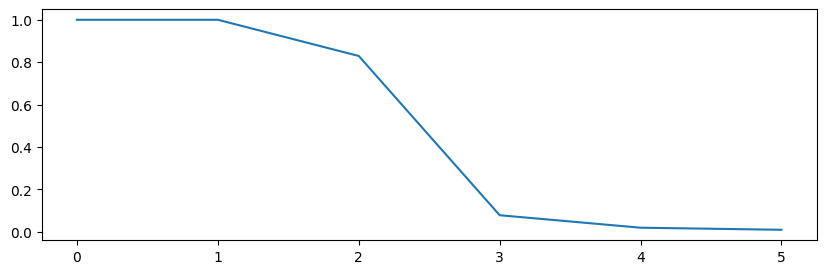

In [100]:
plt.plot(o.trend.cpPr)

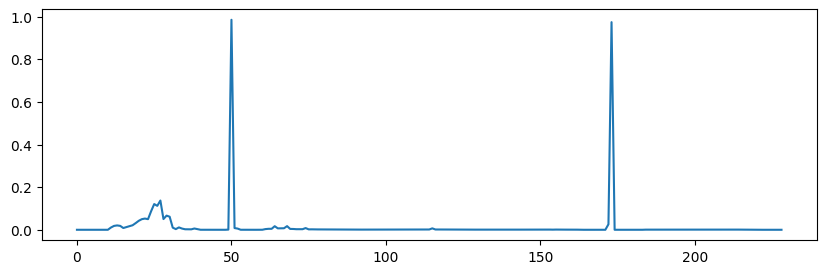

In [101]:

plt.plot(o.trend.cpOccPr)

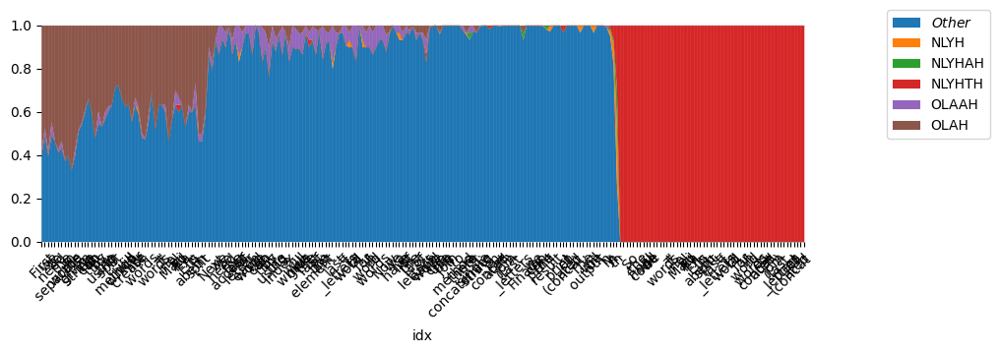

In [84]:
plot_stack(base_tokens, idx_df, normalize=False)
# plt.vlines(45, 0, 1)

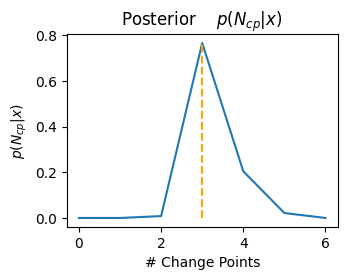

In [102]:
plt.rcParams['figure.figsize'] = (3.5, 2.5)
ncp_prob = o.trend.ncpPr 
plt.plot(ncp_prob)
plt.vlines(get_percentile_cp(ncp_prob, percentile=.5), 
          min(ncp_prob), max(ncp_prob), ls='--', color='orange')

plt.title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
plt.ylabel('$p(N_{cp} | x)$')
plt.xlabel('# Change Points')
plt.show()

In [302]:
ncp_prob

array([0.        , 0.        , 0.008255  , 0.766005  , 0.20414498,
       0.021595  , 0.        ], dtype=float32)

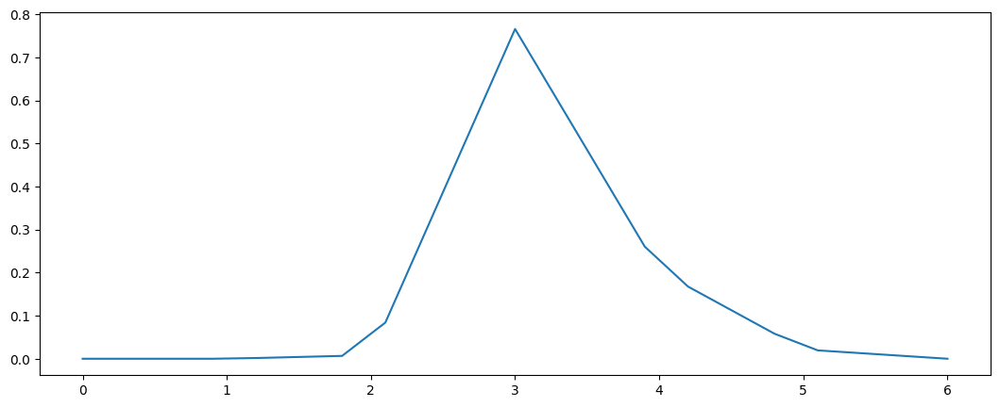

In [331]:
m_max = len(ncp_prob)
interp1d = scipy.interpolate.interp1d(range(m_max), ncp_prob)

xs = np.linspace(0, m_max-1, m_max*3)
ys = [interp1d(i) for i in xs]
plt.plot(xs, ys)


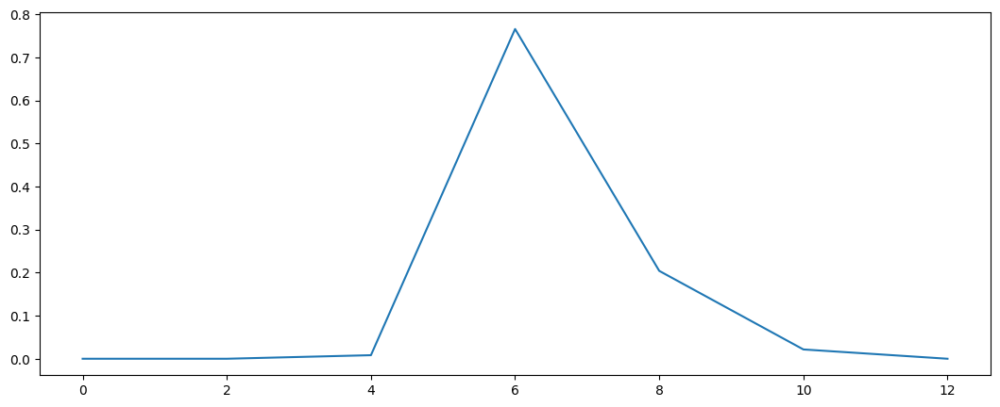

In [325]:
np.array([1,5,11,9,13,21])


[' None', ' of', ' the', ' above', '.']

In [32]:
base_therefore[0]['choice']['text']

' None of the above.'

In [41]:
[
    (k, np.exp(v))
    for k, v in base_therefore[0]['choice']['logprobs']['top_logprobs'][0].items()
][:20]

[(' None', 0.22219811170278578),
 (' Not', 0.16097889653684005),
 (' NOT', 0.11193043687270454),
 (' N', 0.08268926433085474),
 (' not', 0.06384237015765963),
 (' There', 0.06016132951101824),
 (' none', 0.042323702799385424),
 (' NONE', 0.029994540416443942),
 (' \n', 0.02615182503220438),
 ('\n', 0.023040113890559936),
 (' The', 0.018003033635156065),
 (' there', 0.013616155320655519),
 (' F', 0.01333823441436912),
 (' D', 0.011985268599992839),
 (' No', 0.008809076223324875),
 (' This', 0.007367520948428767),
 (' the', 0.006510799625283489),
 (' "', 0.006116014011254153),
 ('\n\n', 0.0044818574908160975),
 (' A', 0.004404468875333802)]

In [54]:
[
    (k, np.exp(v))
    for k, v in base_conf[0]['choice']['logprobs']['top_logprobs'][1].items()
][:20]

[('100', 0.4597078775648237),
 ('99', 0.11917020662658986),
 ('90', 0.10415941675999174),
 ('95', 0.089124055302081),
 ('75', 0.05055385880649269),
 ('0', 0.04896989291584669),
 ('50', 0.037505578390087786),
 ('80', 0.030743751765325365),
 (' ', 0.02322976148022634),
 ('70', 0.009086726106217578),
 ('85', 0.0064903618163324635),
 ('60', 0.004048184783261113),
 ('98', 0.003308383425442275),
 ('25', 0.0023416588277877276),
 ('N', 0.0017253173058403527),
 (' N', 0.0015550241545483107),
 ('97', 0.0008799662530800725),
 ('None', 0.00035948604476960784),
 ('65', 0.0003417700552850436),
 ('33', 0.00034030849959460244)]

In [64]:
therefore_tok = base_therefore[0]['choice']['logprobs']['tokens'][0]
print(therefore_tok)

# use index [1] instead of [0] since it looks like GPT always parses the first token as 
#   a space ' ' instead of having numbers be spaceless
conf_tok_probs = sorted([(k, np.exp(v))
    for k, v in base_conf[0]['choice']['logprobs']['top_logprobs'][1].items()],
    key=lambda x: -x[1])

conf_tlp = conf_tok_probs[0]
print(conf_tlp)

print(int(float(
        base_conf[0]['choice']['text'].split('%')[0])))

 None
('100', 0.4597078775648237)
100


In [70]:
np.exp(np.array(base_conf[0]['choice']['logprobs']['token_logprobs']))

array([0.90090396, 0.45970788, 0.92715377])

In [72]:
base_conf[0]['choice']['text'].split('%')[0]

' 100'

In [94]:
get_baseline_conf(base_therefore, base_conf, parse_fn=ans_fn_bytask[task])

,ans,ext_p,baseline
0,$\textit{Other},100,percent
1,Not: $\textit{Other},0,percent


In [93]:
ans_fn_bytask[task]('blah blah')

'$\\textit{Other}'

In [98]:
get_baseline_df(base_resamples_ans, base_resamples, base_therefore, idx_df)

,ans,ext_p,baseline
0,$\it{Other}$,0.067414,sample
1,A,0.054837,sample
2,C,0.062648,sample
3,D,0.084947,sample
4,E,0.730154,sample
0,*Other,0.976348,last_token
1,A,0.005322,last_token
2,B,0.000265,last_token
3,C,0.002319,last_token
4,D,0.012098,last_token


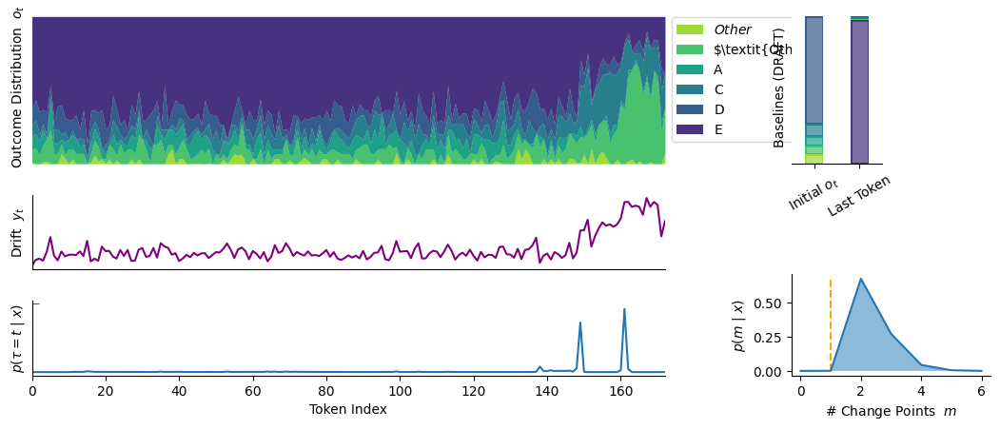

In [97]:

# df = pd.DataFrame({'x_values': range(1,101), 'y_values': np.random.randn(100)*15+range(1,101), 'z_values': (np.random.randn(100)*15+range(1,101))*2 })




def plot_grid(
        base_tokens, idx_df, o,   # TODO: y  -- drift
        baseline_ans, base_resamples, base_resamples_ans, 
        normalize=True, title=None, figsize=(12, 6), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)


    outcome_colors = sns.color_palette(palette='viridis_r', n_colors=len(set(idx_df['ans']))) + [(.9, .3, .1)]
    sns.set_palette(outcome_colors)
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=(1.0, .99))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution  $o_t$')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    
    
    # ------------------------------------------------------------------------------------------
    ax_bases = plt.subplot2grid(subs_size, (0, time_size+1), colspan=1, rowspan=stack_size)
    
    baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)

    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).scale(color=outcome_colors) \
         .on(ax_bases).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = plt.gcf().legends.pop(0)
    leg.set_visible(False)

    
    ax_bases.set_xticks([0, 1], labels=['Initial $o_t$', 'Last Token'])
    ax_bases.set_yticks([])
    ax_bases.set_ylabel('Baselines (DRAFT)')
    ax_bases.set_xlabel(None)
    ax_bases.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax_bases, left=True)

    # ------------------------------------------------------------------------------------------
    sns.set_palette('tab10')
    
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='purple')
    ax_dist.set_ylabel('Drift  $y_t$')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr)
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ x)$')
    ax_tau.set_xlabel('Token Index')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_m = plt.subplot2grid(subs_size, (stack_size + y2_size + 1, time_size+1), colspan=2, rowspan=y2_size+1)

    ncp_prob = o.trend.ncpPr 

    ax_m.vlines(1, min(ncp_prob), max(ncp_prob), ls='--', color='orange')
    

    ax_m.fill_between(range(1, len(ncp_prob)), ncp_prob[1:], alpha=.5)
    ax_m.plot(ncp_prob)
    
    
    
    # ax3.set_title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
    ax_m.set_ylabel('$p(m  \ | \   x)$')
    ax_m.set_xlabel('# Change Points  $m$')
    sns.despine(ax=ax_m)


    # ------------------------------------------------------------------------------------------
    plt.title(title)


plot_grid(
    base_tokens, idx_df, o,
    base_therefore, base_resamples, base_resamples_ans,
    figsize=(13, 5)
)

# plt.savefig('out/gsm-cpd.pdf')
plt.show()

In [35]:

# df = pd.DataFrame({'x_values': range(1,101), 'y_values': np.random.randn(100)*15+range(1,101), 'z_values': (np.random.randn(100)*15+range(1,101))*2 })




def plot_grid(
        base_tokens, idx_df, o,   # TODO: y  -- drift
        baseline_ans, base_resamples, base_resamples_ans, 
        normalize=True, title=None, figsize=(12, 6), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)


    outcome_colors = sns.color_palette(palette='viridis_r', n_colors=len(set(idx_df['ans']))) + [(.9, .3, .1)]
    sns.set_palette(outcome_colors)
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=(1.0, .99))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution  $o_t$')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    
    
    # ------------------------------------------------------------------------------------------
    ax_bases = plt.subplot2grid(subs_size, (0, time_size+1), colspan=1, rowspan=stack_size)
    
    baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)

    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).scale(color=outcome_colors) \
         .on(ax_bases).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = plt.gcf().legends.pop(0)
    leg.set_visible(False)

    
    ax_bases.set_xticks([0, 1], labels=['Initial $o_t$', 'Last Token'])
    ax_bases.set_yticks([])
    ax_bases.set_ylabel('Baselines (DRAFT)')
    ax_bases.set_xlabel(None)
    ax_bases.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax_bases, left=True)

    # ------------------------------------------------------------------------------------------
    sns.set_palette('tab10')
    
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='purple')
    ax_dist.set_ylabel('Drift  $y_t$')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr)
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ x)$')
    ax_tau.set_xlabel('Token Index')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_m = plt.subplot2grid(subs_size, (stack_size + y2_size + 1, time_size+1), colspan=2, rowspan=y2_size+1)

    ncp_prob = o.trend.ncpPr 

    ax_m.vlines(1, min(ncp_prob), max(ncp_prob), ls='--', color='orange')
    

    ax_m.fill_between(range(1, len(ncp_prob)), ncp_prob[1:], alpha=.5)
    ax_m.plot(ncp_prob)
    
    
    
    # ax3.set_title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
    ax_m.set_ylabel('$p(m  \ | \   x)$')
    ax_m.set_xlabel('# Change Points  $m$')
    sns.despine(ax=ax_m)


    # ------------------------------------------------------------------------------------------
    plt.title(title)


plot_grid(
    base_tokens, idx_df, o,
    base_therefore, base_resamples, base_resamples_ans,
    figsize=(13, 5)
)

# plt.savefig('out/gsm-cpd.pdf')
plt.show()

NameError: name 'o' is not defined

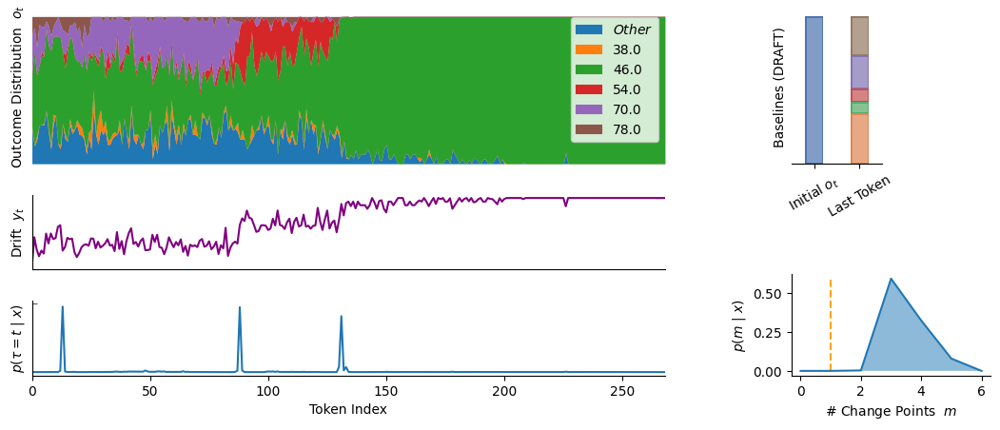

In [108]:

# df = pd.DataFrame({'x_values': range(1,101), 'y_values': np.random.randn(100)*15+range(1,101), 'z_values': (np.random.randn(100)*15+range(1,101))*2 })




def plot_grid(
        base_tokens, idx_df, o,
        base_resamples_ans, base_resamples, baseline_ans,
        normalize=True, title=None, figsize=(12, 6), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=(1.0, .99))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution  $o_t$')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    
    
    # ------------------------------------------------------------------------------------------
    ax_bases = plt.subplot2grid(subs_size, (0, time_size+1), colspan=1, rowspan=stack_size)
    
    baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)
    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).on(ax_bases).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = plt.gcf().legends.pop(0)
    leg.set_visible(False)

    
    ax_bases.set_xticks([0, 1], labels=['Initial $o_t$', 'Last Token'])
    ax_bases.set_yticks([])
    ax_bases.set_ylabel('Baselines (DRAFT)')
    ax_bases.set_xlabel(None)
    ax_bases.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax_bases, left=True)


    # ------------------------------------------------------------------------------------------
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='purple')
    ax_dist.set_ylabel('Drift  $y_t$')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr)
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ x)$')
    ax_tau.set_xlabel('Token Index')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_m = plt.subplot2grid(subs_size, (stack_size + y2_size + 1, time_size+1), colspan=2, rowspan=y2_size+1)

    ncp_prob = o.trend.ncpPr 

    """
    prior_fn = lambda n_cp: scipy.stats.geom(.5).pmf(n_cp + 1) 
    prior_vals = [prior_fn(i) for i in range(len(ncp_like))]
    prior_vals = np.array(prior_vals) / sum(prior_vals)
    
    prior_ratio = .5    
    y_posts = [(( likelihood ** (1 - prior_ratio) )  *
                ( prior_fn(n_cp) ** prior_ratio) ))
               for n_cp, likelihood in enumerate(ncp_like)]
    
    y_posts = np.array(y_posts) / sum(y_posts)
    """

    """
    def get_percentile_cp_interp(posts, percentile=.1, interp=5):
        m_max = len(posts)
        interp1d = scipy.interpolate.interp1d(range(m_max), ncp_prob)
        
        xs = np.linspace(0, m_max-1, m_max*interp)
        ys = [interp1d(i) / interp   for i in xs]

        csum = np.cumsum(ys)
        return xs[ np.where(csum >= percentile)[0][0] ]

    # Line at point where bayes factor is 9 (i.e. 90% quantile)
    ax_m.vlines(get_percentile_cp_interp(ncp_prob, percentile=.1), 
              min(ncp_prob), max(ncp_prob), ls='--', color='orange')
    """

    ax_m.vlines(1, min(ncp_prob), max(ncp_prob), ls='--', color='orange')
    

    ax_m.fill_between(range(1, len(ncp_prob)), ncp_prob[1:], alpha=.5)
    ax_m.plot(ncp_prob)
    
    
    
    # ax3.set_title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
    ax_m.set_ylabel('$p(m  \ | \   x)$')
    ax_m.set_xlabel('# Change Points  $m$')
    sns.despine(ax=ax_m)


    # ------------------------------------------------------------------------------------------
    plt.title(title)


plot_grid(
    base_tokens, idx_df, o,
    base_resamples_ans, base_resamples, baseline_ans,
    figsize=(13, 5)
)

plt.savefig('out/gsm-cpd.pdf')
plt.show()

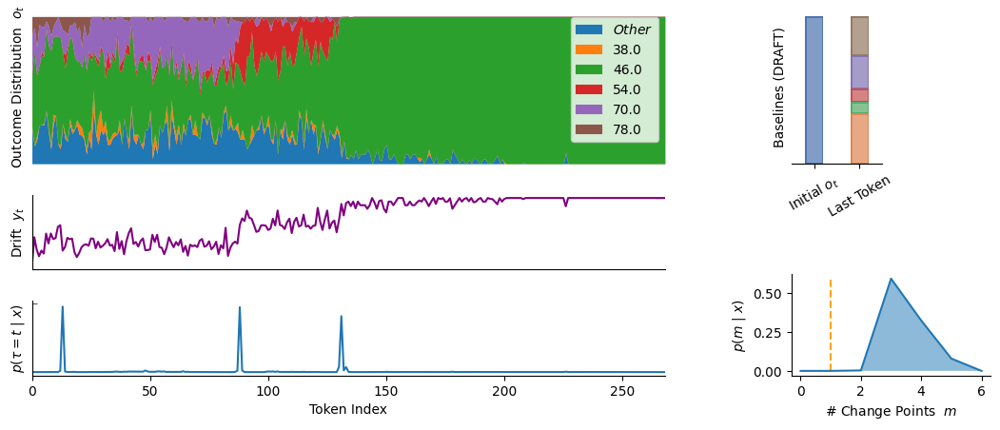

In [109]:

# df = pd.DataFrame({'x_values': range(1,101), 'y_values': np.random.randn(100)*15+range(1,101), 'z_values': (np.random.randn(100)*15+range(1,101))*2 })




def plot_grid(
        base_tokens, idx_df, o,   # TODO: y  -- drift
        base_resamples_ans, base_resamples, baseline_ans,
        normalize=True, title=None, figsize=(12, 6), **kwargs):
    """Plot timeseries for categorical answers, with each answer as a different color."""
    plt.rcParams['figure.figsize'] = figsize

    time_size = 6
    stack_size = 6
    y2_size = 3
    
    subs_size = (stack_size + y2_size*2 + 2, time_size + 3)
          
    # ------------------------------------------------------------------------------------------
    ax_stack = plt.subplot2grid(subs_size, (0, 0), colspan=time_size, rowspan=stack_size)
    
    mi = max(idx_df['idx'])
    x_lines_alpha = .15 if mi < 150 else .08

    
    if normalize:
        pt = pd.crosstab(index=idx_df['idx'], columns=idx_df['ans'], values=idx_df['weighted'], aggfunc='sum', normalize='index')  ## NORMALIZE
    else:
        pt = pd.pivot_table(idx_df, columns=['ans'], index=['idx'], values=['weighted'],   observed=False)
    pt.plot.area(lw=.05, ax=ax_stack)

    handles, _ = ax_stack.get_legend_handles_labels()
    

    t_min, t_max = min(idx_df['idx']), max(idx_df['idx'])
    ax_stack.set_xlim(t_min, t_max)

    plt.legend(handles=handles, labels=idx_df['ans'].cat.categories.tolist(),
               # loc='upper right')
               bbox_to_anchor=(1.0, .99))   #loc='right')
    ax_stack.xaxis.grid(True, color='white', alpha=x_lines_alpha, ls='-', lw=.5)
    ax_stack.set_ylabel('Outcome Distribution  $o_t$')
    # ax_stack.set_yticks([0, .25, .5, .75, 1.0], labels=[])
    ax_stack.set_yticks([])
    ax_stack.set_xticks([])
    ax_stack.set_xlabel(None)
    sns.despine(ax=ax_stack, left=True, bottom=True)
    
    
    # ------------------------------------------------------------------------------------------
    ax_bases = plt.subplot2grid(subs_size, (0, time_size+1), colspan=1, rowspan=stack_size)
    
    baseline_df = get_baseline_df(base_resamples_ans, base_resamples, baseline_ans, idx_df)
    snso.Plot(baseline_df, x='baseline', y="ext_p", color="ans") \
         .add(snso.Bar(width=.4), snso.Stack()).on(ax_bases).plot()

    # Remove legend from seaborn objects plot
    #   https://stackoverflow.com/a/73634440/4248948
    leg = plt.gcf().legends.pop(0)
    leg.set_visible(False)

    
    ax_bases.set_xticks([0, 1], labels=['Initial $o_t$', 'Last Token'])
    ax_bases.set_yticks([])
    ax_bases.set_ylabel('Baselines (DRAFT)')
    ax_bases.set_xlabel(None)
    ax_bases.xaxis.set_tick_params(rotation=30)
    sns.despine(ax=ax_bases, left=True)


    # ------------------------------------------------------------------------------------------
    ax_dist = plt.subplot2grid(subs_size, (stack_size + 1, 0), colspan=time_size, rowspan=y2_size)
    ax_dist.plot(time, y, color='purple')
    ax_dist.set_ylabel('Drift  $y_t$')
    ax_dist.set_xticks([])
    ax_dist.set_yticks([])
    ax_dist.set_xlim(t_min, t_max)
    sns.despine(ax=ax_dist)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_tau = plt.subplot2grid(subs_size, (stack_size + y2_size + 2, 0), colspan=time_size, rowspan=y2_size)
    ax_tau.plot(o.trend.cpOccPr)
    ax_tau.set_ylabel('$p(\\tau = t  \ | \ x)$')
    ax_tau.set_xlabel('Token Index')
    ax_tau.set_yticks([])  # [0, 1.0])
    ax_tau.hlines(y=1.0, xmin=t_min, xmax=2, color='black', lw=.5)#, ls='--', color='grey')
    ax_tau.set_xlim(t_min, t_max)
    sns.despine(ax=ax_tau)
    
    
    
    # ------------------------------------------------------------------------------------------
    ax_m = plt.subplot2grid(subs_size, (stack_size + y2_size + 1, time_size+1), colspan=2, rowspan=y2_size+1)

    ncp_prob = o.trend.ncpPr 

    ax_m.vlines(1, min(ncp_prob), max(ncp_prob), ls='--', color='orange')
    

    ax_m.fill_between(range(1, len(ncp_prob)), ncp_prob[1:], alpha=.5)
    ax_m.plot(ncp_prob)
    
    
    
    # ax3.set_title('Posterior    $p(N_{cp} | x)$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
    ax_m.set_ylabel('$p(m  \ | \   x)$')
    ax_m.set_xlabel('# Change Points  $m$')
    sns.despine(ax=ax_m)


    # ------------------------------------------------------------------------------------------
    plt.title(title)


plot_grid(
    base_tokens, idx_df, o,
    base_resamples_ans, base_resamples, baseline_ans,
    figsize=(13, 5)
)

plt.savefig('out/gsm-cpd.pdf')
plt.show()

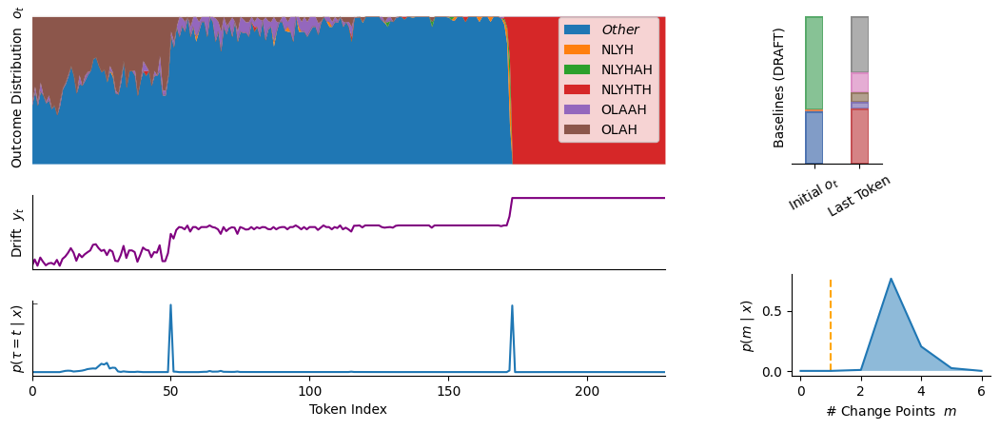

In [62]:

plot_grid(
    base_tokens, idx_df, o,
    base_resamples_ans, base_resamples, baseline_ans,
    figsize=(13, 5)
)

In [349]:
o.trend.ncpPr

array([0.        , 0.        , 0.008255  , 0.766005  , 0.20414498,
       0.021595  , 0.        ], dtype=float32)

#### more detailed stuff

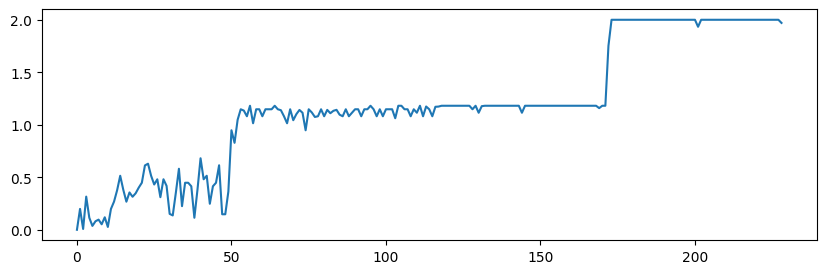

Adding prior to model: alpha1 = 0.01
Adding prior to model: alpha2 = 2.001

[0.15916699]
#####################################################################
#                      Seasonal  Changepoints                       #
#####################################################################
 No seasonal/periodic component present (i.e., season='none')


#####################################################################
#                      Trend  Changepoints                          #
#####################################################################
.-------------------------------------------------------------------.
| Ascii plot of probability distribution for number of chgpts (ncp) |
.-------------------------------------------------------------------.
|Pr(ncp = 0 )=0.000|*                                               |
|Pr(ncp = 1 )=0.000|*                                               |
|Pr(ncp = 2 )=0.002|*                                               |
|Pr(ncp

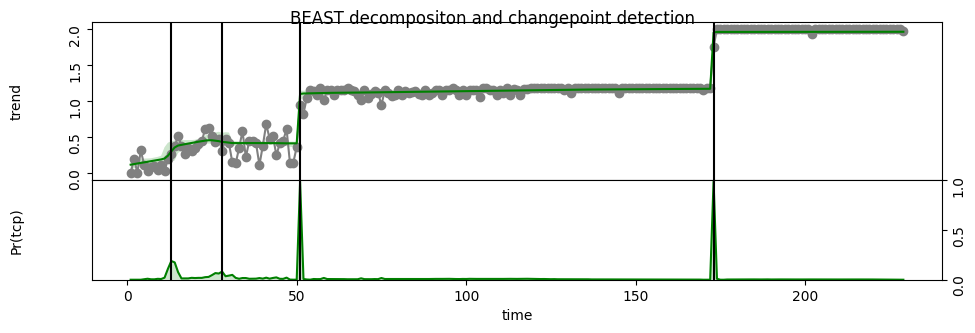

In [21]:
%%time


dist_fn = 'd_l1'

dist_df = get_dists(idx_df)
dist_df = dist_df.sort_values(by='idx')

## y = jitter_lim(y, .01)
y = dist_df[dist_fn].to_numpy()
time  = dist_df['idx'].to_numpy()

plt.plot(time, y); plt.show()

range_y = y.max() - y.min()

alpha2_d = {'d_kl': 10.0 + (1000 ** (1.0 - range_y)),
            'd_l1': 2.0  + (1000 ** (1.0 - range_y)),
            'd_l2': 5.0  + (1000 ** (1.0 - range_y))}

alpha2 = alpha2_d[dist_fn]


o = Rbeast.beast(y, time=time, season='none',
                 tcp_minmax=[0, 6],  torder_minmax=[0, 1], # tseg_minlength=20,
                 mcmc_seed=0, mcmc_chains=10,
                 mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
                 # mcmc_burnin=200, mcmc_samples=8000, mcmc_thin=5,
                 print_progress=False, print_options=False, quiet=True, 
                 
                 precPriorType='constant', precValue=10,   # manually set \nu = 10   (TODO: should this be 1.5?)
                 alpha1=.01,                 # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                 alpha2=alpha2,              # min alpha2: MIN_ALPHA2_VALUE=.0001
                 #### Default values for alpha1/2, delta1/2: 1.0   (or 1e-8??)
                 ####   Source: https://github.com/zhaokg/Rbeast/blob/master/Source/beastv2_io_in_args.c#L758
                 ####   Alt??:  https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                )
# [0.00541511]
print(np.sqrt(o.sig2))

Rbeast.print(o)
Rbeast.plot(o, vars=['t', 'tcp']);



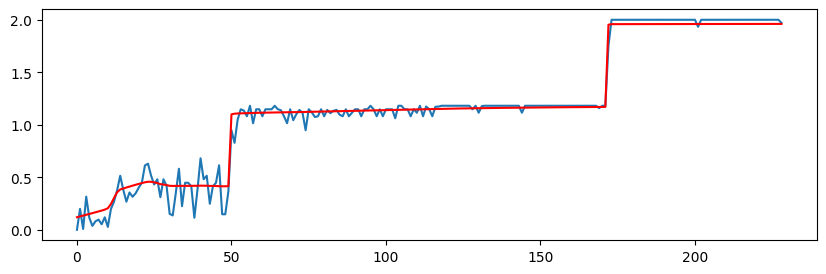

In [20]:
plt.plot(o.data)
plt.plot(o.trend.Y, color='red')


<Axes: xlabel='idx', ylabel='d_l2'>

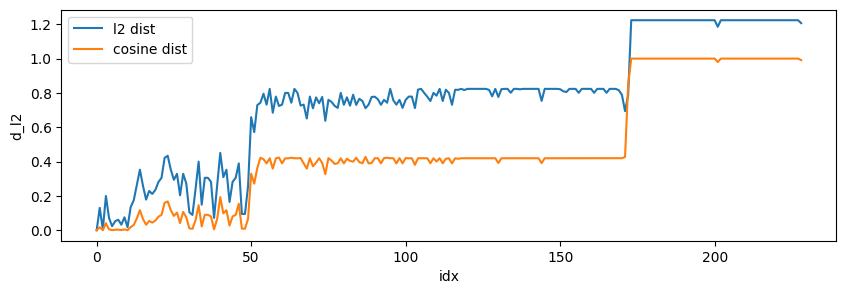

In [23]:
# sns.lineplot(get_dists(idx_df), x='idx', y='d_kl', label='kl dist')
sns.lineplot(get_dists(idx_df), x='idx', y='d_l2', label='l2 dist')
sns.lineplot(get_dists(idx_df), x='idx', y='d_cos', label='cosine dist')


Likelihood 10th percentile N_cp =  2
Likelihood 50th percentile (mean) N_cp =  3
Likelihood Expectated value of N_cp =  3.6945503593888134
Posterior 10th percentile N_cp =  0
Posterior 50th percentile (mean) N_cp =  2
Posterior Expectated value of N_cp =  2.3251075164336226


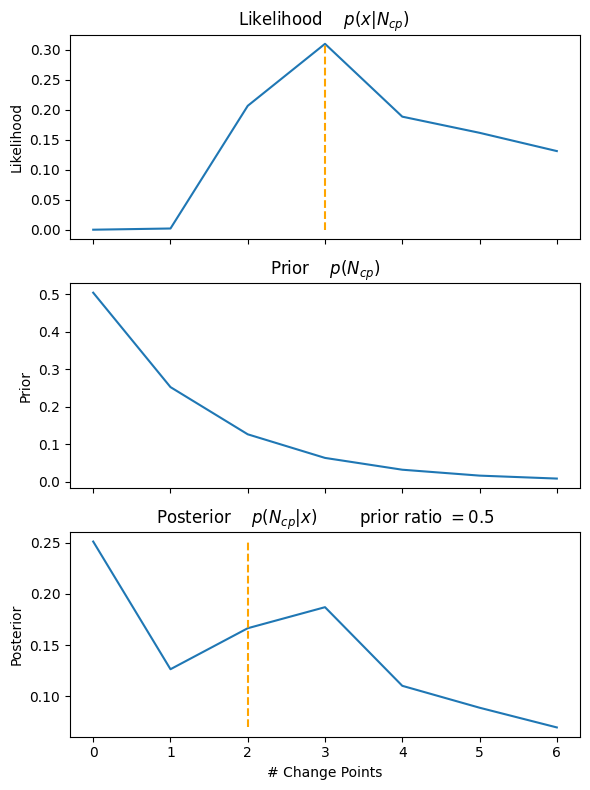

In [50]:
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(6, 8))

# actually this is the posterior p(N_cp | x), but it's uniform prior and we reweight it so treat it as likelihood
ncp_like = o.trend.ncpPr  

# --------------------------------------------------------------------------------------------
# Likelihood
axs[0].plot(ncp_like)
axs[0].vlines(get_percentile_cp(ncp_like, percentile=.5), 
              min(ncp_like), max(ncp_like), ls='--', color='orange')
axs[0].set_title('Likelihood    $p(x | N_{cp})$ ')              ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
axs[0].set_ylabel('Likelihood')

print('Likelihood 10th percentile N_cp = ', get_percentile_cp(ncp_like, percentile=.1))
print('Likelihood 50th percentile (mean) N_cp = ', get_percentile_cp(ncp_like, percentile=.5))
print('Likelihood Expectated value of N_cp = ', get_expected_ncp(ncp_like))

# --------------------------------------------------------------------------------------------
# Prior
prior_fn = lambda n_cp: scipy.stats.geom(.5).pmf(n_cp + 1) 
prior_vals = [prior_fn(i) for i in range(len(ncp_like))]
prior_vals = np.array(prior_vals) / sum(prior_vals)

axs[1].plot(prior_vals)
axs[1].set_title('Prior    $p(N_{cp})$')
axs[1].set_ylabel('Prior')

# --------------------------------------------------------------------------------------------
# Posterior
prior_ratio = .5

y_posts = [((1 - prior_ratio) * likelihood  +
            (prior_ratio)     * prior_fn(n_cp))
           for n_cp, likelihood in enumerate(ncp_like)]

y_posts = np.array(y_posts) / sum(y_posts)

print('Posterior 10th percentile N_cp = ', get_percentile_cp(y_posts, percentile=.1))
print('Posterior 50th percentile (mean) N_cp = ', get_percentile_cp(y_posts, percentile=.5))
print('Posterior Expectated value of N_cp = ', get_expected_ncp(y_posts))


axs[2].plot(y_posts)
axs[2].vlines(get_percentile_cp(y_posts, percentile=.5), 
              min(y_posts), max(y_posts), ls='--', color='orange')
axs[2].set_title(f'Posterior    $p(N_{{cp}} | x )$        prior ratio $ = {prior_ratio}$')    ### = \frac{1}{\\theta} \sum_\\theta \ \  p(x | \\theta, \ |\\theta| = N_{cp})
axs[2].set_ylabel('Posterior')


axs[2].set_xlabel('# Change Points')
axs[2].set_xticks(range(len(ncp_like)))
axs[2].set_xticklabels(range(len(ncp_like)))
plt.tight_layout()

Text(0.5, 0, 'Context Token Index')

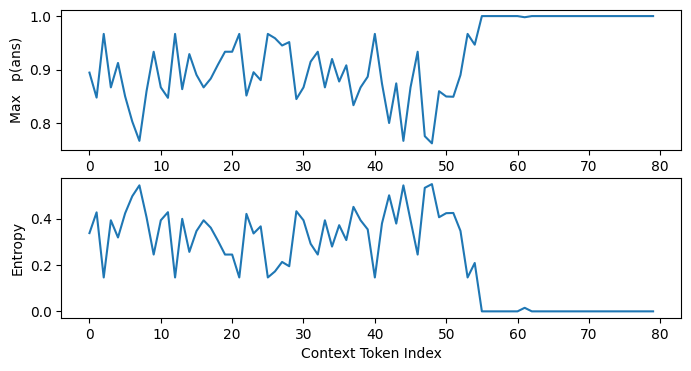

In [4]:
fig, axs = plt.subplots(2, 1, figsize=(8, 4))

axs[0].plot(idx_df[['idx', 'weighted']].groupby('idx').aggregate('max').reset_index()['weighted'])
axs[0].set_ylabel('Max   p(ans)')

axs[1].plot(idx_df[['idx', 'weighted']].groupby('idx').aggregate(get_entropy).reset_index()['weighted'])
axs[1].set_ylabel('Entropy')
axs[1].set_xlabel('Context Token Index')
# plt.yscale('log')

In [88]:
dx = idx_tok_df[['idx', 'tok', 'ans', 'tok_p']].drop_duplicates(['idx', 'tok', 'ans'])
dx[dx['idx'] == 0]

,idx,tok,ans,tok_p
0,0,\n,nlyh,0.000000
1,0,\n,nlyhah,0.000000
2,0,\n,nlyhsh,0.000000
3,0,\n,nlyhth,0.000000
4,0,\n,olaah,0.000000
5,0,\n,olah,0.077258
6,0,\n,$\it{Other}$,0.077258
7,0,\n\n,nlyh,0.000000
8,0,\n\n,nlyhah,0.000000
9,0,\n\n,nlyhsh,0.000000


## forking tokens analysis

In [13]:
tok_dist_df = get_forktok_ts(idx_tok_df, base_res)

tok_dist_df.head()

,idx,d_l1,d_l2,d_cos,d_kl
0,0,0.818018,0.582063,0.028828,0.142889
1,1,0.089819,0.061562,0.001106,0.001263
2,2,0.129575,0.088839,0.008698,0.030236
3,3,0.067150,0.044503,0.003256,0.019134
4,4,0.000000,0.000000,0.000000,0.000000


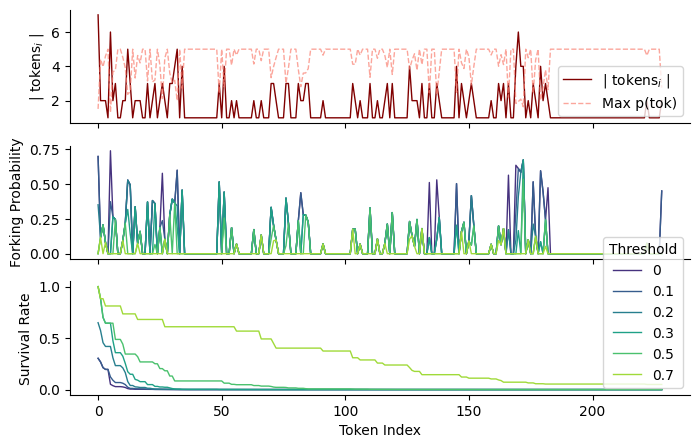

In [74]:
### token-level analysis

fig, axs = plt.subplots(3, 1, sharex=True, figsize=(8, 5))

cols = ['idx', 'tok']
drop_dup_toks = idx_tok_df[cols + ['tok_p']].drop_duplicates(cols)

num_tokens = drop_dup_toks.groupby('idx', observed=True).size().reset_index(name='n_tok')['n_tok']
axs[0].plot(num_tokens, label='| tokens$_i$ |', color='maroon', lw=1)
axs[0].set_ylabel('| tokens$_i$ |')

### tok_entropy = drop_dup_toks[['idx', 'tok_p']].groupby('idx').aggregate(get_entropy).reset_index()['tok_p']
### axs[0].plot(tok_entropy * num_tokens.max() / tok_entropy.max(), ls='--', lw=1, color='grey', label='Entropy')

# axs[2].set_ylabel('Entropy')



### TODO

# base_tokens = base_res[0]['choice']['logprobs']['tokens']
# greedy_y = [idx_tok_df[(idx_tok_df['idx'] == i) & (idx_tok_df['tok'] == base_tokens[i])]['tok_p'] 
#             for i in sorted(set(idx_tok_df['idx']))]
# axs[1].plot(greedy_y, color='teal')
# axs[1].set_ylabel('Greedy   p(tok)')

max_y = idx_tok_df[['idx', 'tok_p']].groupby('idx').aggregate('max').reset_index()['tok_p'] * 5
axs[0].plot(max_y, color='salmon', alpha=.7, ls='--', lw=1, label='Max p(tok)')

axs[0].legend()

# axs[0].set_ylabel('Max   p(tok)')


# axs[2].plot(drop_dup_toks[['idx', 'tok_p']].groupby('idx').aggregate(get_entropy).reset_index()['tok_p'])
# axs[2].set_ylabel('Entropy')



"""

tok_dist_df = get_forktok_ts(idx_tok_df, base_res)

axs[2].plot(tok_dist_df['idx'], tok_dist_df['d_l1'], color='magenta')
axs[2].set_ylabel('Expected L1 Dist.')

axs[3].plot(tok_dist_df['idx'], tok_dist_df['d_kl'], color='green')
axs[3].set_ylabel('Expected KL Div.')

"""




sns.lineplot(pd.concat(thresh_dfs), x='idx', y=dist_fn,   ax=axs[-2], lw=1,
             hue=thresh_col, palette=sns.color_palette('viridis', n_colors=len(dist_threshs)))

axs[1].legend().remove()


# axs[-2].set_ylabel('$p( \ d_{t, w} > \epsilon \ )$')
axs[1].set_ylabel('Forking Probability')

"""
dist_thresh = .3
dist_fn = 'd_l1'
thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
axs[-1].plot(thresh_df['idx'], thresh_df[dist_fn], color='indigo')
axs[-1].set_ylabel('$p( \ d_{L1} > \\text{threshold} \ )$')
# axs[3].set_ylabel(f'$p(  d(o_\{i, w\}, o_\{i, w^*\}) > {dist_thresh})$')

"""



sns.lineplot(pd.concat(survive_dfs), x='idx', y='survival',    ax=axs[-1], lw=1,
             hue=thresh_col, palette=sns.color_palette('viridis', n_colors=len(dist_threshs)))

sns.despine()

plt.ylabel('Survival Rate')

sns.despine(ax=axs[0])
sns.despine(ax=axs[1])
sns.despine(ax=axs[2])
axs[-1].set_xlabel('Token Index');

In [115]:
o

Object of 9 field(s):

 time        : [229 float32] 
 data        : [229 float32] 
 marg_lik    : -255.695 
 R2          : 0.985122 
 RMSE        : 0.0748467 
 sig2        : 0.0253227 
 trend       : [ 1 object with 20 fields] 
               ncp            : 4.1954 
               ncp_median     : 4 
               ncp_mode       : 4 
               ncp_pct90      : 6 
               ncp_pct10      : 3 
               ncpPr          : [7 float32] 
               cpOccPr        : [229 float32] 
               order          : [229 float32] 
               cp             : [6 float32] 
               cpPr           : [6 float32] 
               cpAbruptChange : [6 float32] 
               cpCI           : [6x2 float32] 
               Y              : [229 float32] 
               SD             : [229 float32] 
               CI             : [229x2 float32] 
               slp            : [229 float32] 
               slpSD          : [229 float32] 
               slpCI          : [2

  0%|          | 0/6 [00:00<?, ?it/s]

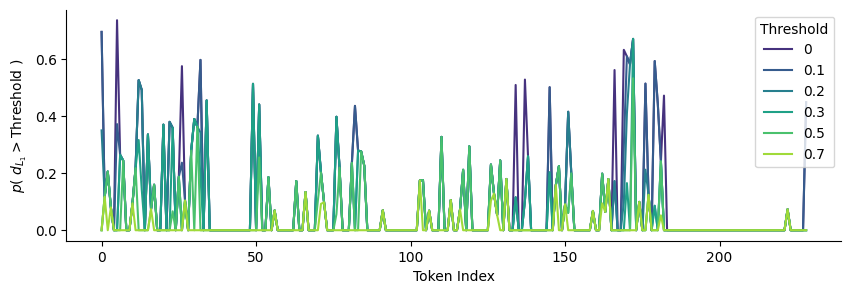

In [31]:
dist_fn = 'd_l1'
dist_threshs = [0, .1, .2, .3, .5, .7]

thresh_col = 'Threshold'
thresh_dfs = []

for dist_thresh in tqdm(dist_threshs):
    thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
    thresh_df[thresh_col] = str(dist_thresh)
    thresh_dfs.append(thresh_df)

sns.lineplot(pd.concat(thresh_dfs), x='idx', y=dist_fn, 
             hue=thresh_col, palette=sns.color_palette('viridis', n_colors=len(dist_threshs)))

sns.despine()

plt.ylabel('$p( \ d_{L_1} > \\text{Threshold} \ )$')
plt.xlabel('Token Index');
# plt.gca().get_legend().remove()

In [80]:
?idx_df.rename

Signature:
idx_df.rename(
    mapper: 'Renamer | None' = None,
    *,
    index: 'Renamer | None' = None,
    columns: 'Renamer | None' = None,
    axis: 'Axis | None' = None,
    copy: 'bool | None' = None,
    inplace: 'bool' = False,
    level: 'Level | None' = None,
    errors: 'IgnoreRaise' = 'ignore',
) -> 'DataFrame | None'
Docstring:
Rename columns or index labels.

Function / dict values must be unique (1-to-1). Labels not contained in
a dict / Series will be left as-is. Extra labels listed don't throw an
error.

See the :ref:`user guide <basics.rename>` for more.

Parameters
----------
mapper : dict-like or function
    Dict-like or function transformations to apply to
    that axis' values. Use either ``mapper`` and ``axis`` to
    specify the axis to target with ``mapper``, or ``index`` and
    ``columns``.
index : dict-like or function
    Alternative to specifying axis (``mapper, axis=0``
    is equivalent to ``index=mapper``).
columns : dict-like or function
    Alternat

In [54]:
thresh_df.head()

,idx,d_l1,d_l2,d_cos,d_kl,Threshold
0,0,0.000000,0.0,0.0,0.0,0.7
1,1,0.117370,0.0,0.0,0.0,0.7
2,2,0.000000,0.0,0.0,0.0,0.7
3,3,0.079927,0.0,0.0,0.0,0.7
4,4,0.000000,0.0,0.0,0.0,0.7


  0%|          | 0/6 [00:00<?, ?it/s]

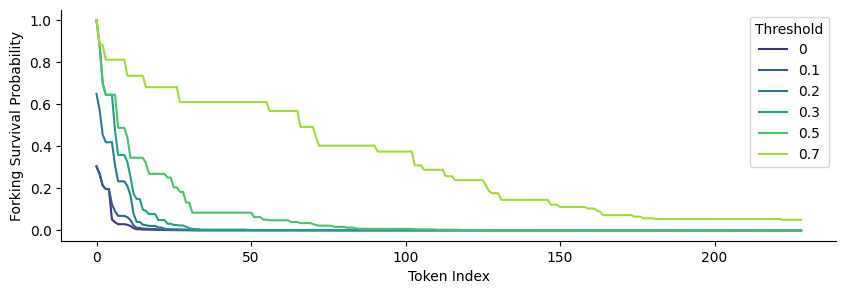

In [35]:
dist_fn = 'd_l1'
dist_threshs = [0, .1, .2, .3, .5, .7]

thresh_col = 'Threshold'
survive_dfs = []

for dist_thresh in tqdm(dist_threshs):
    thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
    thresh_df[thresh_col] = str(dist_thresh)

    # Cumulative product of   p(survival_t)
    #   https://stackoverflow.com/a/27912352/4248948
    thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])
    
    survive_dfs.append(thresh_df)

sns.lineplot(pd.concat(survive_dfs), x='idx', y='survival', 
             hue=thresh_col, palette=sns.color_palette('viridis', n_colors=len(dist_threshs)))

sns.despine()

plt.ylabel('Forking Survival Probability')
# plt.ylabel('$p( \ d(x_0, x_t) > \\text{Thresh.} \ )$ \n for at least 1 $t$')
plt.xlabel('Token Index');

# Analyze data for all tasks

In [79]:
ans_fn_bytask

{'CoinFlip': <function forking_paths.extract_ans.null_ans_fn(s)>,
 'LastLetter': <function forking_paths.extract_ans.last_letter_ans_fn(s)>,
 'AQuA': <function forking_paths.extract_ans.abcde_fn(s)>,
 'GSM8k': <function forking_paths.extract_ans.numeric_fn(s)>,
 'MMLU': <function forking_paths.extract_ans.abcd_fn(s)>,
 'HotpotQA': <function forking_paths.extract_ans.<lambda>(s)>,
 'StoryCloze_2Choice': <function forking_paths.extract_ans.numeric_fn(s)>}

In [1036]:
dist_fn = 'd_l2'
add_noise = .03
out_path = './out/gpt3.5-instruct-test_gemini_X'  ##gpt3.5-instruct-30s-300t'

# ------------------------------------------------

def rescale_alpha2(base=5, exp=1000):
    def f(y):
        y_range = y.max() - y.min()
        return base + (exp ** (1.0 - y_range))   # exp ^ (value in range [0, 1], inverse prop. to |y|)
    return f
    

alpha2_d = {'d_kl':  rescale_alpha2(base=20.0),    #20.0),
            'd_cos': rescale_alpha2(base=5.0),
            'd_l1':  rescale_alpha2(base=2.0),
            'd_l2':  rescale_alpha2(base=2.0)}


alpha2 = alpha2_d[dist_fn]

idx_dfs = defaultdict(dict)
idx_tok_dfs = defaultdict(dict)
rb_trends = defaultdict(dict)
cp_rows = []

# ------------------------------------------------


for task in tqdm(ans_fn_bytask.keys()):
    path = f'{out_path}/{task}'

    
    files = [f.split('.pk')[0] for f in os.listdir(path) if '.pk' in f]
    
    for qa_idx in tqdm(files):

        # ------------------------------------------------------------------------------
        # load data
        
        fname = f'{out_path}/{task}/{qa_idx}'

        try:
            base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
        except ValueError:
            base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
        base_tokens = base_res[0]['choice']['logprobs']['tokens']
        args_json = json.load(open(f'{fname}.json'))
        
        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])
        
        idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=6, other_tok=r'$\it{Other}$')  # ='$\\it{Other}$')
        
        idx_dfs[task][qa_idx] = idx_df
        idx_tok_dfs[task][qa_idx] = idx_tok_df
        # ------------------------------------------------------------------------------
        # run BEAST for CPD
        
        dist_df = get_dists(idx_df)
        dist_df = dist_df.sort_values(by='idx')
        
        y = dist_df[dist_fn].to_numpy()
        y = jitter_lim(y, add_noise)
        
        time  = dist_df['idx'].to_numpy()

        o = Rbeast.beast(
            y, time=time, season='none',
            tcp_minmax=[0, 6],  torder_minmax=[0, 1], # tseg_minlength=20,
            mcmc_chains=10,
            print_progress=False, print_options=False, quiet=True, 
            
            precPriorType='constant', precValue=20,  ##10,
            alpha1=.01,             # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
            alpha2=alpha2(y),       # min alpha2: MIN_ALPHA2_VALUE=.0001
        )
        # ------------------------------------------------------------------------------
        rb_trends[task][qa_idx] = o.trend
    
        ## cp_P = o.trend.cpPr.sum(0)
        num_cps_p10 = get_percentile_cp(o.trend.ncpPr, .1)
        
        if len(o.trend.cp.shape) > 1:
            all_cps = o.trend.cp[:, 0]    #all_cps = o.trend.cp[0, :]
            cpAbruptChange = o.trend[:, 0].cpAbruptChange
        else:
            cpAbruptChange = o.trend.cpAbruptChange
            all_cps = o.trend.cp

        # threshold_cps = all_cps[np.argwhere(abs(o.trend.cpAbruptChange) > .1)]
        # cps = [cp for cp in all_cps[:num_cps_p10] if cp in threshold_cps]
        
        for cp in all_cps:
            cp_rows.append({
                'task': task,
                'qa_idx': qa_idx,
                'toks': base_tokens,
                
                'cp_idxs': cp,
                'num_cps_p10': num_cps_p10,
                'expected_val': get_expected_ncp(o.trend.ncpPr),
            })

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [373]:
thresh_df.head()

,idx,d_l1,d_l2,d_cos,d_kl,$\epsilon$ Threshold,survival
0,0,0.086548,0.0,0.0,0.0,0.7,0.913452
1,1,0.000000,0.0,0.0,0.0,0.7,0.913452
2,2,0.000000,0.0,0.0,0.0,0.7,0.913452
3,3,0.000000,0.0,0.0,0.0,0.7,0.913452
4,4,0.000000,0.0,0.0,0.0,0.7,0.913452


In [352]:
# Join task result data into a big df
cp_df = pd.DataFrame(cp_rows)
ncp_df = cp_df.drop_duplicates(['task', 'qa_idx'])
# ncp_df = cp_df.value_counts(subset=['task', 'qa_idx']).reset_index()

task_coords = {
    'CoinFlip': (0, 0), 
    'LastLetter': (0, 1), 
    'AQuA': (1, 0), 
    'GSM8k': (1, 1), 
    'MMLU': (2, 0), 
    'HotpotQA': (2, 1), 
    'StoryCloze_2Choice': (3, 0),
}

In [838]:
cp_ile_df__l1 = cp_ile_df.copy()

In [1068]:
rows = []

for task in rb_trends:
    for qa_idx in rb_trends[task]:
        trend = rb_trends[task][qa_idx]
        for quantile in [.01, .1, .3, .5]:
            # est_n_cps = get_percentile_cp(trend.ncpPr, quantile)
            est_n_cps = get_percentile_cp_interp(trend.ncpPr, percentile=quantile, interp=20)
            rows.append({'task': task, 'qa_idx': qa_idx, 'quantile': quantile, 'est_m': est_n_cps})

cp_ile_df = pd.DataFrame(rows)

# n_bins = 20
# t_bins = np.arange(0, 1, (1/n_bins)).tolist() + [1]
# cp_ile_df['round_m'] = np.digitize(cp_ile_df['est_m'], bins=t_bins)

In [1079]:
cp_ile_df_ = cp_ile_df[cp_ile_df['quantile'] == .01].copy()

cp_ile_df_['has_m'] = (cp_ile_df_['est_m'] >= 1.0)

cp_ile_df_[['task', 'has_m']].groupby('task').aggregate('mean')

,has_m
task,
AQuA,0.300000
CoinFlip,0.000000
GSM8k,0.266667
HotpotQA,0.320755
LastLetter,0.633333
MMLU,0.433333
StoryCloze_2Choice,0.066667


In [1495]:
end_survive_df[end_survive_df[thresh_col] == '0.6'][['task', 'survival']].groupby('task').aggregate('mean')

,survival
task,
AQuA,0.332128
CoinFlip,0.201055
GSM8k,0.176050
HotpotQA,0.256786
LastLetter,0.304228
MMLU,0.134491
StoryCloze_2Choice,0.262965


In [1081]:
### L1 distance
end_survive_df[end_survive_df[thresh_col] == '0.6'][['task', 'survival']].groupby('task').aggregate('mean')

,survival
task,
AQuA,0.047202
CoinFlip,0.188245
GSM8k,0.061945
HotpotQA,0.050104
LastLetter,0.070967
MMLU,0.026202
StoryCloze_2Choice,0.119949


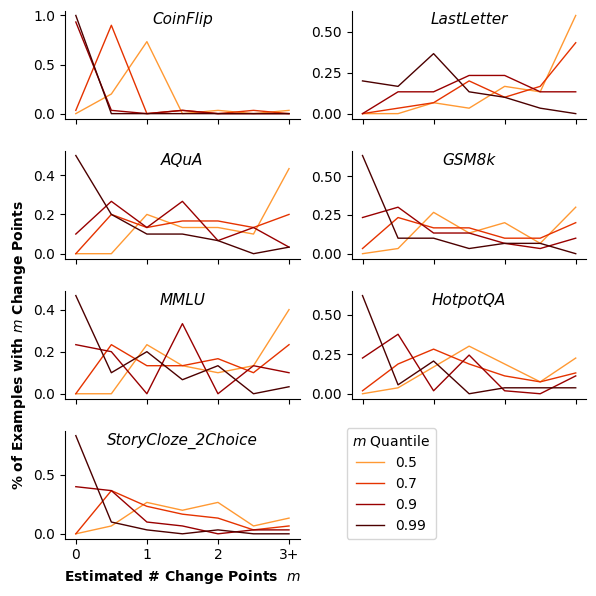

In [1500]:
fig, axs = plt.subplots(4, 2, figsize=(6, 6))

n_bin_factor = 2
m_limit = 3

for task in set(ncp_df['task']):
    ax = axs[task_coords[task]]
    
    # ncp_ = ncp_df[ncp_df['task'] == task]

    # cps_p10 = ncp_['num_cps_p10']
    # # sns.kdeplot(x=ncp_['num_cps_p10'], color='green')
    # weights = np.ones_like(cps_p10) / len(cps_p10)
    # ax.hist(cps_p10, weights=weights, bins=5, range=(0, 4))


    ile_df = cp_ile_df[cp_ile_df['task'] == task]

    max_m = int(np.ceil(max(ile_df['est_m'])))
    n_bins = max_m * n_bin_factor

    rows = []
    for quantile in set(ile_df['quantile']):
        q_df = ile_df[ile_df['quantile'] == quantile]
        
        hist, m_vals = np.histogram(q_df['est_m'].values, bins=n_bins, range=(0, max_m))
        hist, m_vals = np.histogram(q_df['est_m'].values, bins=n_bins+1, range=(0, max_m + (m_vals[1] - m_vals[0])))
        
        h_Z = sum(hist)
        for h, m in zip(hist, m_vals): 
            rows.append({'quantile': 1 - quantile, 'hist': h / h_Z, 'm': m if m < m_limit else m_limit})

    q_hist_df = pd.DataFrame(rows)
    q_hist_df = q_hist_df.groupby(['quantile', 'm']).aggregate('sum').reset_index()

    sns.lineplot(
        q_hist_df,
        x='m',
        y='hist',
        ax=ax,
        hue='quantile',
        lw=1, alpha=1,
        palette=sns.color_palette('gist_heat_r', n_colors=len(set(ile_df['quantile'])))
        # errorbar=('pi', 100)
    )
    
    ax.set_xticks(range(m_limit+1))
    ax.set_xticklabels(list(range(m_limit)) + [f'{m_limit}+'])
    ax.set_title(task, fontsize=11, style='italic', y=1, pad=-10)
    sns.despine(ax=ax)
    
    ax.set_xlabel(None)
    ax.set_ylabel(None)

    if 'Cloze' not in task:
        ax.get_legend().remove()
        ax.set_xticklabels([])
        ax.set_xticklabels([])

# plt.setp(axes, xticks=[0.1, 0.5, 0.9], xticklabels=['a', 'b', 'c'],
axs[3, 1].axis('off')
axs[3, 0].set_xlabel('Estimated # Change Points  $m$', fontweight='bold')


axs[(2, 0)].set_ylabel('% of Examples with $m$ Change Points', fontweight='bold')

plt.tight_layout(pad=0.85)
axs[3,0].legend(title=r'$m$ Quantile', loc=(1.2, 0));

plt.savefig(f'out/cp-all-m.pdf', bbox_inches='tight')
plt.show()

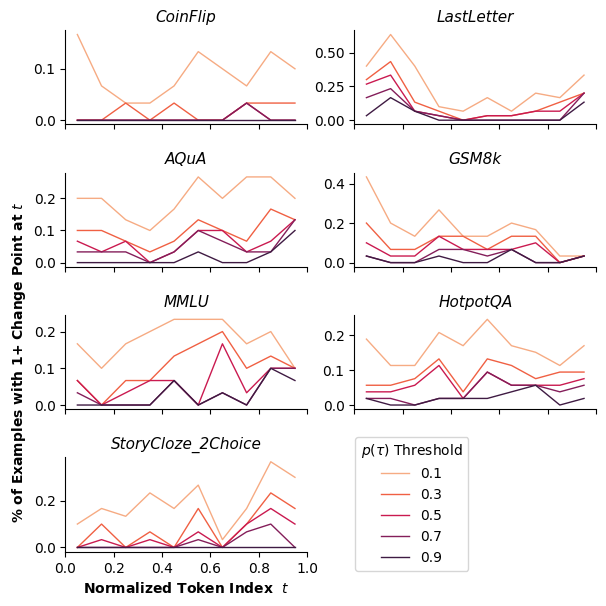

In [1501]:
# plt.rcParams['figure.figsize'] = (4, 2)

n_buckets = 10  #20
p_tau_threshs = [.1, .3, .5, .7, .9]

seq_end_y = -.05  #0.0

fig, axs = plt.subplots(4, 2, figsize=(6, 6))

rows = []

for task, task_trends in rb_trends.items():
    ax = axs[task_coords[task]]

    p_tau_df = pd.DataFrame(
        [{'idx': t / trend.cpOccPr.shape[0],
          'cp': int(y_t > p_tau_thresh),
          'qa_idx': qa_idx,
          'p_tau_thresh': p_tau_thresh,
         }    
          for qa_idx, trend in task_trends.items()
          for t, y_t in enumerate(trend.cpOccPr)  #   np.concatenate([trend.cpOccPr, seq_end_y * np.ones(max_y_len - trend.cpOccPr.shape[0])]))
          for p_tau_thresh in p_tau_threshs
      ])

    # Bucket times and take means 
    #   Note: there might be a better way to do this but I need to move fast right now
    quantized_dfs = []
    
    for tb in range(n_buckets):
        t1 = tb / n_buckets
        t2 = t1 + (1 / n_buckets)
        
        df_b = p_tau_df[(p_tau_df['idx'] >= t1) & (p_tau_df['idx'] < t2)].copy()
        df_b['idx'] = t1 + (.5 / n_buckets)
        quant = df_b.groupby(['idx', 'qa_idx', 'p_tau_thresh']).aggregate('any').reset_index()
        quantized_dfs.append(quant)
    
    quantized_df = pd.concat(quantized_dfs).reset_index(drop=True)
    bucket_means = quantized_df[['idx', 'cp', 'p_tau_thresh']].groupby(['idx', 'p_tau_thresh']).aggregate('mean').reset_index()
    # bucket_means = quantized_df[['idx', 'cp', 'p_tau_thresh']].groupby(['idx', 'p_tau_thresh']).aggregate('sum').reset_index()
    bucket_means = bucket_means.rename({'p_tau_thresh': 'Threshold'}, axis=1)
    
    sns.lineplot(
        bucket_means,
        x='idx',
        y='cp',
        ax=ax,
        hue='Threshold',
        lw=1, alpha=1,
        palette=sns.color_palette('rocket_r', n_colors=len(p_tau_threshs))
        # errorbar=('pi', 100)
    )
    
    ax.set_xlim(0, 1)
    # ax.set_ylim(seq_end_y, 1.0)

    ax.set_title(task, fontsize=11, style='italic')
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    if 'Cloze' not in task:
        ax.get_legend().remove()
        ax.set_xticklabels([])
        ax.set_xticklabels([])
    # else:

    sns.despine(ax=ax)
    
# axs[(2, 0)].set_ylabel('avg p(CP_t | x) for each t')
# axs[(3, 1)].set_xlabel('Maximum value of abrupt change in CPD$(y)$')
# axs[(0,0)].set_title('Distribution of Maximum abrupt change in CPD$(y)$')


axs[3, 1].axis('off')
axs[3, 0].set_xlabel(r'Normalized Token Index  $t$', fontweight='bold')
# axs[2, 0].set_ylabel(r'Fraction with 1+ Change Point at $t$', fontweight='bold')
axs[2, 0].set_ylabel(r'% of Examples with 1+ Change Point at $t$', fontweight='bold')


# print('Distribution of change effect size. Important for determining if a change was big enough.')
plt.tight_layout(pad=.5);

axs[3,0].legend(title=r'$p(\tau)$ Threshold', loc=(1.2, -.2));

plt.savefig(f'out/cp-all-tau.pdf', bbox_inches='tight')
plt.show()

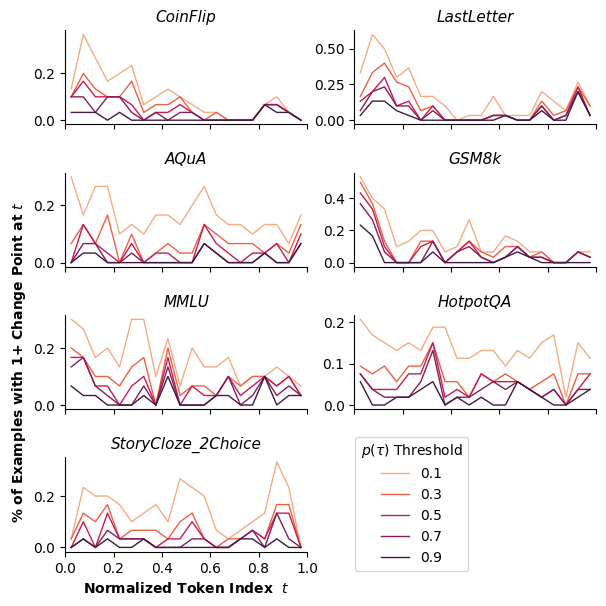

In [647]:

plt.show()

#### F IT WE'LL DO IT LIVE

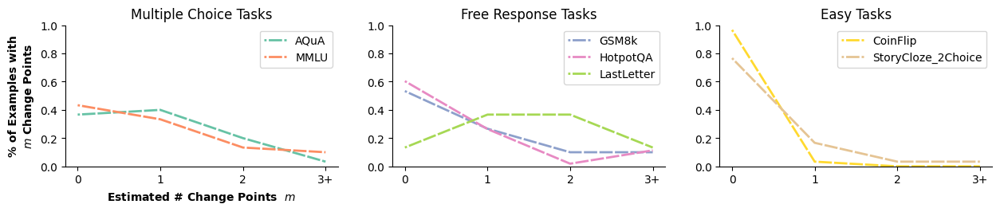

In [1540]:

palette = 'Set2'

n_bin_factor = 1  #2
m_limit = 3

q_hist_dfs = []

for task in set(ncp_df['task']):
    
    ile_df = cp_ile_df[cp_ile_df['task'] == task]

    max_m = int(np.ceil(max(ile_df['est_m'])))
    n_bins = max_m * n_bin_factor

    rows = []
    for quantile in set(ile_df['quantile']):
        q_df = ile_df[ile_df['quantile'] == quantile]
        
        hist, m_vals = np.histogram(q_df['est_m'].values, bins=n_bins, range=(0, max_m))
        hist, m_vals = np.histogram(q_df['est_m'].values, bins=n_bins+1, range=(0, max_m + (m_vals[1] - m_vals[0])))
        
        h_Z = sum(hist)
        for h, m in zip(hist, m_vals): 
            rows.append({'quantile': 1 - quantile, 'hist': h / h_Z, 'm': m if m < m_limit else m_limit})

    q_hist_df = pd.DataFrame(rows)
    q_hist_df = q_hist_df.groupby(['quantile', 'm']).aggregate('sum').reset_index()

    q_hist_df['task'] = task
    q_hist_dfs.append(q_hist_df)



q_hist_df_ = pd.concat(q_hist_dfs)
# q_hist_df_ = q_hist_df_[q_hist_df_['quantile'] == .9]

# tasks1 = 

# axs = plt.subplots(1, 2, figsize=(6,6))

# sns.lineplot(
#     q_hist_df_,
#     x='m',
#     y='hist',
#     hue='task',
#     lw=1, alpha=1,
#     # palette=sns.color_palette('gist_heat_r', n_colors=len(set(ile_df['quantile'])))
#     # errorbar=('pi', 100)
# )
# plt.show()
# sns.despine(ax=ax)

# ax.set_xlabel(None)
# ax.set_ylabel(None)


# ax.set_xticks(range(m_limit+1))
# ax.set_xticklabels(list(range(m_limit)) + [f'{m_limit}+'])
# ax.set_title(task, fontsize=11, style='italic', y=1, pad=-10)
# ax.get_legend().remove()

# # plt.setp(axes, xticks=[0.1, 0.5, 0.9], xticklabels=['a', 'b', 'c'],
# axs[3, 1].axis('off')
# axs[3, 0].set_xlabel('Estimated # Change Points  $m$', fontweight='bold')


# axs[(2, 0)].set_ylabel('% of Examples with $m$ Change Points', fontweight='bold')

# plt.tight_layout(pad=0.85)
# axs[3,0].legend(title=r'$m$ Quantile', loc=(1.2, 0));

# plt.savefig(f'out/cp-all-m.pdf', bbox_inches='tight')



task_groups = [['AQuA', 'MMLU'], ['LastLetter', 'GSM8k', 'HotpotQA'], ['CoinFlip', 'StoryCloze_2Choice']]
fig, axs = plt.subplots(1, len(task_groups), figsize=(15, 2.3))

q_hist_df_ = q_hist_df_[q_hist_df_['quantile'] == .9]

pi = 0 

for ti, (task_group, ax) in enumerate(zip(task_groups, axs)):
    df_ = q_hist_df_[q_hist_df_['task'].isin(task_group)].copy()

    df_ = df_.sort_values(by='task').reset_index(drop=True)

    # df_['task'] = df_['task'].rename({'StoryClose_2Choice', 'StoryCloze'})

    pn = len(set(df_['task']))
    
    sns.lineplot(
        df_,
        x='m',
        y='hist',
        ax=ax,
        hue='task',
        lw=2, alpha=1,
        palette=sns.color_palette(palette, n_colors=7)[pi:pi+pn],
        
        ls=(5, (6, 1)),
        # palette=palette,        
        # palette=sns.color_palette('rocket_r', n_colors=len(p_tau_threshs))
        # errorbar=('pi', 100)
    )
    pi += pn

    
    ax.set_ylim(0, 1.0)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.set_title(['Multiple Choice Tasks', 'Free Response Tasks', 'Easy Tasks'][ti])

    ax.set_xticks(range(m_limit+1))
    ax.set_xticklabels(list(range(m_limit)) + [f'{m_limit}+'])

    # if ti > 0:
    #     ax.set_yticklabels([])
        
    ax.legend(loc='upper right')
    # ax.set_title(task, fontsize=11, style='italic', y=1, pad=-10)
    # ax.get_legend().remove()


    
    sns.despine(ax=ax)



# axs[3, 1].axis('off')
axs[0].set_xlabel('Estimated # Change Points  $m$', fontweight='bold')
axs[0].set_ylabel('% of Examples with\n$m$ Change Points', fontweight='bold')


plt.savefig(f'out/cp-mini-m.pdf', bbox_inches='tight')
plt.show()

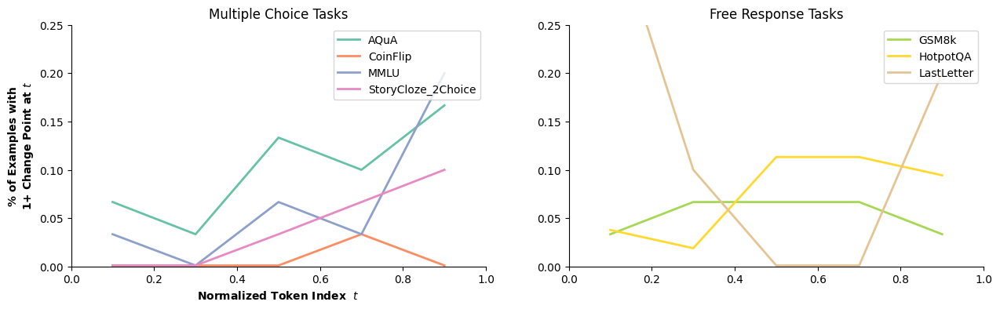

In [1545]:
# plt.rcParams['figure.figsize'] = (4, 2)

palette = 'Set2'
n_buckets = 5
p_tau_threshs = [.1, .3, .5, .7, .9]

seq_end_y = -.05  #0.0

all_bucket_means = []

for task, task_trends in rb_trends.items():
    # ax = axs[task_coords[task]]

    p_tau_df = pd.DataFrame(
        [{'idx': t / trend.cpOccPr.shape[0],
          'cp': int(y_t > p_tau_thresh),
          'qa_idx': qa_idx,
          'p_tau_thresh': p_tau_thresh,
         }    
          for qa_idx, trend in task_trends.items()
          for t, y_t in enumerate(trend.cpOccPr)  #   np.concatenate([trend.cpOccPr, seq_end_y * np.ones(max_y_len - trend.cpOccPr.shape[0])]))
          for p_tau_thresh in p_tau_threshs
      ])

    # Bucket times and take means 
    #   Note: there might be a better way to do this but I need to move fast right now
    quantized_dfs = []
    
    for tb in range(n_buckets):
        t1 = tb / n_buckets
        t2 = t1 + (1 / n_buckets)
        
        df_b = p_tau_df[(p_tau_df['idx'] >= t1) & (p_tau_df['idx'] < t2)].copy()
        df_b['idx'] = t1 + (.5 / n_buckets)
        quant = df_b.groupby(['idx', 'qa_idx', 'p_tau_thresh']).aggregate('any').reset_index()
        quantized_dfs.append(quant)
    
    quantized_df = pd.concat(quantized_dfs).reset_index(drop=True)
    bucket_means = quantized_df[['idx', 'cp', 'p_tau_thresh']].groupby(['idx', 'p_tau_thresh']).aggregate('mean').reset_index()
    # bucket_means = quantized_df[['idx', 'cp', 'p_tau_thresh']].groupby(['idx', 'p_tau_thresh']).aggregate('sum').reset_index()
    # bucket_means = bucket_means.rename({'p_tau_thresh': 'Threshold'}, axis=1)

    bucket_means['task'] = task

    all_bucket_means.append(bucket_means)


abm_df = pd.concat(all_bucket_means)

abm_df_ = abm_df[abm_df['p_tau_thresh'] == .5]

"""
sns.lineplot(
    abm_df_,
    x='idx',
    y='cp',
    # ax=ax,
    hue='task',
    lw=1, alpha=1,
    # palette=sns.color_palette('rocket_r', n_colors=len(p_tau_threshs))
    # errorbar=('pi', 100)
)
plt.show()
"""
# ax.set_xlim(0, 1)
# # ax.set_ylim(seq_end_y, 1.0)

# ax.set_title(task, fontsize=11, style='italic')
# ax.set_xlabel(None)
# ax.set_ylabel(None)
# if 'Cloze' not in task:
#     ax.get_legend().remove()
#     ax.set_xticklabels([])
#     ax.set_xticklabels([])
# # else:

# sns.despine(ax=ax)

# axs[(2, 0)].set_ylabel('avg p(CP_t | x) for each t')
# axs[(3, 1)].set_xlabel('Maximum value of abrupt change in CPD$(y)$')
# axs[(0,0)].set_title('Distribution of Maximum abrupt change in CPD$(y)$')


# axs[3, 1].axis('off')
# axs[3, 0].set_xlabel(r'Normalized Token Index  $t$', fontweight='bold')
# # axs[2, 0].set_ylabel(r'Fraction with 1+ Change Point at $t$', fontweight='bold')
# axs[2, 0].set_ylabel(r'% of Examples with 1+ Change Point at $t$', fontweight='bold')


# # print('Distribution of change effect size. Important for determining if a change was big enough.')
# plt.tight_layout(pad=.5);

# axs[3,0].legend(title=r'$p(\tau)$ Threshold', loc=(1.2, -.2));

# plt.savefig(f'out/cp-all-tau.pdf', bbox_inches='tight')



# for task_group in [['CoinFlip', 'StoryCloze_2Choice'], ['MMLU', 'AQuA', 'HotpotQA'], ['LastLetter', 'GSM8k']]:
# for task_group in [['CoinFlip', 'LastLetter'], ['AQuA', 'GSM8k'] ,['MMLU', 'HotpotQA'], ['StoryCloze_2Choice']]:

# task_groups = [['AQuA', 'MMLU'], ['LastLetter', 'GSM8k', 'HotpotQA'], ['CoinFlip', 'StoryCloze_2Choice']]
task_groups = [['AQuA', 'MMLU', 'CoinFlip', 'StoryCloze_2Choice'], ['LastLetter', 'GSM8k', 'HotpotQA']]
fig, axs = plt.subplots(1, len(task_groups), figsize=(15, 4))

pi = 0

for ti, (task_group, ax) in enumerate(zip(task_groups, axs)):
    abm_df_ = abm_df[abm_df['p_tau_thresh'] == .7].copy()
    abm_df_ = abm_df_[abm_df_['task'].isin(task_group)]
    abm_df_ = abm_df_.sort_values(by='task').reset_index(drop=True)

    abm_df_.loc[abm_df_['cp'] < .001, 'cp'] = .001
    
    pn = len(set(abm_df_['task']))
    sns.lineplot(
        abm_df_,
        x='idx',
        y='cp',
        ax=ax,
        hue='task',
        lw=2, #ls=(5, (6, 1)),
        # palette=palette,
        palette=sns.color_palette(palette, n_colors=7)[pi:pi+pn]
        # errorbar=('pi', 100)
    )
    pi += pn
    
    ax.set_ylim(0, 1)
    ax.set_ylim(0, .25)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    # ax.set_title(['Multiple Choice Tasks', 'Open Text Response', 'Easy Tasks'][ti])
    sns.despine(ax=ax)

    ax.set_xticks([0, .2, .4, .6, .8, 1.0])

    # if ti > 0:
    #     ax.set_yticklabels([])
        
    ax.legend(loc='upper right')
    ax.set_title(['Multiple Choice Tasks', 'Free Response Tasks', 'Easy Tasks'][ti])
    


axs[0].set_xlabel(r'Normalized Token Index  $t$', fontweight='bold')
axs[0].set_ylabel('% of Examples with\n1+ Change Point at $t$', fontweight='bold')



plt.savefig(f'out/cp-mini-tau.pdf', bbox_inches='tight')

plt.show()


### survival 

In [470]:
task_base_res = defaultdict(dict)

for task in tqdm(idx_tok_dfs.keys()):
    # def single_task(qa_idx):
    for qa_idx in tqdm(idx_tok_dfs[task].keys()):
        fname = f'{out_path}/{task}/{qa_idx}'
    
        try:
            base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
        except ValueError:
            base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
            
        task_base_res[task][qa_idx] = base_res
    
    gc.collect()

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:
# end_survive_df[end_survive_df[thresh_col] == '0.6'][['task', 'survival']].groupby('task').aggregate('mean')

In [1154]:
# Survival Analysis -- full dataset

dist_fn = 'd_l2'
dist_threshs = [.5, .6, .7]   #[.2, .4, .6, .8, .9, 1.0] #[.1, .3, .5, .7, .8, .9, 1.1]
thresh_col = r'$\epsilon$ Threshold'


task_survive_dfs = []


for task in tqdm(idx_tok_dfs.keys()):
    # def single_task(qa_idx):
    for qa_idx in tqdm(idx_tok_dfs[task].keys()):
        base_res = task_base_res[task][qa_idx]
        idx_tok_df = idx_tok_dfs[task][qa_idx]
        
        # ------------------------------------------------------------------------------
      
        # survive_dfs = []
        for dist_thresh in dist_threshs:
            thresh_df = get_forktok_ts(idx_tok_df, base_res, sig_dist_thresh=dist_thresh)
            
            thresh_df['task'] = task
            thresh_df['qa_id'] = qa_idx
            thresh_df[thresh_col] = str(dist_thresh)
        
            # Cumulative product of   p(survival_t)
            #   https://stackoverflow.com/a/27912352/4248948
            thresh_df['survival'] = np.multiply.accumulate(1 - thresh_df[dist_fn])
            
            task_survive_dfs.append(thresh_df)


task_survive_df = pd.concat(task_survive_dfs).reset_index(drop=True)


        # return survive_dfs

    # from multiprocessing import Pool
    # args_ls = list(idx_tok_dfs[task].keys())
    # with Pool(14) as pool:
    #     task_survive_dfs += list(tqdm(pool.imap(single_task, args_ls), total=len(args_ls)))

# task_survive_df = pd.concat([df for dfs in task_survive_dfs for df in dfs]).reset_index(drop=True)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

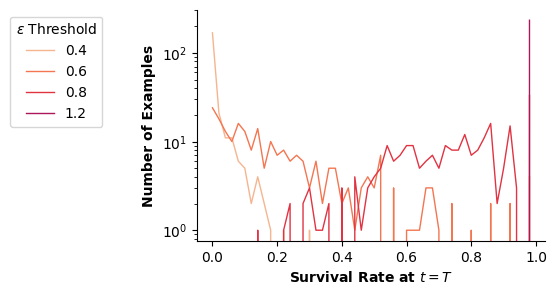

In [1499]:
n_bins = 50

# for task in idx_tok_dfs.keys():

max_idxs = task_survive_df[['idx', 'task', 'qa_id']].groupby(['task', 'qa_id']).aggregate('max').reset_index()
max_idxs = max_idxs.rename({'idx': 'max_idx'}, axis=1)

task_survive_df_ = task_survive_df.merge(max_idxs, how='left', on=['task', 'qa_id'])
task_survive_df_ = task_survive_df_[~task_survive_df_[thresh_col].isin(['0.2'])]
# task_survive_df_ = task_survive_df_[~task_survive_df_[thresh_col].isin(['1.1', '0.6'])]
# task_survive_df_ = task_survive_df[task_survive_df['task'] == task].merge(max_idxs, how='left', on=['task', 'qa_id'])

end_survive_df = task_survive_df_[task_survive_df_['idx'] == task_survive_df_['max_idx']]
end_survive_df[['task', 'qa_id', thresh_col, 'survival']]


rows = []
for thresh in sorted(set(end_survive_df[thresh_col])):
    thresh_df = end_survive_df[end_survive_df[thresh_col] == thresh]
    
    hist, survive_vals = np.histogram(thresh_df['survival'].values, bins=n_bins, range=(0, 1))
    h_Z = 1  #sum(hist)
    
    for h, S in zip(hist, survive_vals): 
        rows.append({thresh_col: thresh, 'hist': h / h_Z, 'S(T)': S})

survive_agg = pd.DataFrame(rows)

"""
def expand_hist(values, n_bins, range_):
    hist, m_vals = np.histogram(values, bins=n_bins, range=range_)
    
    new_range = (range_[0], range_[1] + (m_vals[1] - m_vals[0]))
    hist, m_vals = np.histogram(values, bins=n_bins+1, range=new_range)
    
    return hist, m_vals
"""




plt.rcParams['figure.figsize'] = (4.5, 3)

### Add a small amount since we're in log scale
##survive_agg['S(T)'] = survive_agg['S(T)'].apply(lambda x: x + 1e-2 if x == 0 else x)

sns.lineplot(
    survive_agg[~survive_agg[thresh_col].isin(['0.5', '0.7'])],
    x='S(T)',
    y='hist',
    hue=thresh_col,
    lw=1, alpha=1,
    palette=sns.color_palette('rocket_r', n_colors=len(set(end_survive_df[thresh_col]))),
    # errorbar=('pi', 100)
    # figsize=(4, 4)
)

plt.yscale('log')
# plt.xscale('log')
plt.xlabel('Survival Rate at $t=T$', fontweight='bold')
plt.ylabel('Number of Examples', fontweight='bold')
# plt.title(task)

sns.despine()
plt.legend( title=thresh_col, loc='upper right', bbox_to_anchor=[-0.25, 1.0])    #bbox_to_anchor=[1.28, .9]

plt.savefig(f'out/survival-all.pdf', bbox_inches='tight')
plt.show()

In [1186]:
end_survive_df[end_survive_df[thresh_col] == '0.6'][['task', 'survival']].groupby('task').aggregate('mean')

,survival
task,
AQuA,0.332128
CoinFlip,0.201055
GSM8k,0.176050
HotpotQA,0.256786
LastLetter,0.304228
MMLU,0.134491
StoryCloze_2Choice,0.262965


<Axes: xlabel='prob_1cp', ylabel='survival'>

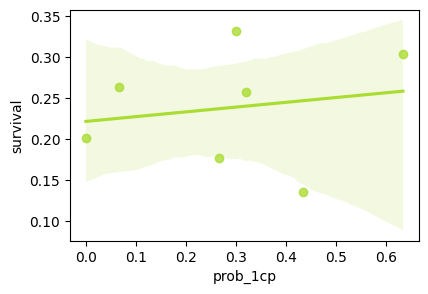

In [1197]:
df_data = [
    ['AQuA',	0.332128, 0.300000],
    ['CoinFlip',	0.201055, 0.000000],
    ['GSM8k',	0.176050, 0.266667],
    ['HotpotQA',	0.256786, 0.320755],
    ['LastLetter',	0.304228, 0.633333],
    ['MMLU',	0.134491, 0.433333],
    ['StoryCloze_2Choice',	0.262965, 0.066667],
]


sns.regplot(
    pd.DataFrame(df_data, columns=['task', 'survival', 'prob_1cp']),
    x='prob_1cp',
    y='survival',
)
# plt.plot([.1, .35], [.1, .35], ls='--', color='grey')

# plt.xlim(0, .6)

0.5575418449275927

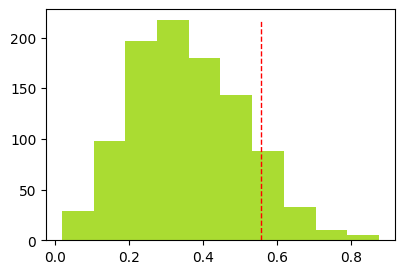

In [1185]:
### Null distribution for L2 dist between 2 uniform length-4 vectors that sum to 1
vector_size = 4
n_samp = 1000


rvv1 = np.random.uniform(0, 1, size=(n_samp, vector_size))
rvv1 /= rvv1.sum(axis=1)[..., None]

rvv2 = np.random.uniform(0, 1, size=(n_samp, vector_size))
rvv2 /= rvv2.sum(axis=1)[..., None]

bins, _, _ = plt.hist(lp_dist_mat(rvv1, rvv2))

pt_est = np.quantile(lp_dist_mat(rvv1, rvv2), .9)  #np.median(lp_dist_mat(rvv1, rvv2))
plt.vlines(pt_est, 0, max(bins), ls='--', lw=1, color='red')

pt_est

In [ ]:
n_bins = 50

# task = 'MMLU'

for task in 'TODO'
    
    
    max_idxs = task_survive_df[['idx', 'task', 'qa_id']].groupby(['task', 'qa_id']).aggregate('max').reset_index()
    max_idxs = max_idxs.rename({'idx': 'max_idx'}, axis=1)
    
    task_survive_df_ = task_survive_df[task_survive_df['task'] == task].merge(max_idxs, how='left', on=['task', 'qa_id'])
    
    end_survive_df = task_survive_df_[task_survive_df_['idx'] == task_survive_df_['max_idx']]
    end_survive_df[['task', 'qa_id', thresh_col, 'survival']]
    
    
    rows = []
    for thresh in sorted(set(end_survive_df[thresh_col])):
        thresh_df = end_survive_df[end_survive_df[thresh_col] == thresh]
        
        hist, survive_vals = np.histogram(thresh_df['survival'].values, bins=n_bins, range=(0, 1))
        h_Z = 1   #sum(hist)
        
        for h, S in zip(hist, survive_vals): 
            rows.append({'thresh': thresh, 'hist': h / h_Z, 'S(T)': S})
    
    survive_agg = pd.DataFrame(rows)
    
    
    survive_agg
    
    
    plt.rcParams['figure.figsize'] = (6, 4)
    
    survive_agg['S(T)'] = survive_agg['S(T)'].apply(lambda x: x + 1e-2 if x == 0 else x)
    
    sns.lineplot(
        survive_agg,
        x='S(T)',
        y='hist',
        hue='thresh',
        lw=1, alpha=1,
        palette=sns.color_palette('rocket_r', n_colors=len(set(end_survive_df[thresh_col]))),
        # errorbar=('pi', 100)
        # figsize=(4, 4)
    )
    
    plt.yscale('log')
    plt.xscale('log')

In [93]:
[trend.cpOccPr.shape for trend in task_trends.values()]

[(70,), (56,), (60,), (54,), (57,), (69,), (61,), (82,), (87,), (66,)]

In [106]:
pd.DataFrame([{'cp_pr': np.concatenate([trend.cpOccPr, np.zeros(max_y_len - trend.cpOccPr.shape[0])]),
               'qa_idx': qa_idx}    for qa_idx, trend in task_trends.items()])

(87,)

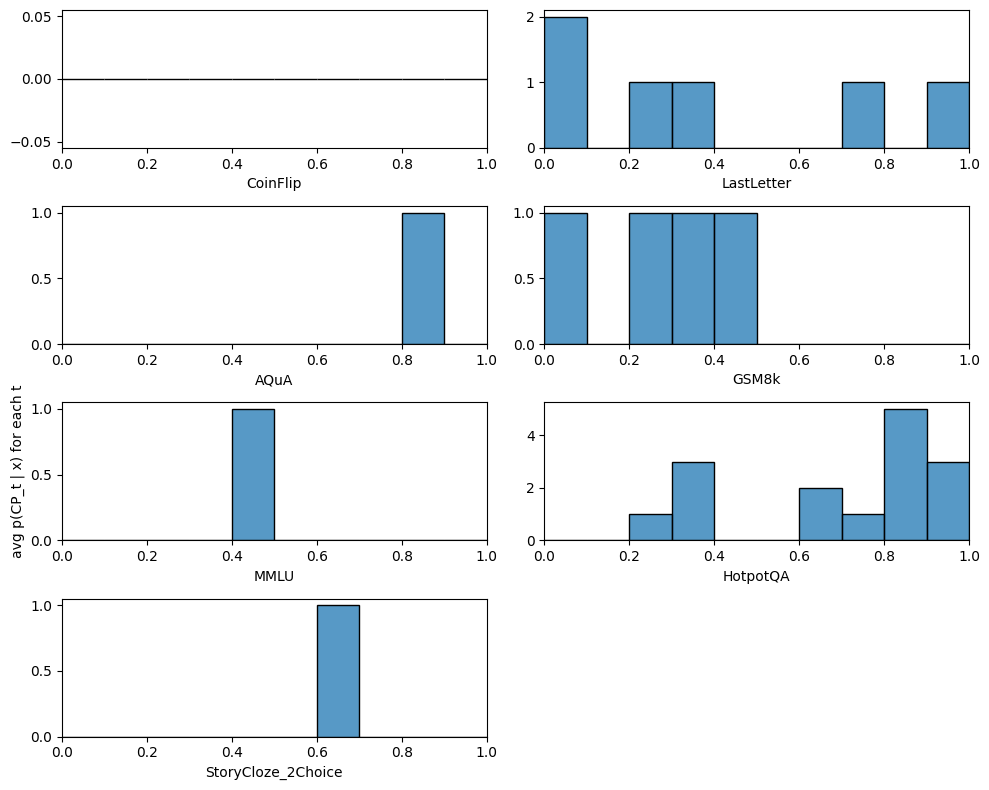

In [21]:
# plt.rcParams['figure.figsize'] = (4, 2)

n_bins = 10

seq_end_y = -.05  #0.0

fig, axs = plt.subplots(4, 2, figsize=(10, 8))

rows = []
for task, task_trends in rb_trends.items():
    ax = axs[task_coords[task]]

    max_y_len = max([trend.cpOccPr.shape[0] for trend in task_trends.values()])
    # achanges = np.stack([ np.concatenate([trend.cpOccPr, np.zeros(max_y_len - trend.cpOccPr.shape[0])])
    #                       for trend in task_trends.values()])

    dff = pd.DataFrame([{'idx': t / trend.cpOccPr.shape[0],
                       'cp_pr': y_t,
                       'qa_idx': qa_idx}    
            for qa_idx, trend in task_trends.items()
            for t, y_t in enumerate(   np.concatenate([trend.cpOccPr, seq_end_y * np.ones(max_y_len - trend.cpOccPr.shape[0])]))
          ])
    
    sns.histplot(
        dff[dff['cp_pr'] > .5],
        x='idx',
        ax=ax,
        bins=10,
        binrange=(0, 1),
        # hue='qa_idx',
        # lw=1, alpha=1
        # errorbar=('pi', 100)
    )

    ax.set_xlim(0, 1)
    ax.set_xlabel(task)
    ax.set_ylabel(None)
    
axs[(2, 0)].set_ylabel('avg p(CP_t | x) for each t')

axs[(3, 1)].set_xticks([])
axs[(3, 1)].set_yticks([])
sns.despine(ax=axs[(3, 1)], left=True, bottom=True)
# axs[(3, 1)].set_xlabel('Maximum value of abrupt change in CPD$(y)$')
# axs[(0,0)].set_title('Distribution of Maximum abrupt change in CPD$(y)$')


# print('Distribution of change effect size. Important for determining if a change was big enough.')
plt.tight_layout();
# plt.show()

In [37]:
# def running_avg_window(x, window_size=10):
#     return np.concatenate([
#         np.zeros(window_size - 1),
#         np.convolve(x, np.ones(window_size) / window_size, mode='valid')
#     ])

def running_fn_window(x, fn=max, window_size=10):
    vs = []
    for i, _ in enumerate(x):
        i_ = max(i - window_size, 0)
        vs.append(   fn(x[i_:i+1])   )

    return vs


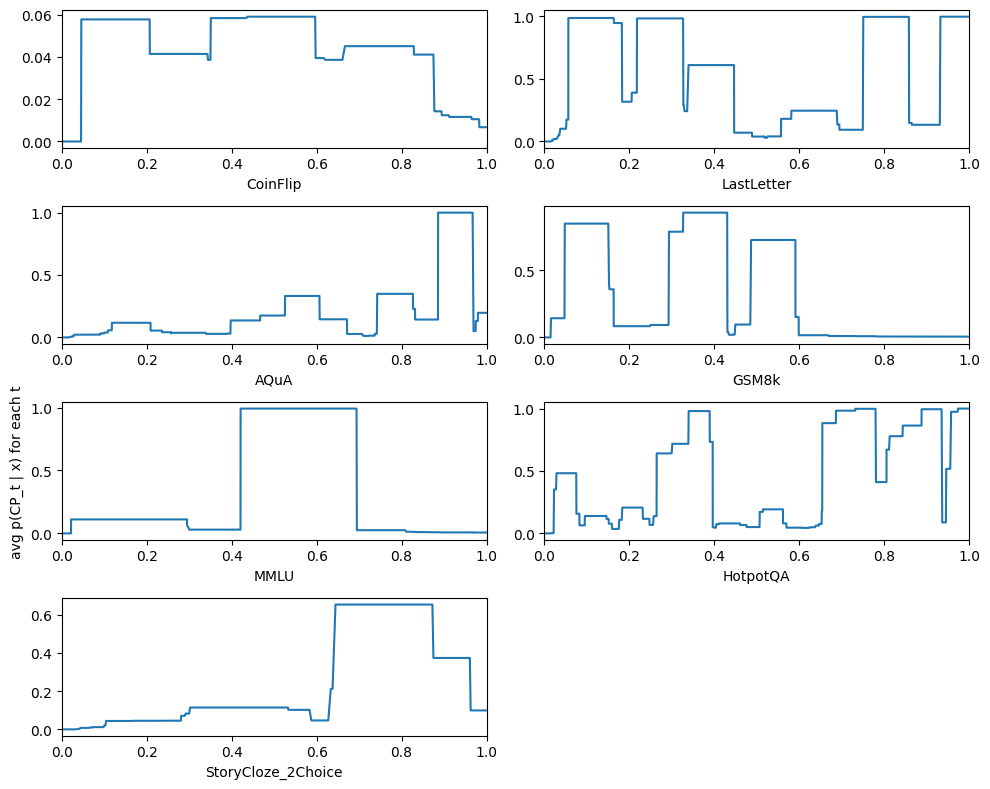

In [42]:
# plt.rcParams['figure.figsize'] = (4, 2)

n_bins = 10

seq_end_y = 0.0  # -.05  #0.0

fig, axs = plt.subplots(4, 2, figsize=(10, 8))

rows = []
for task, task_trends in rb_trends.items():
    ax = axs[task_coords[task]]

    max_y_len = max([trend.cpOccPr.shape[0] for trend in task_trends.values()])
    # achanges = np.stack([ np.concatenate([trend.cpOccPr, np.zeros(max_y_len - trend.cpOccPr.shape[0])])
    #                       for trend in task_trends.values()])

    dff = pd.DataFrame([{'idx': t / trend.cpOccPr.shape[0],
                       'cp_pr': y_t,
                       'qa_idx': qa_idx}    
            for qa_idx, trend in task_trends.items()
            for t, y_t in enumerate(   np.concatenate([trend.cpOccPr, seq_end_y * np.ones(max_y_len - trend.cpOccPr.shape[0])]))
          ])

    df_max = dff[['idx', 'cp_pr']].groupby(['idx']).aggregate('max').reset_index()
    df_max = df_max.sort_values(by='idx').reset_index()

    df_max['window'] = running_fn_window(df_max['cp_pr'].to_numpy(), window_size=100)
    
    
    
    sns.lineplot(
        df_max,
        x='idx',
        y='window',
        ax=ax,
        # bins=10,
        # binrange=(0, 1),
        # hue='qa_idx',
        # lw=1, alpha=1
        # errorbar=('pi', 100)
    )

    ax.set_xlim(0, 1)
    ax.set_xlabel(task)
    ax.set_ylabel(None)
    
axs[(2, 0)].set_ylabel('avg p(CP_t | x) for each t')

axs[(3, 1)].set_xticks([])
axs[(3, 1)].set_yticks([])
sns.despine(ax=axs[(3, 1)], left=True, bottom=True)
# axs[(3, 1)].set_xlabel('Maximum value of abrupt change in CPD$(y)$')
# axs[(0,0)].set_title('Distribution of Maximum abrupt change in CPD$(y)$')


# print('Distribution of change effect size. Important for determining if a change was big enough.')
plt.tight_layout();
# plt.show()

# model grid search loop over alpha values + distance metrics

In [3]:
def rescale_alpha2(y, base=5, exp=1000):
    y_range = y.max() - y.min()
    return base + (exp ** (1.0 - y_range))   # exp ^ (value in range [0, 1], inverse prop. to |y|)

n_cpus = 10
rb_objs = defaultdict(lambda: defaultdict(dict))


for task in tqdm(ans_fn_bytask.keys()):
    path = f'./out/gpt3.5-instruct-30s-300t/{task}'

    
    files = [f.split('.pk')[0] for f in os.listdir(path) if '.pk' in f]
    
    for qa_idx in tqdm(files):
        
        fname = f'./out/gpt3.5-instruct-30s-300t/{task}/{qa_idx}'
        
        base_res, response_extends, samples_by_ext, ans_by_ext, _, _, _ = pickle.load(open(f'{fname}.pk', 'rb'))
        args_json = json.load(open(f'{fname}.json'))
        
        ans_df = answers_to_df(ans_by_ext, samples_by_ext, response_extends, 
                               ans_parse_fn=ans_fn_bytask[task])
        
        idx_df, idx_tok_df = get_idx_df(ans_df, tok_weighted=True, ext_weighted=True, 
                                normalize_tok=True, normalize_ext=True, normalize_idx=True,
                                weighted_thresh=.1, max_n_ans=6, other_tok='*Other')  # ='$\\it{Other}$')


        dist_df = get_dists(idx_df)
        dist_df = dist_df.sort_values(by='idx')
        time  = dist_df['idx'].to_numpy()
        

        def run_beast(args):
            base, exp, dist_fn = args

            y = dist_df[dist_fn].to_numpy()
            alpha2 = rescale_alpha2(y, base=base, exp=1000)
    
            o = Rbeast.beast(
                y, time=time, season='none',
                tcp_minmax=[0, 6],  torder_minmax=[0, 1], # tseg_minlength=20,
                mcmc_seed=0, mcmc_chains=10,
                mcmc_burnin=1000, mcmc_samples=20000, mcmc_thin=5,
                
                precPriorType='constant', precValue=10,
                alpha1=.01,          # https://github.com/zhaokg/Rbeast/blob/master/R/src/beastv2_io_in_args.c#L898
                alpha2=alpha2,       # min alpha2: MIN_ALPHA2_VALUE=.0001
                
                print_progress=False, print_options=False, quiet=True, 
            )
            gc.collect()
            return o


            # ------------------------------------------------------------------------------
        args_ls = list(itertools.product([1, 2, 5, 10], [10, 100, 1000, 10000], ['d_kl', 'd_cos', 'd_l1', 'd_l2']))
        with Pool(n_cpus) as pool:
            o_parallel = list(pool.imap(run_beast, args_ls))       # list(tqdm(.. , total=len(alpha_pars_ls)))
        
        for args, o in zip(args_ls, o_parallel):
            rb_objs[task][qa_idx][args] = o

        del o_parallel
        gc.collect()

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

##### scratch

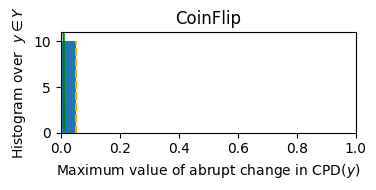

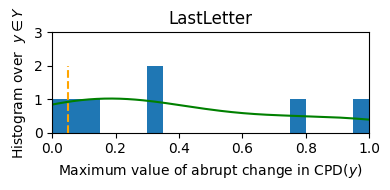

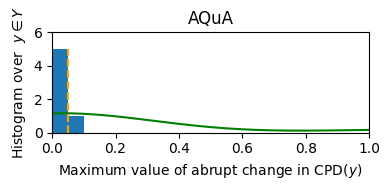

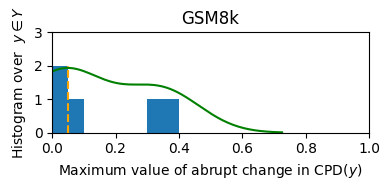

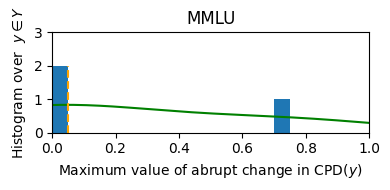

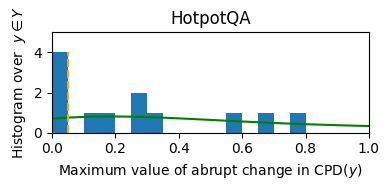

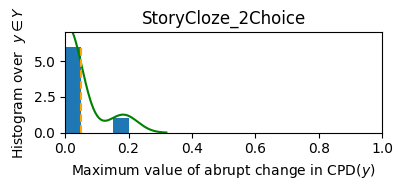

In [36]:
plt.rcParams['figure.figsize'] = (4, 2)


rows = []
for task, task_trends in rb_trends.items():
    achanges = [np.nanmax(abs(trend.cpAbruptChange)) for trend in task_trends.values()]
    sns.kdeplot(x=achanges, color='green')
    n = plt.hist(achanges, range=(0, 1), bins=20)
    ymax = max(n[0])
    plt.xlim(0, 1);
    plt.ylim(0, ymax+1)
    plt.ylabel('Histogram over  $y \in Y$')
    plt.xlabel('Maximum value of abrupt change in CPD$(y)$')
    plt.title(task)
    plt.vlines(.05, 0, ymax, ls='--', color='orange')
    plt.tight_layout()
    plt.show()

### synthetic data

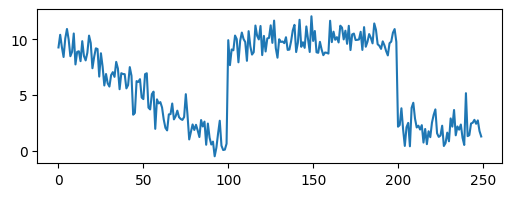

In [19]:
cp2_data = np.concatenate([np.random.normal(0,  1, 100) + np.linspace(10, 0, 100), 
                           np.random.normal(10, 1, 100),
                           np.random.normal(2,  1, 50)])

plt.rcParams['figure.figsize'] = (6, 2)
plt.plot(cp2_data)

<Axes: xlabel='idx', ylabel='Ax'>

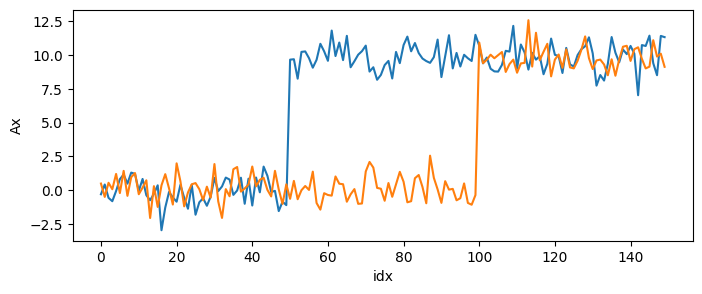

In [20]:
sim_data_2var = pd.DataFrame(
    [{'idx': i, 'Ax': np.random.normal(0), 'Bx': np.random.normal(0)} for i in range(50)] + \
    [{'idx': i, 'Ax': np.random.normal(10), 'Bx': np.random.normal(0)} for i in range(50, 100)] + \
    [{'idx': i, 'Ax': np.random.normal(10), 'Bx': np.random.normal(10)} for i in range(100, 150)])

plt.rcParams['figure.figsize'] = (8, 3)
sns.lineplot(sim_data_2var, x='idx', y='Ax', errorbar=None)
sns.lineplot(sim_data_2var, x='idx', y='Bx', errorbar=None)

# o = get_rb(sim_data, shuffle=False, print_=True)
